# Validation Experiment

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import random

# import deconvolution methods
import cellanneal
from Kassandra.core.mix import Mixers
from Kassandra.core.cell_types import CellTypes
from Kassandra.core.model import DeconvolutionModel
from Kassandra.core.plotting import print_cell_matras, cells_p, print_all_cells_in_one
from Kassandra.core.utils import *
from scipy.optimize import nnls
from sklearn.svm import NuSVR
from sklearn.svm import LinearSVR
from sklearn.preprocessing import StandardScaler


# statistical tests
import scipy.stats
from scipy.stats import pearsonr
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error as mse
from sklearn.metrics import r2_score

# stats & plot specific from .py files
from src.plot import Plot
from stats import statsTest
from src.helper import flatten, gene_intersection
import src.project_configs as project_configs
from src.deconv import Deconvolution

from tqdm import tqdm

train_flag = False

In [10]:
# plot parameters all coming from project.configurations
plt.style.use(project_configs.style)
plt.rcParams['font.family'] = project_configs.font_family
plt.rcParams['font.serif'] = project_configs.font_serif
plt.rcParams['font.monospace'] = project_configs.font_monospace
plt.rcParams['font.size'] = project_configs.font_size
plt.rcParams['axes.labelsize'] = project_configs.axes_label_size
plt.rcParams['axes.labelweight'] = project_configs.axes_label_weight
plt.rcParams['axes.titlesize'] = project_configs.axes_title_size
plt.rcParams['xtick.labelsize'] = project_configs.xtick_label_size
plt.rcParams['ytick.labelsize'] = project_configs.ytick_label_size
plt.rcParams['legend.fontsize'] = project_configs.legend_font_size 
plt.rcParams['figure.titlesize'] = project_configs.figure_title_size
plt.rcParams['image.cmap'] = project_configs.image_cmap 
plt.rcParams['image.interpolation'] = project_configs.image_interpolation 
plt.rcParams['figure.figsize'] = project_configs.figure_size
plt.rcParams['axes.grid']=project_configs.axes_grid
plt.rcParams['lines.linewidth'] = project_configs.lines_line_width
plt.rcParams['lines.markersize'] = project_configs.lines_marker_size
cells_p = project_configs.cells_p

## load data

In [2]:
signature = pd.read_csv('../data/ibd_signature_whole.csv',index_col=0).T
atap_bulk = pd.read_csv('../data/atap.pseudobulk_counts.log_normal.csv',index_col=0).T
atap_true = pd.read_csv('../data/atap.scg_proportions.csv',index_col=0).T
cleveland_bulk = pd.read_csv('../data/cleveland.pseudobulk_counts.log_normal.csv',index_col=0).T
cleveland_true = pd.read_csv('../data/cleveland.scg_proportions.csv',index_col=0).T
lmu_bulk = pd.read_csv('../data/lmu.pseudobulk_counts.log_normal.csv',index_col=0).T
lmu_true = pd.read_csv('../data/lmu.scg_proportions.csv',index_col=0).T

lab_expr = pd.read_csv("./Kassandra/trainingData/laboratory_data_expressions.tsv",sep="\t",index_col=0)
lab_annot = pd.read_csv("./Kassandra/trainingData/laboratory_data_annotation.tsv",sep="\t",index_col=0)
lab_annot["Dataset"] = lab_annot.index
lab_annot = lab_annot.iloc[:, [1, 0]]
compartment_signature = pd.read_csv('../../../../../cbbi-data00/projects/Methods/bulk-deconvolution/marker_gene_expression.by_compartments.csv',index_col=0).T

atap_raw = pd.read_csv('../../../../../..//mnt/cbbi-data00/projects/Methods/bulk-deconvolution/test-data/atap.pseudobulk_counts.csv',index_col=0).T
cleveland_raw = pd.read_csv('../../../../../..//mnt/cbbi-data00/projects/Methods/bulk-deconvolution/test-data/cleveland.pseudobulk_counts.csv',index_col=0).T
lmu_raw = pd.read_csv('../../../../../..//mnt/cbbi-data00/projects/Methods/bulk-deconvolution/test-data/lmu.pseudobulk_counts.csv',index_col=0).T

df_raw = pd.merge(atap_raw, cleveland_raw, left_index=True, right_index=True)
df_raw = pd.merge(df_raw, lmu_raw, left_index=True, right_index=True )

## train methods

In [4]:
deconvolution_object = Deconvolution()
plot_object = Plot()

In [9]:
if train_flag:
    atap_models = deconvolution_object.train(signature, atap_bulk)
    cleveland_models = deconvolution_object.train(signature, cleveland_bulk)
    lmu_models = deconvolution_object.train(signature, lmu_bulk)

## plot and benchmark by residual

In [7]:
cellanneal_atap = pd.read_csv("../data/results3/cellanneal_atap.csv",index_col = 0)
cellanneal_cleveland = pd.read_csv("../data/results3/cellanneal_cleveland.csv",index_col = 0)
cellanneal_lmu = pd.read_csv("../data/results3/cellanneal_lmu.csv",index_col = 0)

svr_atap = pd.read_csv("../data/results3/svr_atap.csv",index_col = 0).T
svr_cleveland = pd.read_csv("../data/results3/svr_cleveland.csv",index_col = 0).T
svr_lmu = pd.read_csv("../data/results3/svr_lmu.csv",index_col = 0).T

In [3]:
atap_true = atap_true.T
cleveland_true = cleveland_true.T
lmu_true = lmu_true.T

In [4]:
atap_true_general =pd.DataFrame()          
atap_true_general['Myeloid'] = atap_true['CD209+ moDC'] + atap_true['CD83+ CLEC9A+ DC'] + atap_true['CD83- CLEC9A+ DC']+atap_true['CLEC10A+ DC']+atap_true['IL7R+ Activated DC']+atap_true['Mast Cell']+atap_true['Memory B cell']+atap_true['Monocyte Inflammatory']+atap_true['Proliferating myeloid']+atap_true['Resident Macrophage']

atap_true_general['T Cell'] = atap_true['CD4 SELL naive'] + atap_true['CD4 TRM'] + atap_true['CD4 Tfh']+atap_true['CD4 Th17']+atap_true['CD4 Tph']+atap_true['CD4 Treg']+atap_true['CD8 Effector']+atap_true['CD8 IEL']+atap_true['CD8 SELL Naive']+atap_true['ILC3']+atap_true['MAIT']+atap_true['NK']+atap_true['Proliferating T cells']+atap_true['gd T cell 1']+atap_true['gd T cell 2']

atap_true_general['B Cell'] = atap_true['GC-like B cell'] + atap_true['Memory B cell'] + atap_true['Naive B cell']+atap_true['Plasma Cell']+atap_true['Plasmablast']

atap_true_general['Stroma'] = atap_true['Arterial Pericyte'] + atap_true['Blood Endothelial Cell'] + atap_true['Fibroblast']+atap_true['Glial Cell']+atap_true['Inflammatory Fibroblast']+atap_true['Myofibroblast']+atap_true['Pericyte']+atap_true['Post-capillary venules']+atap_true['Proliferating Stromal Cell']+atap_true['Smooth Muscle Cell']

atap_true_general['Epithelium'] = atap_true['Enterocyte'] + atap_true['Enteroendocrine Cell'] + atap_true['Epithelial M Cell']+atap_true['Epithelial Progenitor Cell']+atap_true['Epithelial Stem Cell']+atap_true['Goblet Cell']+atap_true['Tuft Cell']

In [5]:
cleveland_true_general =pd.DataFrame()          
cleveland_true_general['Myeloid'] = cleveland_true['CD209+ moDC'] + cleveland_true['CD83+ CLEC9A+ DC'] + cleveland_true['CD83- CLEC9A+ DC']+cleveland_true['CLEC10A+ DC']+cleveland_true['IL7R+ Activated DC']+cleveland_true['Mast Cell']+cleveland_true['Memory B cell']+cleveland_true['Monocyte Inflammatory']+cleveland_true['Proliferating myeloid']+cleveland_true['Resident Macrophage']

cleveland_true_general['T Cell'] = cleveland_true['CD4 SELL naive'] + cleveland_true['CD4 TRM'] + cleveland_true['CD4 Tfh']+cleveland_true['CD4 Th17']+cleveland_true['CD4 Tph']+cleveland_true['CD4 Treg']+cleveland_true['CD8 Effector']+cleveland_true['CD8 IEL']+cleveland_true['CD8 SELL Naive']+cleveland_true['ILC3']+cleveland_true['MAIT']+cleveland_true['NK']+cleveland_true['Proliferating T cells']+cleveland_true['gd T cell 1']+cleveland_true['gd T cell 2']

cleveland_true_general['B Cell'] = cleveland_true['GC-like B cell'] + cleveland_true['Memory B cell'] + cleveland_true['Naive B cell']+cleveland_true['Plasma Cell']+cleveland_true['Plasmablast']

cleveland_true_general['Stroma'] = cleveland_true['Arterial Pericyte'] + cleveland_true['Blood Endothelial Cell'] + cleveland_true['Fibroblast']+cleveland_true['Glial Cell']+cleveland_true['Inflammatory Fibroblast']+cleveland_true['Myofibroblast']+cleveland_true['Pericyte']+cleveland_true['Post-capillary venules']+cleveland_true['Proliferating Stromal Cell']+cleveland_true['Smooth Muscle Cell']

cleveland_true_general['Epithelium'] = cleveland_true['Enterocyte'] + cleveland_true['Enteroendocrine Cell'] + cleveland_true['Epithelial M Cell']+cleveland_true['Epithelial Progenitor Cell']+cleveland_true['Epithelial Stem Cell']+cleveland_true['Goblet Cell']+cleveland_true['Tuft Cell']

In [6]:
lmu_true_general =pd.DataFrame()          
lmu_true_general['Myeloid'] = lmu_true['CD209+ moDC'] + lmu_true['CD83+ CLEC9A+ DC'] + lmu_true['CD83- CLEC9A+ DC']+lmu_true['CLEC10A+ DC']+lmu_true['IL7R+ Activated DC']+lmu_true['Mast Cell']+lmu_true['Memory B cell']+lmu_true['Monocyte Inflammatory']+lmu_true['Proliferating myeloid']+lmu_true['Resident Macrophage']

lmu_true_general['T Cell'] = lmu_true['CD4 SELL naive'] + lmu_true['CD4 TRM'] + lmu_true['CD4 Tfh']+lmu_true['CD4 Th17']+lmu_true['CD4 Tph']+lmu_true['CD4 Treg']+lmu_true['CD8 Effector']+lmu_true['CD8 IEL']+lmu_true['CD8 SELL Naive']+lmu_true['ILC3']+lmu_true['MAIT']+lmu_true['NK']+lmu_true['Proliferating T cells']+lmu_true['gd T cell 1']+lmu_true['gd T cell 2']

lmu_true_general['B Cell'] = lmu_true['GC-like B cell'] + lmu_true['Memory B cell'] + lmu_true['Naive B cell']+lmu_true['Plasma Cell']+lmu_true['Plasmablast']

lmu_true_general['Stroma'] = lmu_true['Arterial Pericyte'] + lmu_true['Blood Endothelial Cell'] + lmu_true['Fibroblast']+lmu_true['Glial Cell']+lmu_true['Inflammatory Fibroblast']+lmu_true['Myofibroblast']+lmu_true['Pericyte']+lmu_true['Post-capillary venules']+lmu_true['Proliferating Stromal Cell']+lmu_true['Smooth Muscle Cell']

lmu_true_general['Epithelium'] = lmu_true['Enterocyte'] + lmu_true['Enteroendocrine Cell'] + lmu_true['Epithelial M Cell']+lmu_true['Epithelial Progenitor Cell']+lmu_true['Epithelial Stem Cell']+lmu_true['Goblet Cell']+lmu_true['Tuft Cell']

# rmse

In [11]:
def boxlplot(df1,df2,title,type):
    patch_artist=True
    datasets = [df1.T,df2.T]

    colours = ['red','blue']

    groups = ['Cellanneal', 'SVR']

    x_pos_range = np.arange(len(datasets)) / (len(datasets) - 1)
    x_pos = (x_pos_range * 0.5) + 0.75

    for i, data in enumerate(datasets):
        bp = plt.boxplot(
            np.array(data), sym='', whis=[0, 100], widths=0.6 / len(datasets),
            labels=list(datasets[0]), patch_artist=True,
            positions=[x_pos[i] + j * 1 for j in range(len(data.T))]
        )
        # Fill the boxes with colours (requires patch_artist=True)
        k = i % len(colours)
        for box in bp['boxes']:
            box.set(facecolor=colours[k])
        for element in ['boxes', 'fliers', 'means', 'medians']:
            plt.setp(bp[element], color=colours[k])
        for element in ['whiskers', 'caps']:
            plt.setp(bp[element], color=colours[k])
            plt.setp(bp[element], color=colours[k])
    # Legend
    legend_elements = []
    for i in range(len(datasets)):
        j = i % len(groups)
        k = i % len(colours)
        legend_elements.append(Patch(facecolor=colours[k], label=groups[j]))
    plt.legend(handles=legend_elements, fontsize=8)
    plt.xticks(((np.arange(len(list(datasets[0]))) + 1)),rotation=90)
    plt.title(title)
    plt.ylabel(type)
    plt.xlabel("Cell Types")
    plt.show()

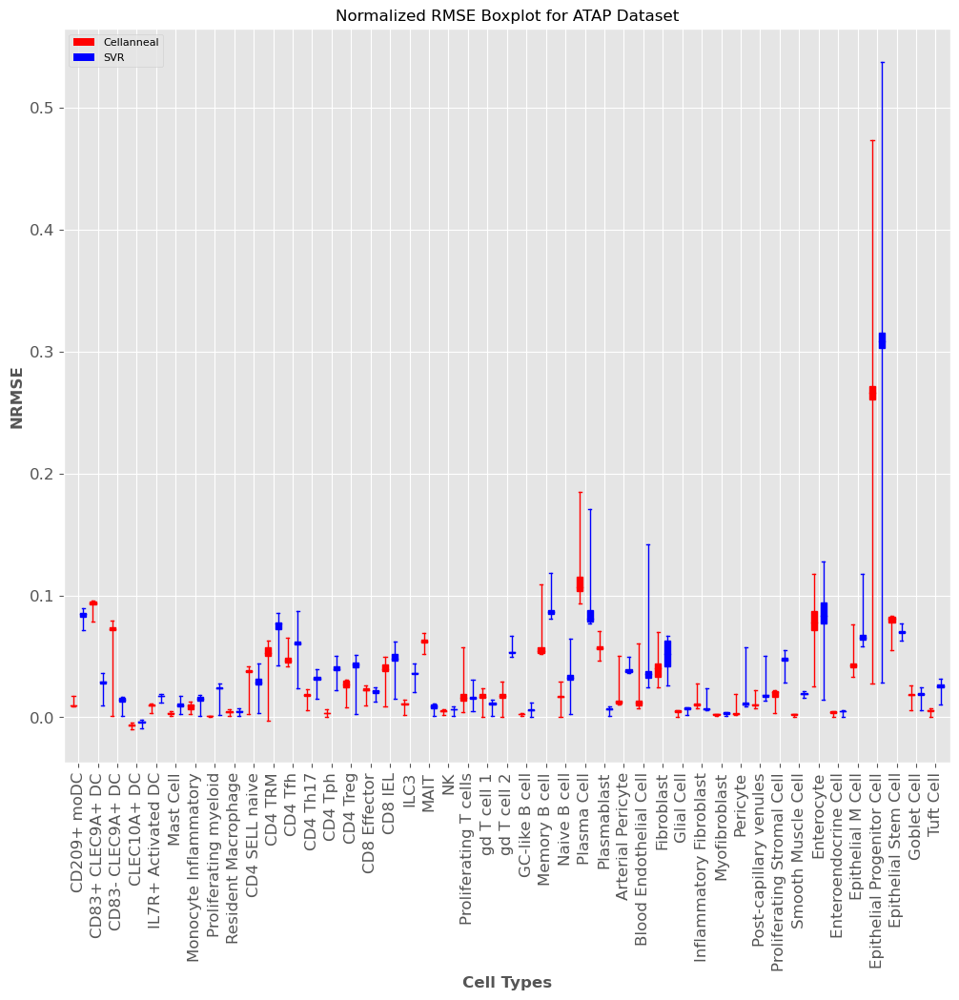

In [12]:
from sklearn.metrics import mean_squared_error
import numpy as np
from matplotlib.patches import Patch

atap_cellanneal_df = pd.DataFrame()
atap_svr_df = pd.DataFrame()

for cell in cellanneal_atap.columns:
        try:
            #atap_cellanneal_df[cell] = lmu_true[cell] - cellanneal_lmu[cell]
            atap_cellanneal_df[cell] = [mean_squared_error(atap_true[cell][:(i+1)], cellanneal_atap[cell][:(i+1)], squared=False) - atap_true[cell].min() / (atap_true[cell].max() - atap_true[cell].min()) for i in range(atap_true.shape[0])]
        except KeyError:
            continue
    
for cell in svr_atap.columns:
        try:
            #atap_svr_df[cell] = lmu_true[cell] - svr_lmu[cell]
            atap_svr_df[cell] = [mean_squared_error(atap_true[cell][:(i+1)], svr_atap[cell][:(i+1)], squared=False) - atap_true[cell].min() / (atap_true[cell].max() - atap_true[cell].min()) for i in range(atap_true.shape[0])]
        except KeyError:
            continue

atap_cellanneal_df = atap_cellanneal_df.T
atap_svr_df = atap_svr_df.T
atap_svr_df = atap_svr_df.dropna()
atap_cellanneal_df = atap_cellanneal_df.dropna()
boxlplot(atap_cellanneal_df, atap_svr_df, "Normalized RMSE Boxplot for ATAP Dataset", "NRMSE")

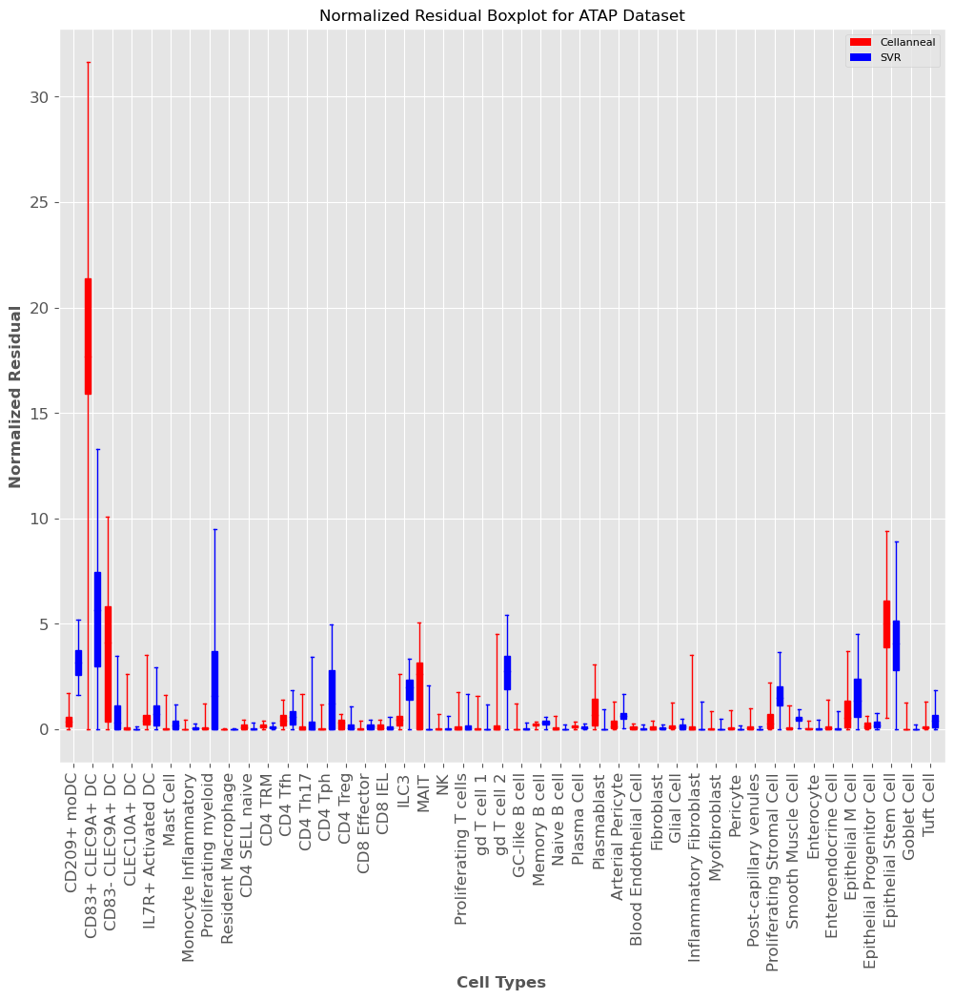

In [17]:
atap_cellanneal_df = pd.DataFrame()
atap_svr_df = pd.DataFrame()

for cell in cellanneal_atap.columns:
        try:
            atap_cellanneal_df[cell] = abs(atap_true[cell] - cellanneal_atap[cell] - atap_true[cell].min()) / (atap_true[cell].max() - atap_true[cell].min()))
        except KeyError:
            continue
    
for cell in svr_atap.columns:
        try:
            atap_svr_df[cell] = abs(atap_true[cell] - svr_atap[cell] - atap_true[cell].min()) / (atap_true[cell].max() - atap_true[cell].min()))
        except KeyError:
            continue

atap_cellanneal_df = atap_cellanneal_df.T
atap_svr_df = atap_svr_df.T
atap_svr_df = atap_svr_df.dropna()
atap_cellanneal_df = atap_cellanneal_df.dropna()
boxlplot(atap_cellanneal_df, atap_svr_df, "Normalized Residual Boxplot for ATAP Dataset", "Normalized Residual")


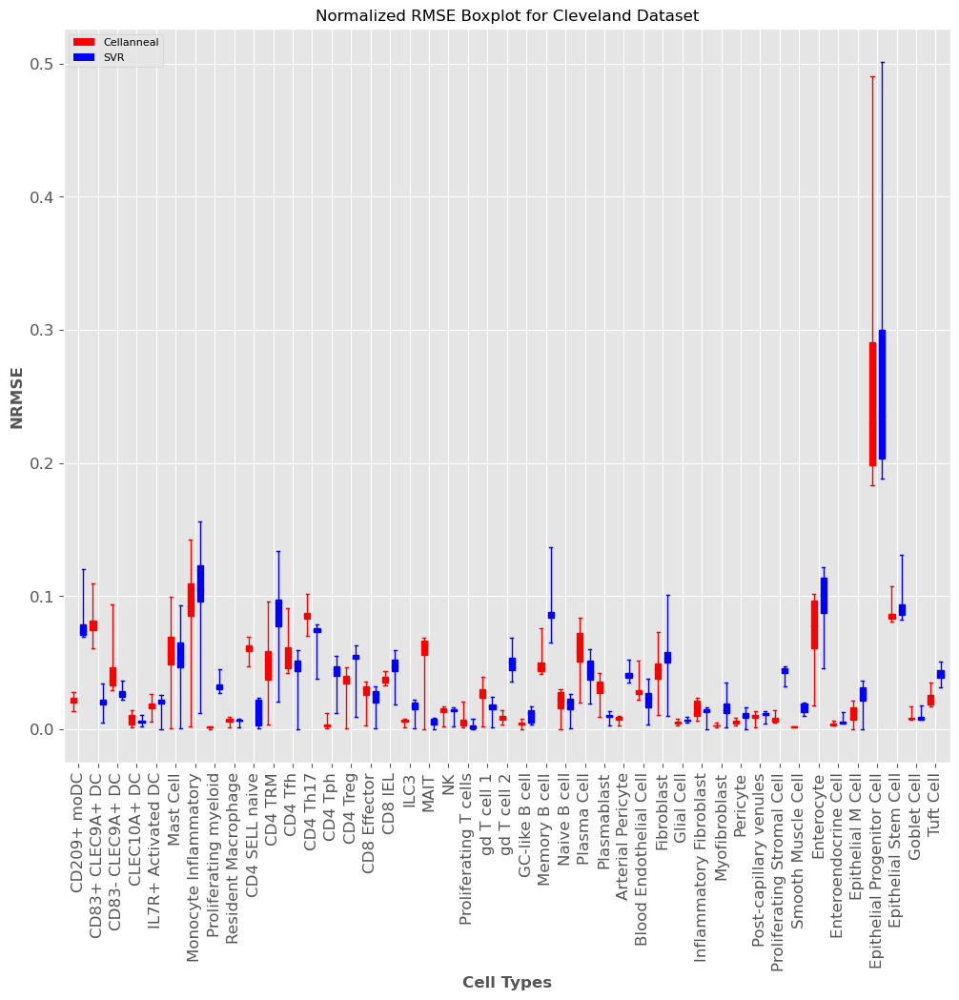

In [19]:
cle_cellanneal_df = pd.DataFrame()
cle_svr_df = pd.DataFrame()

for cell in cellanneal_cleveland.columns:
        try:
            #atap_cellanneal_df[cell] = lmu_true[cell] - cellanneal_lmu[cell]
            cle_cellanneal_df[cell] = [abs(mean_squared_error(cleveland_true[cell][:(i+1)], cellanneal_cleveland[cell][:(i+1)], squared=False) - cleveland_true[cell].min() / (cleveland_true[cell].max() - cleveland_true[cell].min())) for i in range(cleveland_true.shape[0])]
        except KeyError:
            continue
    
for cell in svr_cleveland.columns:
        try:
            #atap_svr_df[cell] = lmu_true[cell] - svr_lmu[cell]
            cle_svr_df[cell] = [abs(mean_squared_error(cleveland_true[cell][:(i+1)], svr_cleveland[cell][:(i+1)], squared=False) - cleveland_true[cell].min()/ (cleveland_true[cell].max() - cleveland_true[cell].min())) for i in range(cleveland_true.shape[0])]
        except KeyError:
            continue

cle_cellanneal_df = cle_cellanneal_df.T
cle_svr_df = cle_svr_df.T
cle_svr_df = cle_svr_df.dropna()
cle_cellanneal_df = cle_cellanneal_df.dropna()

boxlplot(cle_cellanneal_df, cle_svr_df, "Normalized RMSE Boxplot for Cleveland Dataset", "NRMSE")


# compartment level 

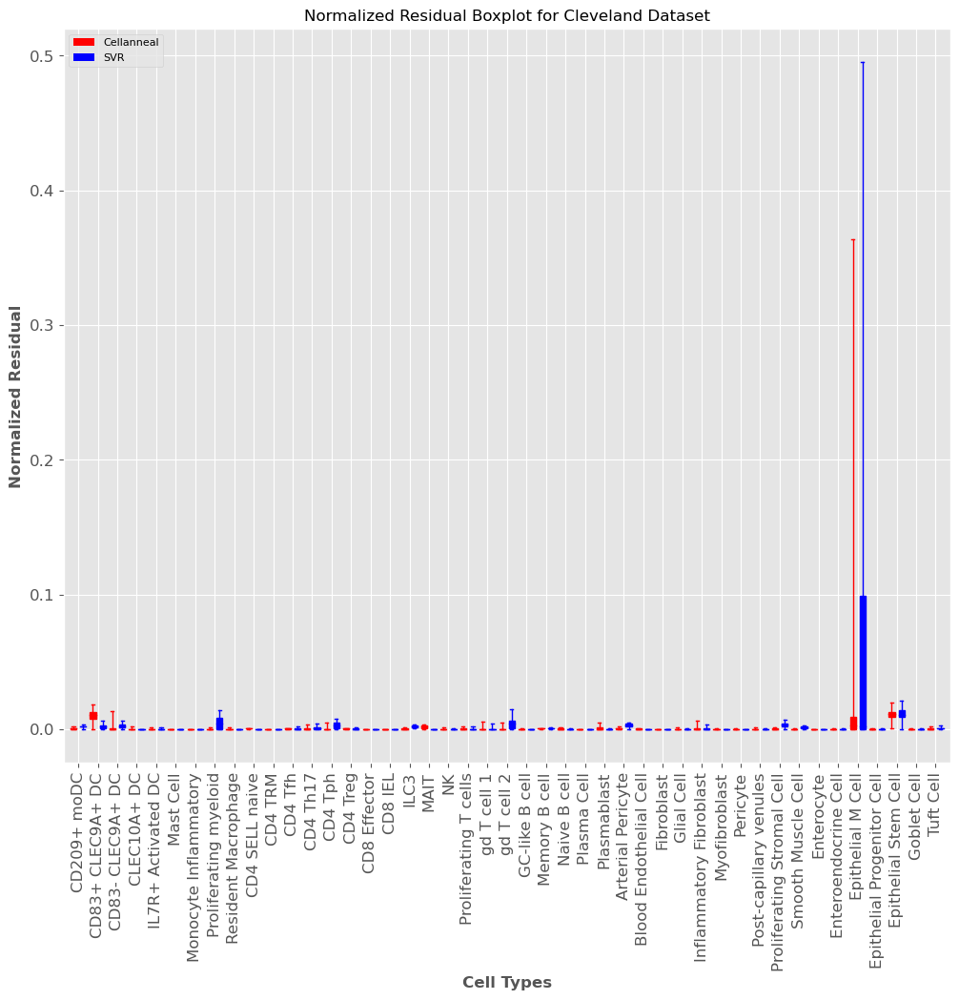

In [22]:
cle_cellanneal_df = pd.DataFrame()
cle_svr_df = pd.DataFrame()

for cell in cellanneal_cleveland.columns:
        try:
            cle_cellanneal_df[cell] = abs(cleveland_true[cell] - cellanneal_cleveland[cell] / (cleveland_true[cell].max() - cleveland_true[cell].min())) 
        except KeyError:
            continue
    
for cell in svr_cleveland.columns:
        try:
            cle_svr_df[cell] = abs(cleveland_true[cell] - svr_cleveland[cell] / (cleveland_true[cell].max() - cleveland_true[cell].min())) 
        except KeyError:
            continue

cle_cellanneal_df = cle_cellanneal_df.T
cle_svr_df = cle_svr_df.T
cle_svr_df = cle_svr_df.dropna()
cle_cellanneal_df = cle_cellanneal_df.dropna()
boxlplot(cle_cellanneal_df, cle_svr_df, "Normalized Residual Boxplot for Cleveland Dataset", "Normalized Residual")

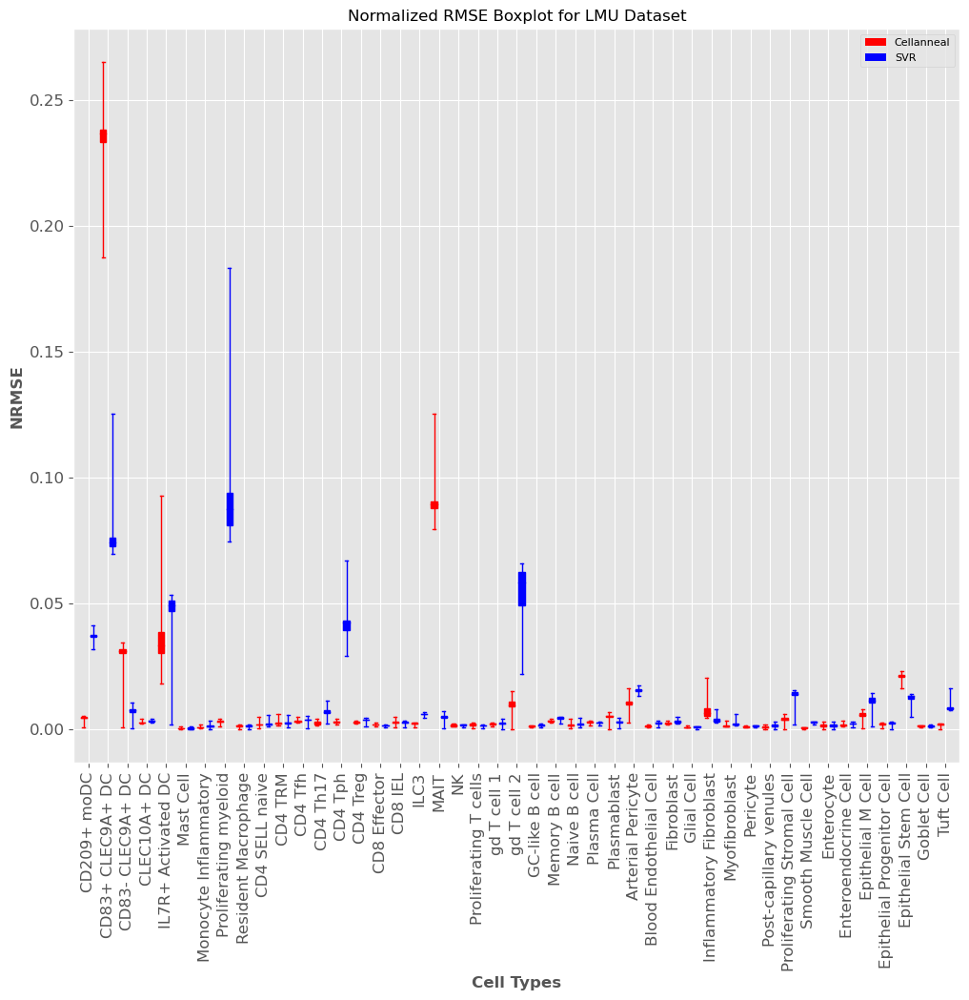

In [43]:
atap_cellanneal_df = pd.DataFrame()
atap_svr_df = pd.DataFrame()

for cell in cellanneal_lmu.columns:
        try:
            #atap_cellanneal_df[cell] = lmu_true[cell] - cellanneal_lmu[cell]
            atap_cellanneal_df[cell] = [mean_squared_error(lmu_true[cell][:(i+1)], cellanneal_lmu[cell][:(i+1)], squared=False) - lmu_true[cell].min() / (lmu_true[cell].max() - lmu_true[cell].min())/ for i in range(lmu_true.shape[0])]
        except KeyError:
            continue
    
for cell in svr_atap.columns:
        try:
            #atap_svr_df[cell] = lmu_true[cell] - svr_lmu[cell]
            atap_svr_df[cell] = [mean_squared_error(lmu_true[cell][:(i+1)], svr_lmu[cell][:(i+1)], squared=False) - lmu_true[cell].min()/ (lmu_true[cell].max() - lmu_true[cell].min())  for i in range(lmu_true.shape[0])]
        except KeyError:
            continue

atap_cellanneal_df = atap_cellanneal_df.T
atap_svr_df = atap_svr_df.T
atap_svr_df = atap_svr_df.dropna()
atap_cellanneal_df = atap_cellanneal_df.dropna()

boxlplot(atap_cellanneal_df, atap_svr_df, "Normalized RMSE Boxplot for LMU Dataset", "NRMSE")

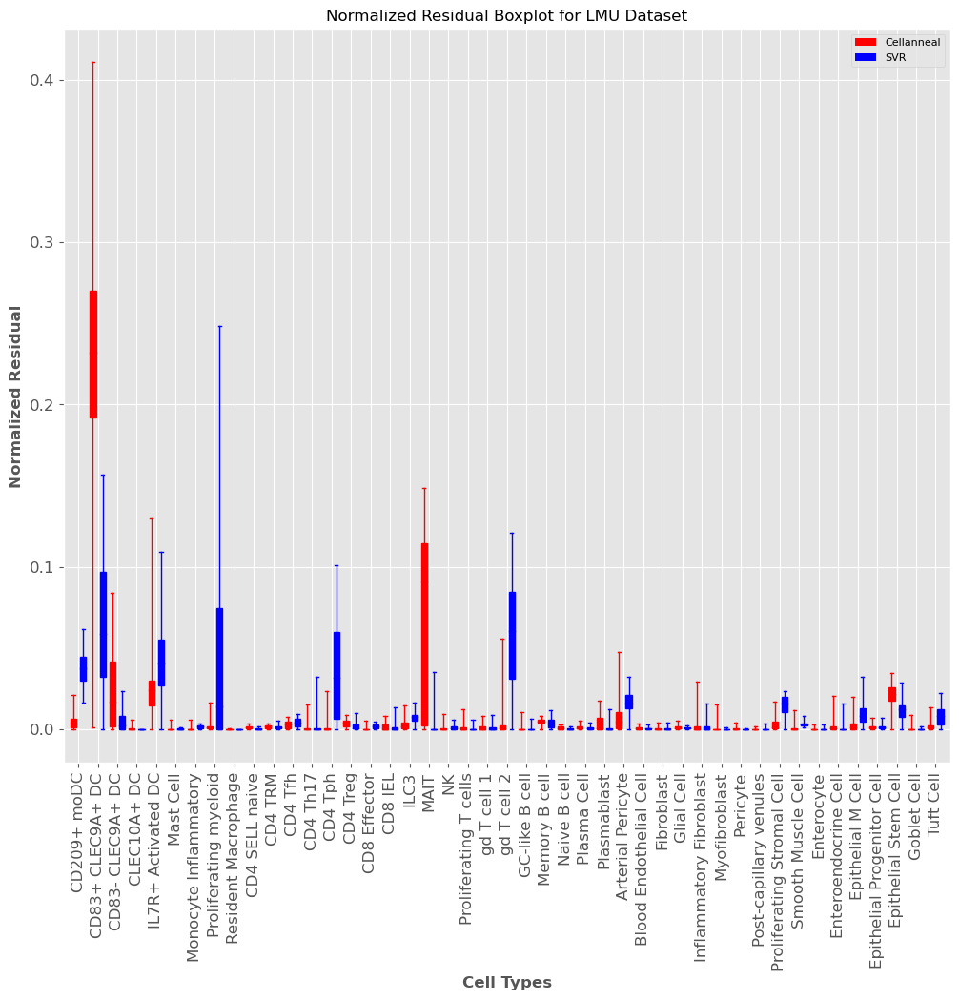

In [38]:
atap_cellanneal_df = pd.DataFrame()
atap_svr_df = pd.DataFrame()

for cell in cellanneal_lmu.columns:
        try:
            atap_cellanneal_df[cell] = abs(lmu_true[cell] - cellanneal_lmu[cell]  / (lmu_true[cell].max() - lmu_true[cell].min()) )/100
        except KeyError:
            continue
    
for cell in svr_lmu.columns:
        try:
            atap_svr_df[cell] = abs(lmu_true[cell] - svr_lmu[cell]  / (lmu_true[cell].max() - lmu_true[cell].min()) ) /100
        except KeyError:
            continue

atap_cellanneal_df = atap_cellanneal_df.T
atap_svr_df = atap_svr_df.T
atap_svr_df = atap_svr_df.dropna()
atap_cellanneal_df = atap_cellanneal_df.dropna()
boxlplot(atap_cellanneal_df, atap_svr_df, "Normalized Residual Boxplot for LMU Dataset", "Normalized Residual")

In [10]:
cellanneal_atap_compartment = pd.read_csv("../data/results3/cellanneal_atap_compartment2.csv",index_col = 0)
cellanneal_cleveland_compartment = pd.read_csv("../data/results3/cellanneal_cleveland_compartment2.csv",index_col = 0)
cellanneal_lmu_compartment = pd.read_csv("../data/results3/cellanneal_lmu_compartment2.csv",index_col = 0)

svr_atap_compartment = pd.read_csv("../data/results3/svr_atap_compartment2.csv",index_col = 0).T
svr_cleveland_compartment = pd.read_csv("../data/results3/svr_cleveland_compartment2.csv",index_col = 0).T
svr_lmu_compartment = pd.read_csv("../data/results3/svr_lmu_compartment2.csv",index_col = 0).T

kass_atap_compartment = pd.read_csv("../data/results3/kassandra_atap2.csv",index_col = 0).T
kass_cleveland_compartment = pd.read_csv("../data/results3/kassandra_cleveland2.csv",index_col = 0).T
kass_lmu_compartment = pd.read_csv("../data/results3/kassandra_lmu2.csv",index_col = 0).T

kass_atap_compartment["Stroma"] = kass_atap_compartment["Fibroblasts"] + kass_atap_compartment["Endothelium"] 
kass_atap_compartment = kass_atap_compartment[["B_cells", "T_cells", "Myeloid_cells", "Stroma"]]
kass_atap_compartment = kass_atap_compartment.rename(columns={"B_cells": "B Cell", "T_cells": "T Cell", "Myeloid_cells": "Myeloid"})
kass_atap_compartment["Epithelium"] = 0

kass_cleveland_compartment["Stroma"] = kass_cleveland_compartment["Fibroblasts"] + kass_cleveland_compartment["Endothelium"] 
kass_cleveland_compartment = kass_cleveland_compartment[["B_cells", "T_cells", "Myeloid_cells", "Stroma"]]
kass_cleveland_compartment = kass_cleveland_compartment.rename(columns={"B_cells": "B Cell", "T_cells": "T Cell", "Myeloid_cells": "Myeloid"})
kass_cleveland_compartment["Epithelium"] = 0

kass_lmu_compartment["Stroma"] = kass_lmu_compartment["Fibroblasts"] + kass_lmu_compartment["Endothelium"] 
kass_lmu_compartment = kass_lmu_compartment[["B_cells", "T_cells", "Myeloid_cells", "Stroma"]]
kass_lmu_compartment = kass_lmu_compartment.rename(columns={"B_cells": "B Cell", "T_cells": "T Cell", "Myeloid_cells": "Myeloid"})
kass_lmu_compartment["Epithelium"] = 0

In [194]:
def boxlplot2(df1,df2,df3,title,type):
    patch_artist=True
    datasets = [df1.T,df2.T,df3.T]

    colours = ['red','blue','green']

    groups = ['Cellanneal', 'SVR', 'Kassandra']

    x_pos_range = np.arange(len(datasets)) / (len(datasets) - 1)
    x_pos = (x_pos_range * 0.5) + 0.75

    for i, data in enumerate(datasets):
        bp = plt.boxplot(
            np.array(data), sym='', whis=[0, 100], widths=0.6 / len(datasets),
            labels=list(datasets[0]), patch_artist=True,
            positions=[x_pos[i] + j * 1 for j in range(len(data.T))]
        )
        # Fill the boxes with colours (requires patch_artist=True)
        k = i % len(colours)
        for box in bp['boxes']:
            box.set(facecolor=colours[k])
        for element in ['boxes', 'fliers', 'means', 'medians']:
            plt.setp(bp[element], color=colours[k])
        for element in ['whiskers', 'caps']:
            plt.setp(bp[element], color=colours[k])
            plt.setp(bp[element], color=colours[k])
    # Legend
    legend_elements = []
    for i in range(len(datasets)):
        j = i % len(groups)
        k = i % len(colours)
        legend_elements.append(Patch(facecolor=colours[k], label=groups[j]))
    plt.legend(handles=legend_elements, fontsize=8)
    plt.xticks(((np.arange(len(list(datasets[0]))) + 1)),rotation=90)
    plt.title(title)
    plt.ylabel(type)
    plt.xlabel("Cell Types")
    plt.show()

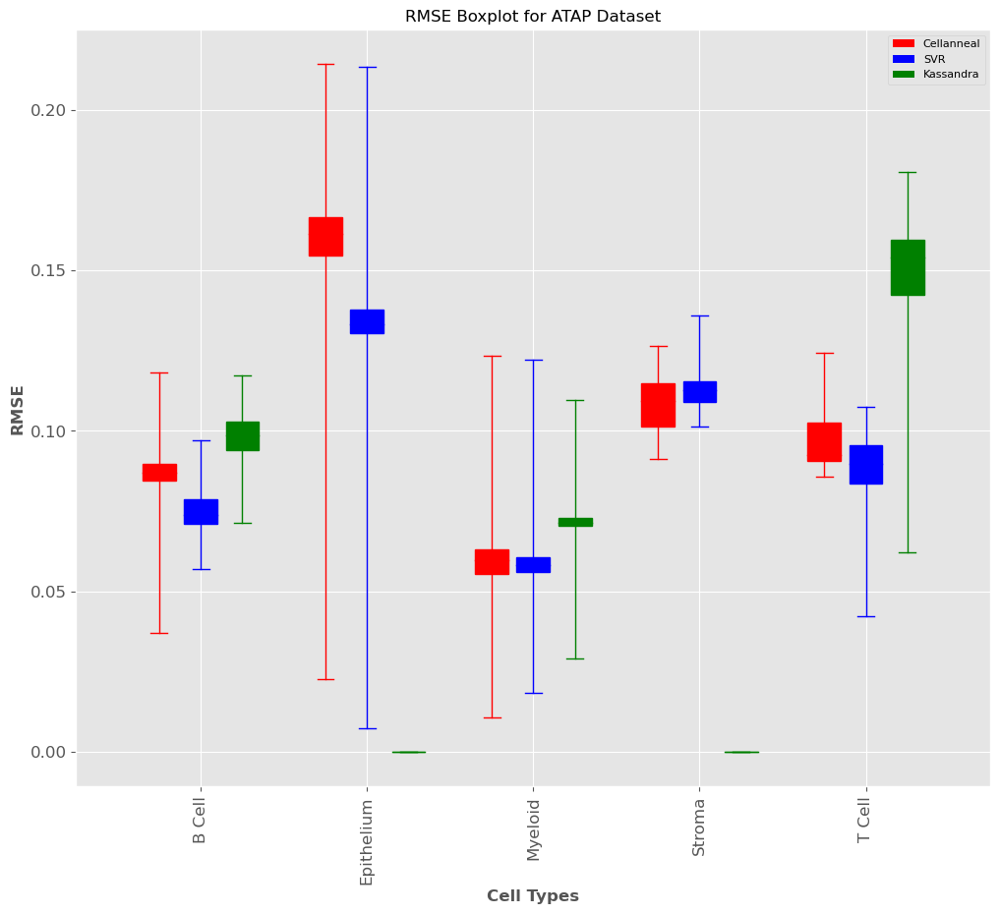

In [195]:
atap_cellanneal_df = pd.DataFrame()
atap_svr_df = pd.DataFrame()
atap_kass_df = pd.DataFrame()

for cell in atap_true_general.columns:
            #atap_cellanneal_df[cell] = lmu_true[cell] - cellanneal_lmu[cell]
            atap_cellanneal_df[cell] = [mean_squared_error(atap_true_general[cell][:(i+1)], cellanneal_atap_compartment[cell][:(i+1)], squared=False) for i in range(atap_true_general.shape[0])]
    
for cell in atap_true_general.columns:
            #atap_svr_df[cell] = lmu_true[cell] - svr_lmu[cell]
            atap_svr_df[cell] = [mean_squared_error(atap_true_general[cell][:(i+1)], svr_atap_compartment[cell][:(i+1)], squared=False) for i in range(atap_true_general.shape[0])]

for cell in atap_true_general.columns:
            atap_kass_df[cell] = [mean_squared_error(atap_true_general[cell][:(i+1)], kass_atap_compartment[cell][:(i+1)], squared=False) for i in range(atap_true_general.shape[0])]

atap_cellanneal_df = atap_cellanneal_df.T
atap_svr_df = atap_svr_df.T
atap_kass_df = atap_kass_df.T
atap_kass_df.T["Stroma"].values[:] = 0 
atap_kass_df.T["Epithelium"].values[:] = 0 
atap_cellanneal_df = atap_cellanneal_df.sort_index()
atap_svr_df = atap_svr_df.sort_index()
atap_kass_df = atap_kass_df.sort_index()


boxlplot2(atap_cellanneal_df, atap_svr_df, atap_kass_df, "RMSE Boxplot for ATAP Dataset", "RMSE")

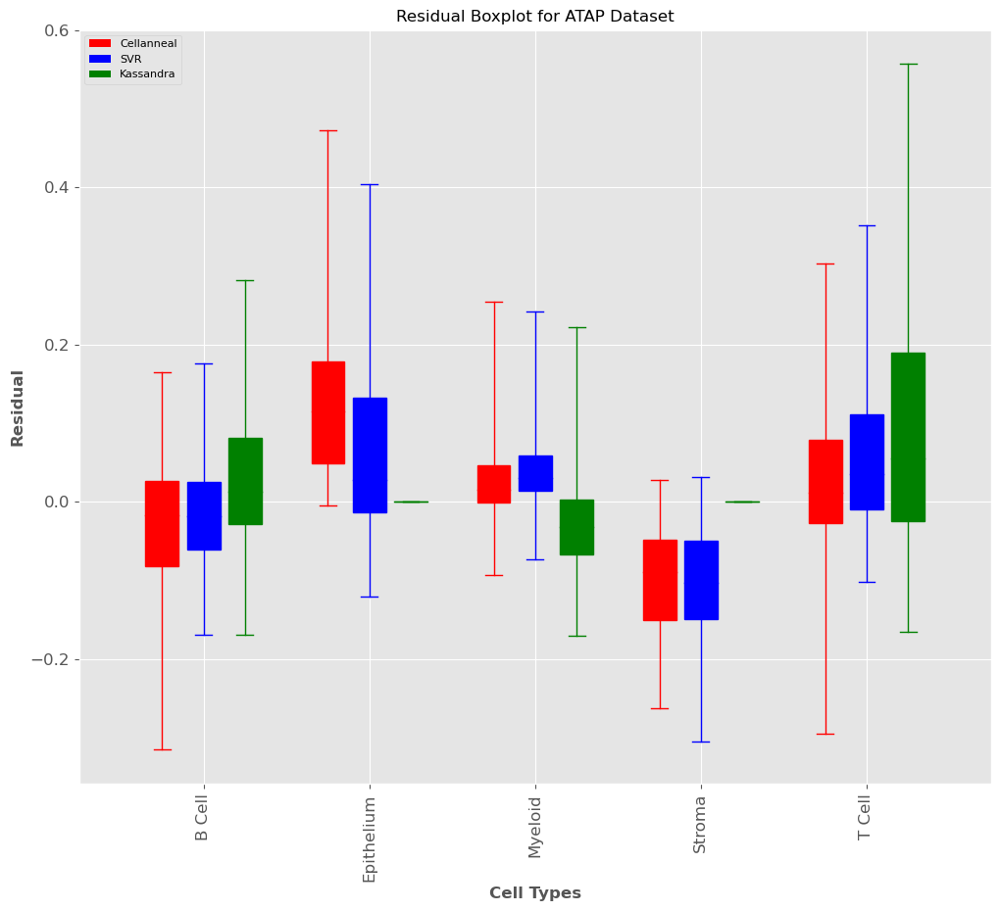

In [32]:
atap_cellanneal_df = pd.DataFrame()
atap_svr_df = pd.DataFrame()
atap_kass_df = pd.DataFrame()

for cell in cellanneal_atap_compartment.columns:
        try:
            atap_cellanneal_df[cell] = atap_true_general[cell] - cellanneal_atap_compartment[cell]
        except KeyError:
            continue
    
for cell in svr_atap_compartment.columns:
        try:
            atap_svr_df[cell] = atap_true_general[cell] - svr_atap_compartment[cell]
        except KeyError:
            continue

for cell in kass_atap_compartment.columns:
        try:
            atap_kass_df[cell] = atap_true_general[cell] - kass_atap_compartment[cell]
        except KeyError:
            continue

atap_cellanneal_df = atap_cellanneal_df.T
atap_svr_df = atap_svr_df.T
atap_kass_df = atap_kass_df.T
atap_kass_df.T["Stroma"].values[:] = 0 
atap_kass_df.T["Epithelium"].values[:] = 0 
atap_cellanneal_df = atap_cellanneal_df.sort_index()
atap_svr_df = atap_svr_df.sort_index()
atap_kass_df = atap_kass_df.sort_index()

boxlplot2(atap_cellanneal_df, atap_svr_df, atap_kass_df, "Residual Boxplot for ATAP Dataset", "Residual")

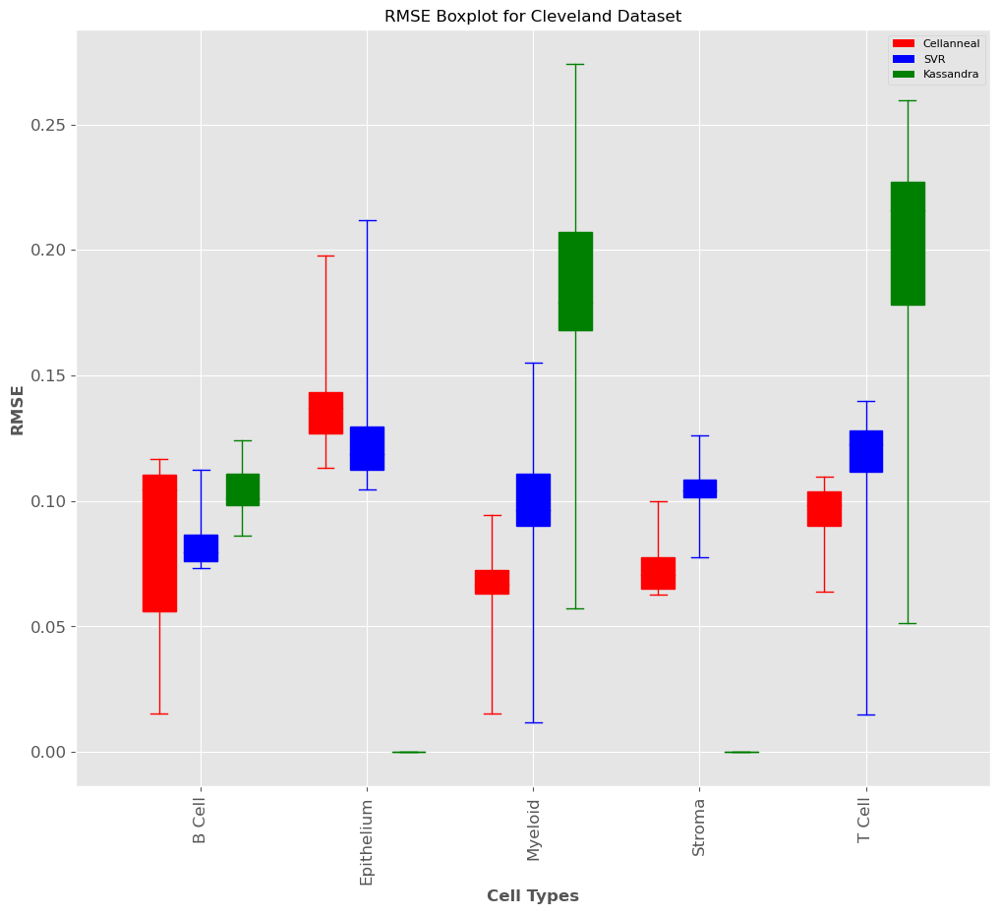

In [33]:
atap_cellanneal_df = pd.DataFrame()
atap_svr_df = pd.DataFrame()
atap_kass_df = pd.DataFrame()

for cell in cleveland_true_general.columns:
            #atap_cellanneal_df[cell] = lmu_true[cell] - cellanneal_lmu[cell]
            atap_cellanneal_df[cell] = [mean_squared_error(cleveland_true_general[cell][:(i+1)], cellanneal_cleveland_compartment[cell][:(i+1)], squared=False) for i in range(cleveland_true_general.shape[0])]
    
for cell in atap_true_general.columns:
            #atap_svr_df[cell] = lmu_true[cell] - svr_lmu[cell]
            atap_svr_df[cell] = [mean_squared_error(cleveland_true_general[cell][:(i+1)], svr_cleveland_compartment[cell][:(i+1)], squared=False) for i in range(cleveland_true_general.shape[0])]

for cell in atap_true_general.columns:
            atap_kass_df[cell] = [mean_squared_error(cleveland_true_general[cell][:(i+1)], kass_cleveland_compartment[cell][:(i+1)], squared=False) for i in range(cleveland_true_general.shape[0])]

atap_cellanneal_df = atap_cellanneal_df.T
atap_svr_df = atap_svr_df.T
atap_kass_df = atap_kass_df.T
atap_kass_df.T["Stroma"].values[:] = 0 
atap_kass_df.T["Epithelium"].values[:] = 0 
atap_cellanneal_df = atap_cellanneal_df.sort_index()
atap_svr_df = atap_svr_df.sort_index()
atap_kass_df = atap_kass_df.sort_index()


boxlplot2(atap_cellanneal_df, atap_svr_df, atap_kass_df, "RMSE Boxplot for Cleveland Dataset", "RMSE")

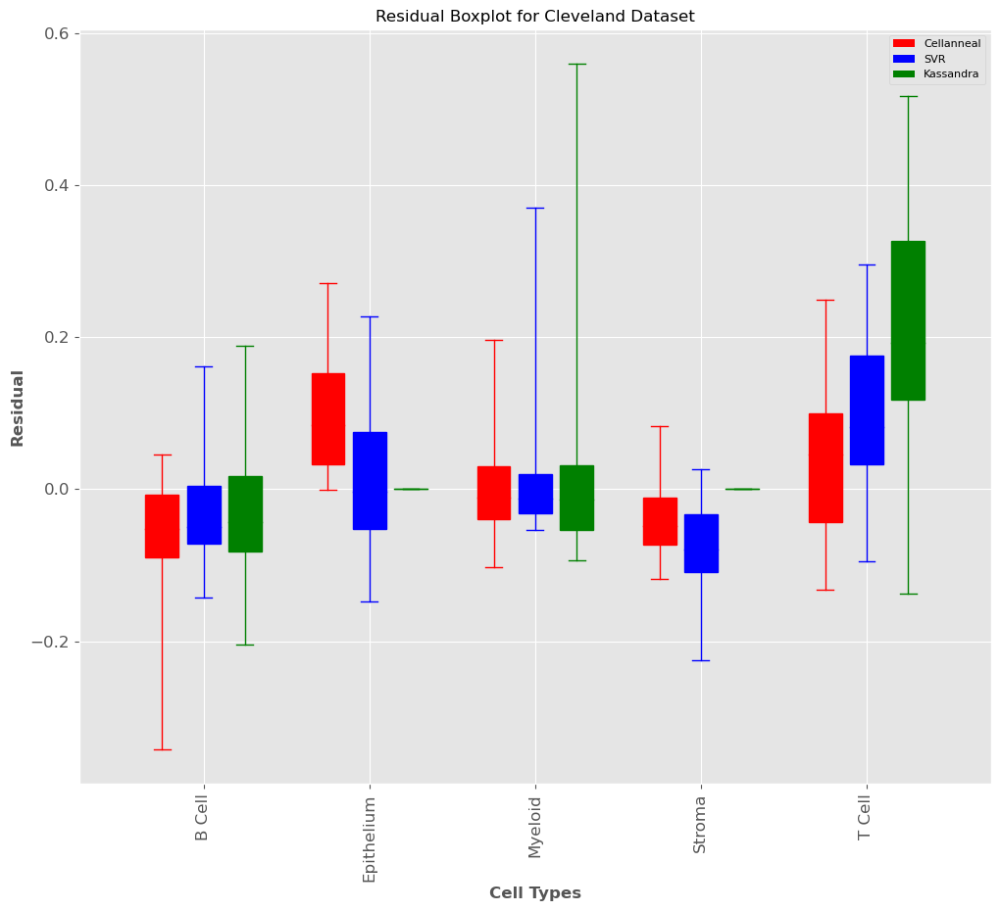

In [42]:
atap_cellanneal_df = pd.DataFrame()
atap_svr_df = pd.DataFrame()
atap_kass_df = pd.DataFrame()

for cell in cellanneal_atap_compartment.columns:
        try:
            atap_cellanneal_df[cell] = cleveland_true_general[cell] - cellanneal_cleveland_compartment[cell]
        except KeyError:
            continue
    
for cell in svr_atap_compartment.columns:
        try:
            atap_svr_df[cell] = cleveland_true_general[cell] - svr_cleveland_compartment[cell]
        except KeyError:
            continue

for cell in kass_atap_compartment.columns:
        try:
            atap_kass_df[cell] = cleveland_true_general[cell] - kass_cleveland_compartment[cell]
        except KeyError:
            continue

atap_cellanneal_df = atap_cellanneal_df.T
atap_svr_df = atap_svr_df.T
atap_kass_df = atap_kass_df.T
atap_kass_df.T["Stroma"].values[:] = 0 
atap_kass_df.T["Epithelium"].values[:] = 0 
atap_cellanneal_df = atap_cellanneal_df.sort_index()
atap_svr_df = atap_svr_df.sort_index()
atap_kass_df = atap_kass_df.sort_index()

boxlplot2(atap_cellanneal_df, atap_svr_df, atap_kass_df, "Residual Boxplot for Cleveland Dataset", "Residual")

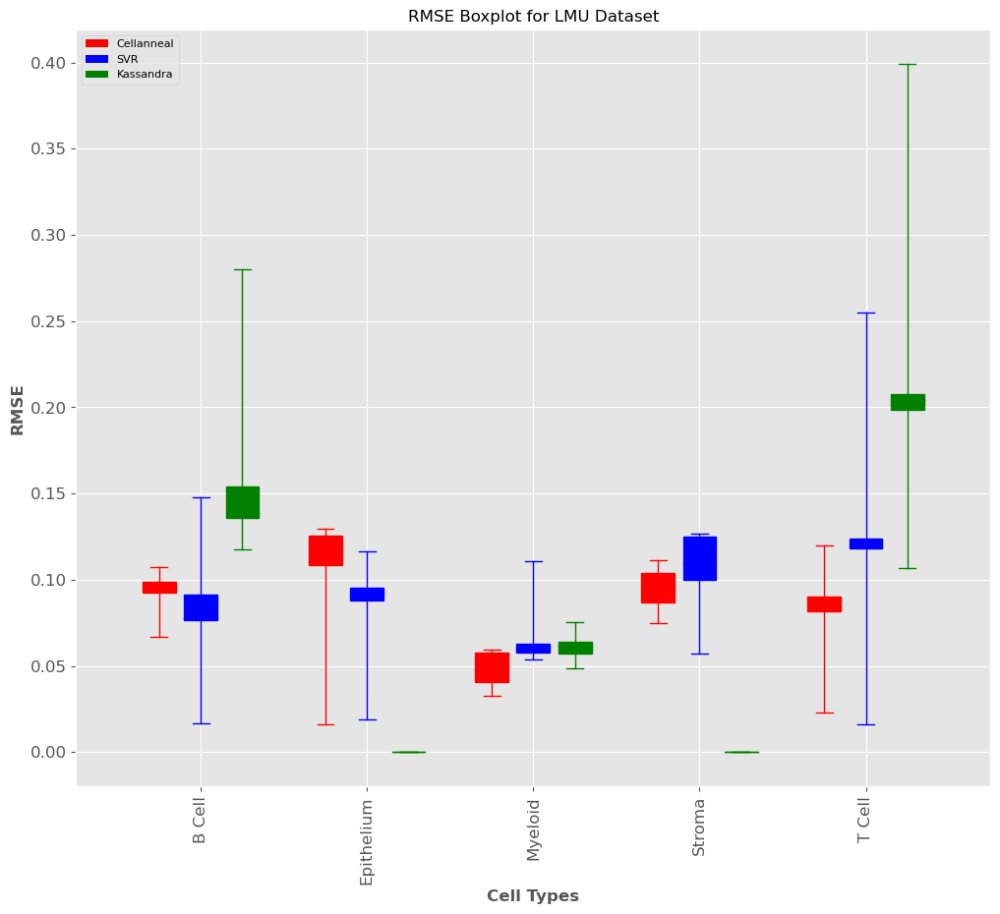

In [30]:
atap_cellanneal_df = pd.DataFrame()
atap_svr_df = pd.DataFrame()
atap_kass_df = pd.DataFrame()

for cell in lmu_true_general.columns:
            #atap_cellanneal_df[cell] = lmu_true[cell] - cellanneal_lmu[cell]
            atap_cellanneal_df[cell] = [mean_squared_error(lmu_true_general[cell][:(i+1)], cellanneal_lmu_compartment[cell][:(i+1)], squared=False) for i in range(lmu_true_general.shape[0])]
    
for cell in atap_true_general.columns:
            #atap_svr_df[cell] = lmu_true[cell] - svr_lmu[cell]
            atap_svr_df[cell] = [mean_squared_error(lmu_true_general[cell][:(i+1)], svr_lmu_compartment[cell][:(i+1)], squared=False) for i in range(lmu_true_general.shape[0])]

for cell in atap_true_general.columns:
            atap_kass_df[cell] = [mean_squared_error(lmu_true_general[cell][:(i+1)], kass_lmu_compartment[cell][:(i+1)], squared=False) for i in range(lmu_true_general.shape[0])]

atap_cellanneal_df = atap_cellanneal_df.T
atap_svr_df = atap_svr_df.T
atap_kass_df = atap_kass_df.T
atap_kass_df.T["Stroma"].values[:] = 0 
atap_kass_df.T["Epithelium"].values[:] = 0 
atap_cellanneal_df = atap_cellanneal_df.sort_index()
atap_svr_df = atap_svr_df.sort_index()
atap_kass_df = atap_kass_df.sort_index()


boxlplot2(atap_cellanneal_df, atap_svr_df, atap_kass_df, "RMSE Boxplot for LMU Dataset", "RMSE")

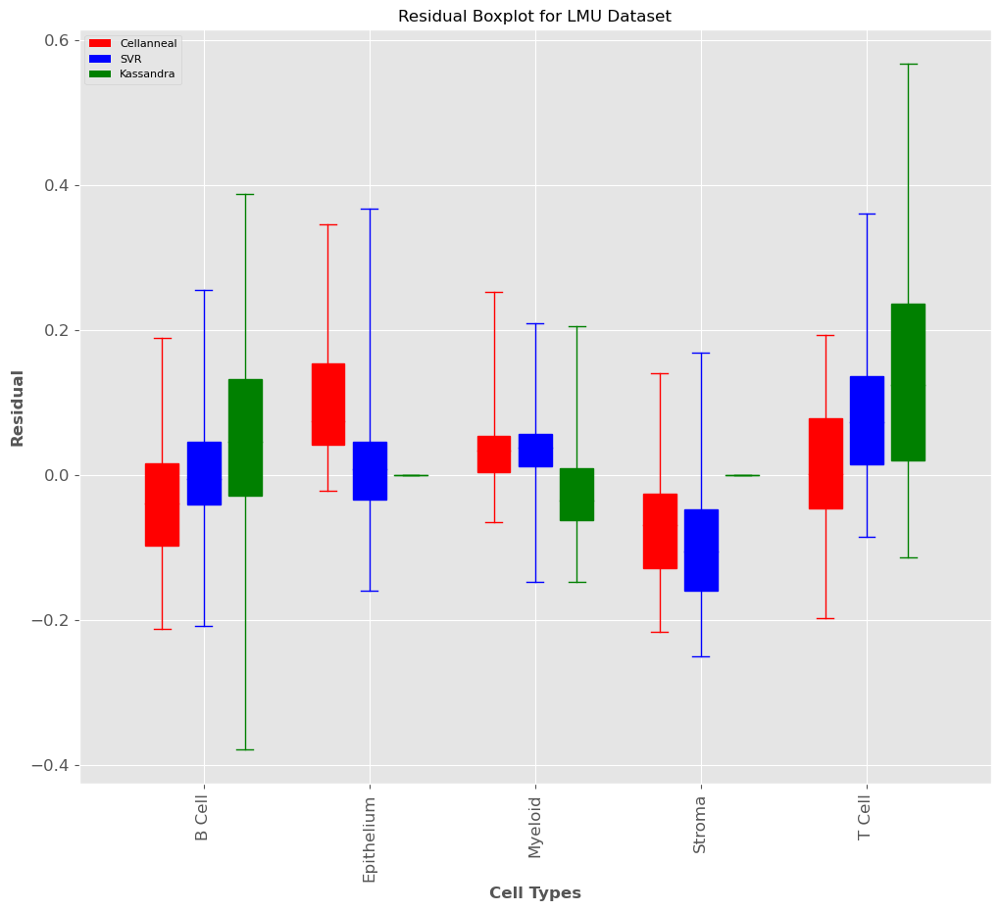

In [31]:
atap_cellanneal_df = pd.DataFrame()
atap_svr_df = pd.DataFrame()
atap_kass_df = pd.DataFrame()

for cell in cellanneal_atap_compartment.columns:
        try:
            atap_cellanneal_df[cell] = lmu_true_general[cell] - cellanneal_lmu_compartment[cell]
        except KeyError:
            continue
    
for cell in svr_atap_compartment.columns:
        try:
            atap_svr_df[cell] = lmu_true_general[cell] - svr_lmu_compartment[cell]
        except KeyError:
            continue

for cell in kass_atap_compartment.columns:
        try:
            atap_kass_df[cell] = lmu_true_general[cell] - kass_lmu_compartment[cell]
        except KeyError:
            continue

atap_cellanneal_df = atap_cellanneal_df.T
atap_svr_df = atap_svr_df.T
atap_kass_df = atap_kass_df.T
atap_kass_df.T["Stroma"].values[:] = 0 
atap_kass_df.T["Epithelium"].values[:] = 0 
atap_cellanneal_df = atap_cellanneal_df.sort_index()
atap_svr_df = atap_svr_df.sort_index()
atap_kass_df = atap_kass_df.sort_index()

boxlplot2(atap_cellanneal_df, atap_svr_df, atap_kass_df, "Residual Boxplot for LMU Dataset", "Residual")

# Benchmark rankings

In [14]:
kass_atap_compartment = pd.read_csv("../data/results3/kassandra_atap2.csv",index_col = 0).T
kass_cleveland_compartment = pd.read_csv("../data/results3/kassandra_cleveland2.csv",index_col = 0).T
kass_lmu_compartment = pd.read_csv("../data/results3/kassandra_lmu2.csv",index_col = 0).T

kass_atap_compartment = kass_atap_compartment[["B_cells", "T_cells", "Myeloid_cells"]]
kass_atap_compartment = kass_atap_compartment.rename(columns={"B_cells": "B Cell", "T_cells": "T Cell", "Myeloid_cells": "Myeloid"})
kass_atap_compartment["Stroma"] = 1
kass_atap_compartment["Epithelium"] = 1

kass_cleveland_compartment = kass_cleveland_compartment[["B_cells", "T_cells", "Myeloid_cells"]]
kass_cleveland_compartment = kass_cleveland_compartment.rename(columns={"B_cells": "B Cell", "T_cells": "T Cell", "Myeloid_cells": "Myeloid"})
kass_cleveland_compartment["Stroma"] = 1
kass_cleveland_compartment["Epithelium"] = 1

kass_lmu_compartment = kass_lmu_compartment[["B_cells", "T_cells", "Myeloid_cells"]]
kass_lmu_compartment = kass_lmu_compartment.rename(columns={"B_cells": "B Cell", "T_cells": "T Cell", "Myeloid_cells": "Myeloid"})
kass_lmu_compartment["Stroma"] = 1
kass_lmu_compartment["Epithelium"] = 1

(5, 223)
(5, 223)
(5, 223)
(5, 223)
(5, 223)
(5, 223)
### Here are the results of the methods based on cell specific & benchmarked on residual ###


cellanneal    3
Kassandra     1
SVR           1
Name: winners, dtype: int64


,cellanneal,Kassandra,SVR,winners value,winners
Myeloid,0.006754,-0.060480,0.014336,0.006754,cellanneal
B Cell,-0.054558,-0.115945,-0.111445,0.054558,cellanneal
Stroma,-0.061173,-0.981841,-0.069994,0.061173,cellanneal
T Cell,-0.131104,-0.200701,-0.101286,0.101286,SVR
Epithelium,0.242948,-0.118992,0.271256,0.118992,Kassandra


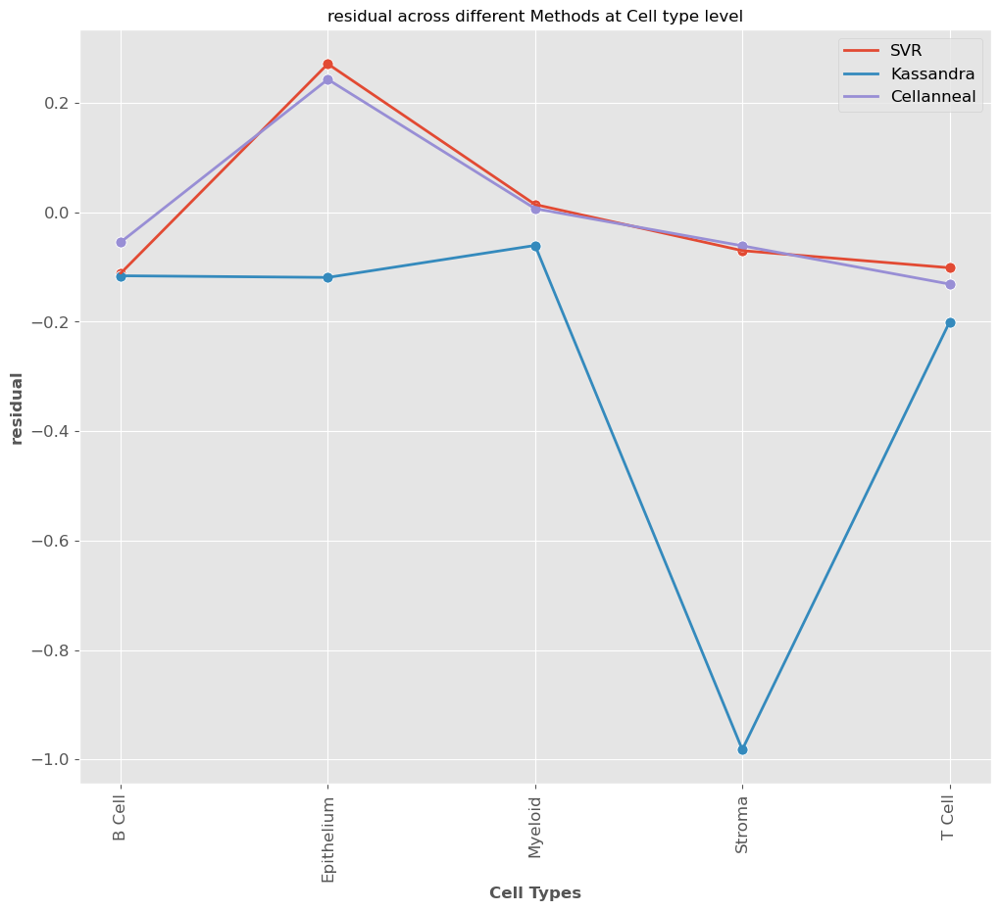

(5, 223)
(5, 223)
(5, 223)
(5, 223)
(5, 223)
(5, 223)
### Here are the results of the methods based on cell specific & benchmarked on rmse ###


cellanneal    3
SVR           2
Name: winners, dtype: int64


,cellanneal,Kassandra,SVR,winners value,winners
Myeloid,0.056684,0.070398,0.058114,0.056684,cellanneal
B Cell,0.084386,0.092995,0.069401,0.069401,SVR
T Cell,0.091759,0.696802,0.103564,0.091759,cellanneal
Stroma,0.119802,0.840764,0.122644,0.119802,cellanneal
Epithelium,0.150383,0.168278,0.126804,0.126804,SVR


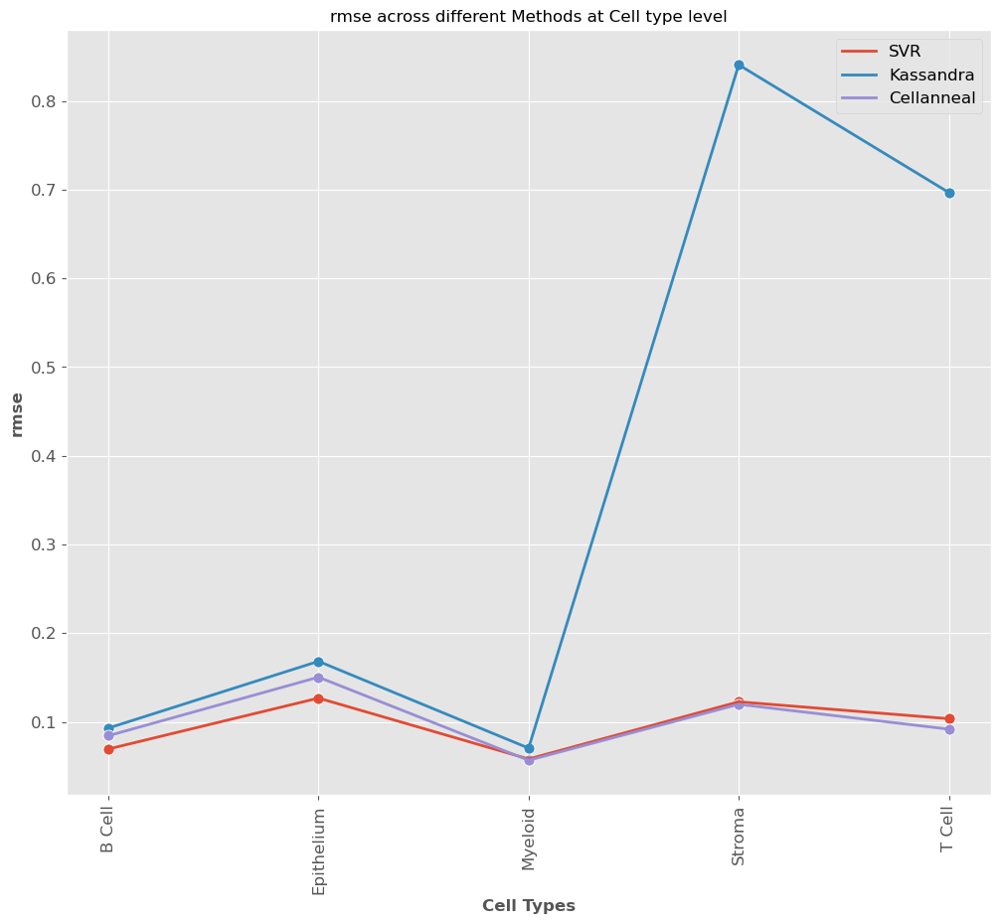

(5, 30)
(5, 30)
(5, 30)
(5, 30)
(5, 30)
(5, 30)
### Here are the results of the methods based on cell specific & benchmarked on residual ###


cellanneal    2
SVR           2
Kassandra     1
Name: winners, dtype: int64


,cellanneal,Kassandra,SVR,winners value,winners
Myeloid,-0.008412,-0.067015,0.008906,0.008412,cellanneal
B Cell,0.016947,-0.117331,-0.123356,0.016947,cellanneal
T Cell,-0.043432,-0.379020,0.041310,0.041310,SVR
Stroma,-0.090882,-0.930727,-0.074888,0.074888,SVR
Epithelium,0.124790,0.081428,0.147038,0.081428,Kassandra


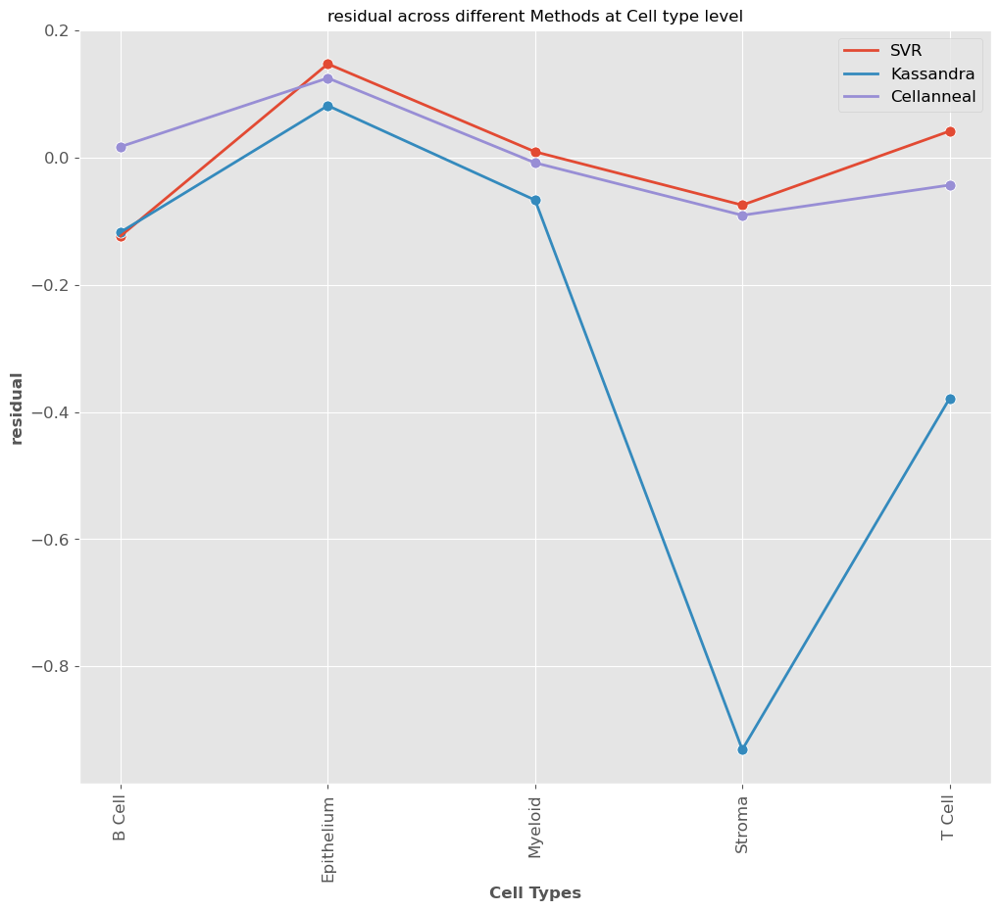

(5, 30)
(5, 30)
(5, 30)
(5, 30)
(5, 30)
(5, 30)
### Here are the results of the methods based on cell specific & benchmarked on rmse ###


cellanneal    3
SVR           2
Name: winners, dtype: int64


,cellanneal,Kassandra,SVR,winners value,winners
Myeloid,0.060460,0.161986,0.088403,0.060460,cellanneal
Stroma,0.063467,0.895822,0.100642,0.063467,cellanneal
B Cell,0.110588,0.096596,0.075532,0.075532,SVR
T Cell,0.103660,0.769275,0.139881,0.103660,cellanneal
Epithelium,0.126007,0.259783,0.104526,0.104526,SVR


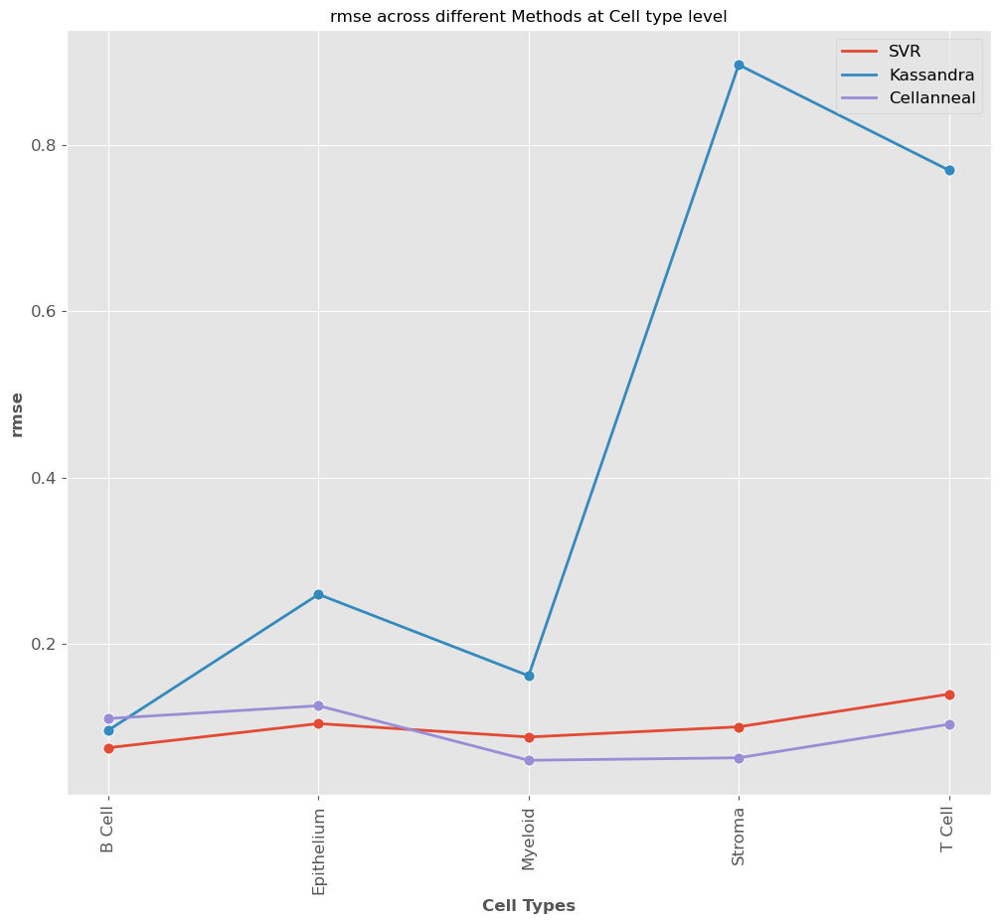

(5, 76)
(5, 76)
(5, 76)
(5, 76)
(5, 76)
(5, 76)
### Here are the results of the methods based on cell specific & benchmarked on residual ###


cellanneal    2
SVR           2
Kassandra     1
Name: winners, dtype: int64


,cellanneal,Kassandra,SVR,winners value,winners
Epithelium,-0.000426,0.554200,0.000000,0.000000,SVR
Stroma,-0.001165,-1.000000,0.000000,0.000000,SVR
T Cell,-0.004349,-1.000000,0.360035,0.004349,cellanneal
Myeloid,0.042947,0.021645,-0.147392,0.021645,Kassandra
B Cell,-0.032442,-0.378266,-0.208077,0.032442,cellanneal


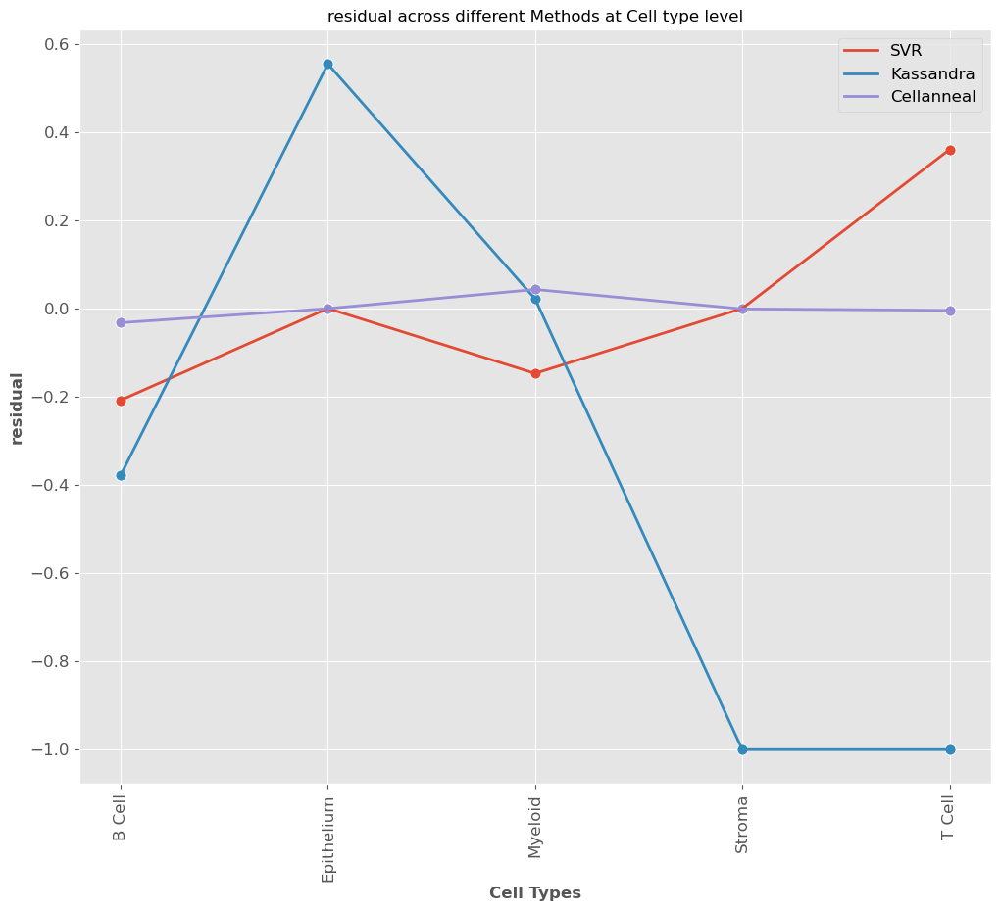

(5, 76)
(5, 76)
(5, 76)
(5, 76)
(5, 76)
(5, 76)
### Here are the results of the methods based on cell specific & benchmarked on rmse ###


cellanneal    3
SVR           2
Name: winners, dtype: int64


,cellanneal,Kassandra,SVR,winners value,winners
Myeloid,0.058305,0.061408,0.061455,0.058305,cellanneal
B Cell,0.089978,0.133052,0.075497,0.075497,SVR
T Cell,0.089058,0.811222,0.120953,0.089058,cellanneal
Epithelium,0.128793,0.205635,0.093379,0.093379,SVR
Stroma,0.109034,0.807133,0.125159,0.109034,cellanneal


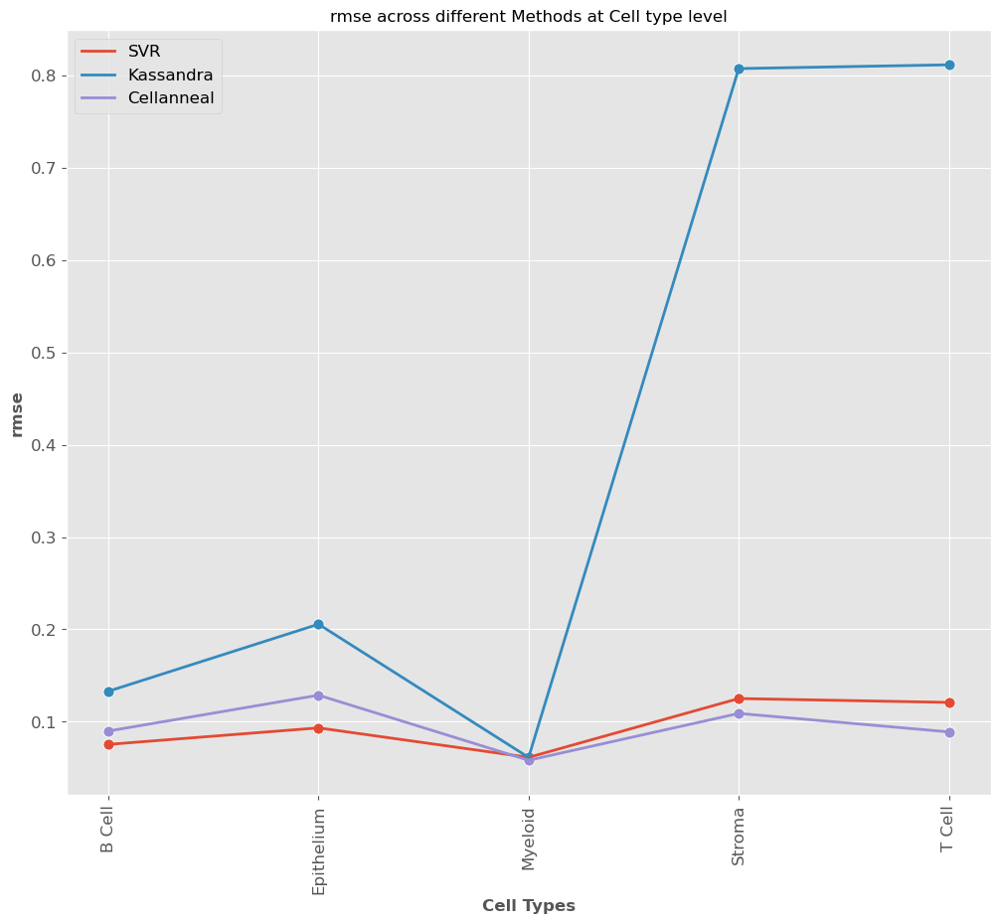

In [45]:
deconvolution_object.benchmark([cellanneal_atap_compartment.T, kass_atap_compartment.T, svr_atap_compartment.T],atap_true_general.T, statistic = 'residual')
deconvolution_object.benchmark([cellanneal_atap_compartment.T, kass_atap_compartment.T, svr_atap_compartment.T],atap_true_general.T, statistic = 'rmse')
deconvolution_object.benchmark([cellanneal_cleveland_compartment.T, kass_cleveland_compartment.T, svr_cleveland_compartment.T],cleveland_true_general.T, statistic = 'residual')
deconvolution_object.benchmark([cellanneal_cleveland_compartment.T, kass_cleveland_compartment.T, svr_cleveland_compartment.T],cleveland_true_general.T, statistic = 'rmse')
deconvolution_object.benchmark([cellanneal_lmu_compartment.T, kass_lmu_compartment.T, svr_lmu_compartment.T],lmu_true_general.T, statistic = 'residual')
deconvolution_object.benchmark([cellanneal_lmu_compartment.T, kass_lmu_compartment.T, svr_lmu_compartment.T],lmu_true_general.T, statistic = 'rmse')

(42, 223)
(42, 223)
(42, 223)
(42, 223)
(42, 223)
(42, 223)
### Here are the results of the methods based on cell specific & benchmarked on residual ###


SVR           23
cellanneal    19
Name: winners, dtype: int64


,cellanneal,Kassandra,SVR,winners value,winners
CD209+ moDC,0.000259,0.000259,0.006968,0.000259,cellanneal
CD83+ CLEC9A+ DC,0.001334,0.001334,0.000000,0.000000,SVR
CD83- CLEC9A+ DC,-0.000293,-0.000293,0.047362,0.000293,cellanneal
CLEC10A+ DC,-0.001876,-0.001876,-0.002230,0.001876,cellanneal
IL7R+ Activated DC,0.007610,0.007610,0.000000,0.000000,SVR
Mast Cell,0.008862,0.008862,0.007124,0.007124,SVR
Memory B cell,0.024448,0.024448,-0.000319,0.000319,SVR
Monocyte Inflammatory,-0.000188,-0.000188,0.121000,0.000188,cellanneal
Proliferating myeloid,0.044155,0.044155,-0.000319,0.000319,SVR
Resident Macrophage,0.000109,0.000109,-0.001274,0.000109,cellanneal


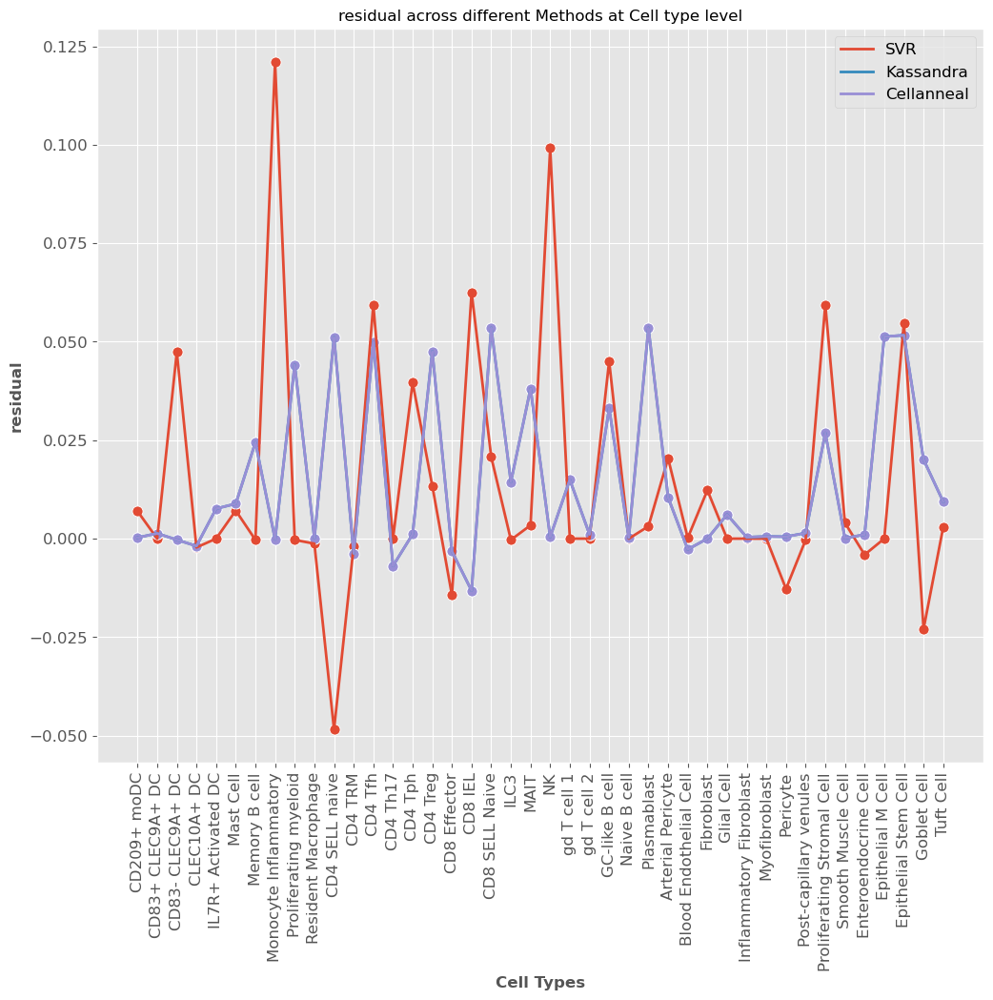

(42, 223)
(42, 223)
(42, 223)
(42, 223)
(42, 223)
(42, 223)
### Here are the results of the methods based on cell specific & benchmarked on rmse ###


cellanneal    30
SVR           12
Name: winners, dtype: int64


,cellanneal,Kassandra,SVR,winners value,winners
CD209+ moDC,0.021899,0.021899,0.040738,0.021899,cellanneal
CD83+ CLEC9A+ DC,0.021698,0.021698,0.016653,0.016653,SVR
CD83- CLEC9A+ DC,0.022114,0.022114,0.043065,0.022114,cellanneal
CLEC10A+ DC,0.007826,0.007826,0.008769,0.007826,cellanneal
IL7R+ Activated DC,0.004045,0.004045,0.002830,0.002830,SVR
Mast Cell,0.003597,0.003597,0.003450,0.003450,SVR
Memory B cell,0.046436,0.046436,0.014509,0.014509,SVR
Monocyte Inflammatory,0.013044,0.013044,0.061131,0.013044,cellanneal
Proliferating myeloid,0.031706,0.031706,0.006816,0.006816,SVR
Resident Macrophage,0.006494,0.006494,0.042676,0.006494,cellanneal


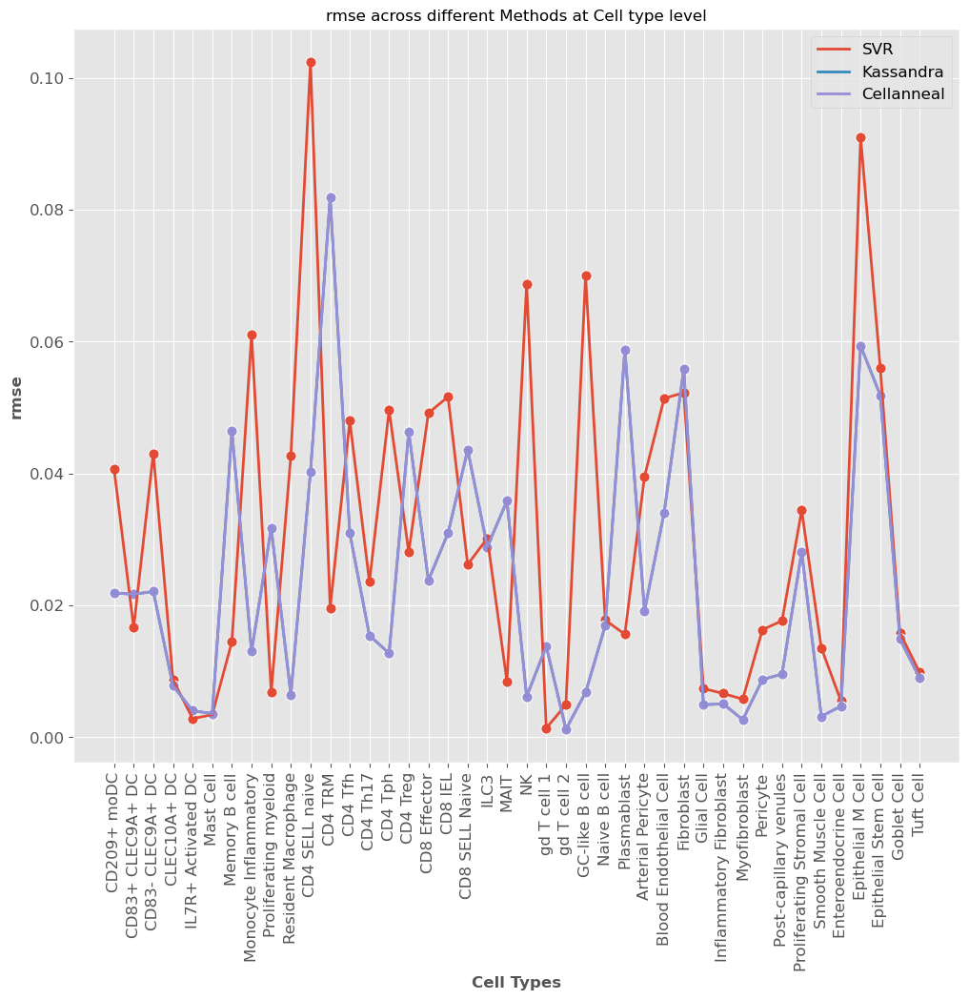

(42, 30)
(42, 30)
(42, 30)
(42, 30)
(42, 30)
(42, 30)
### Here are the results of the methods based on cell specific & benchmarked on residual ###


cellanneal    23
SVR           19
Name: winners, dtype: int64


,cellanneal,Kassandra,SVR,winners value,winners
CD209+ moDC,0.015576,0.015576,0.053214,0.015576,cellanneal
CD83+ CLEC9A+ DC,0.050593,0.050593,0.000000,0.000000,SVR
CD83- CLEC9A+ DC,0.054399,0.054399,0.073478,0.054399,cellanneal
CLEC10A+ DC,-0.000477,-0.000477,-0.000495,0.000477,cellanneal
IL7R+ Activated DC,0.000059,0.000059,0.000000,0.000000,SVR
Mast Cell,0.009911,0.009911,0.000000,0.000000,SVR
Memory B cell,0.021144,0.021144,-0.000495,0.000495,SVR
Monocyte Inflammatory,0.039092,0.039092,0.006838,0.006838,SVR
Proliferating myeloid,0.001452,0.001452,-0.001484,0.001452,cellanneal
Resident Macrophage,-0.001475,-0.001475,0.017673,0.001475,cellanneal


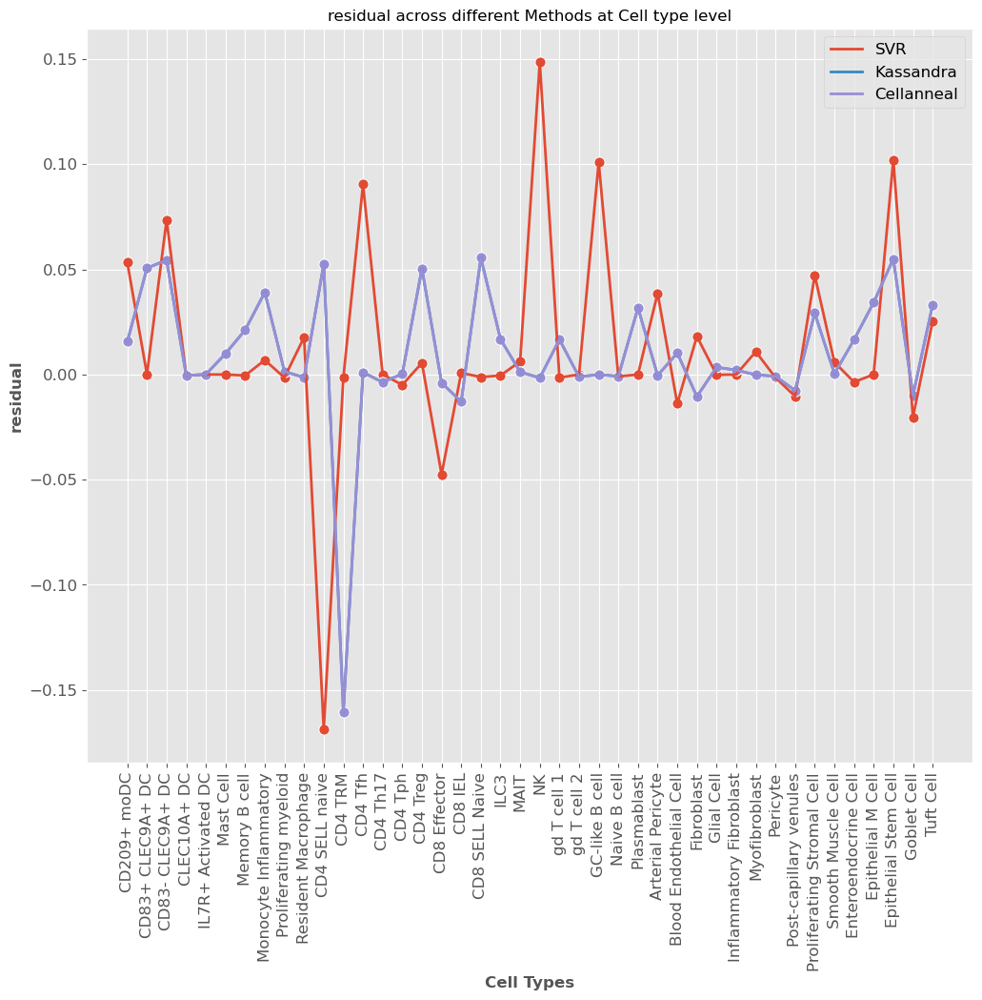

(42, 30)
(42, 30)
(42, 30)
(42, 30)
(42, 30)
(42, 30)
### Here are the results of the methods based on cell specific & benchmarked on rmse ###


cellanneal    25
SVR           17
Name: winners, dtype: int64


,cellanneal,Kassandra,SVR,winners value,winners
CD209+ moDC,0.025642,0.025642,0.025333,0.025333,SVR
CD83+ CLEC9A+ DC,0.015390,0.015390,0.004824,0.004824,SVR
CD83- CLEC9A+ DC,0.015586,0.015586,0.056056,0.015586,cellanneal
CLEC10A+ DC,0.015386,0.015386,0.018154,0.015386,cellanneal
IL7R+ Activated DC,0.007968,0.007968,0.005652,0.005652,SVR
Mast Cell,0.046584,0.046584,0.044969,0.044969,SVR
Memory B cell,0.031499,0.031499,0.103407,0.031499,cellanneal
Monocyte Inflammatory,0.093526,0.093526,0.059031,0.059031,SVR
Proliferating myeloid,0.026636,0.026636,0.007595,0.007595,SVR
Resident Macrophage,0.020869,0.020869,0.032365,0.020869,cellanneal


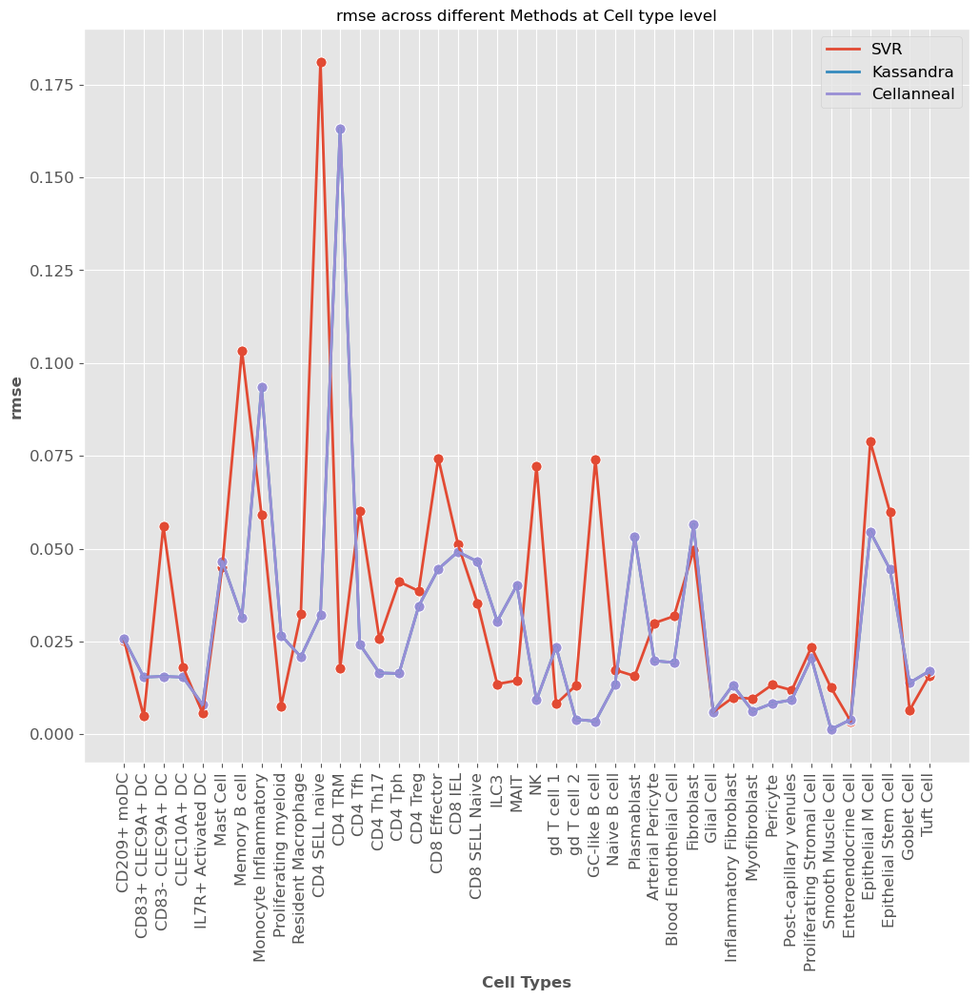

(42, 76)
(42, 76)
(42, 76)
(42, 76)
(42, 76)
(42, 76)
### Here are the results of the methods based on cell specific & benchmarked on residual ###


cellanneal    22
SVR           20
Name: winners, dtype: int64


,cellanneal,Kassandra,SVR,winners value,winners
CD209+ moDC,0.003675,0.003675,0.002543,0.002543,SVR
CD83+ CLEC9A+ DC,-0.000229,-0.000229,-0.000240,0.000229,cellanneal
CD83- CLEC9A+ DC,0.000012,0.000012,0.054727,0.000012,cellanneal
CLEC10A+ DC,-0.005728,-0.005728,-0.010453,0.005728,cellanneal
IL7R+ Activated DC,0.007893,0.007893,0.000000,0.000000,SVR
Mast Cell,0.005016,0.005016,0.000000,0.000000,SVR
Memory B cell,0.014636,0.014636,-0.085706,0.014636,cellanneal
Monocyte Inflammatory,-0.062795,-0.062795,0.093448,0.062795,cellanneal
Proliferating myeloid,0.003642,0.003642,0.000000,0.000000,SVR
Resident Macrophage,0.000514,0.000514,-0.237621,0.000514,cellanneal


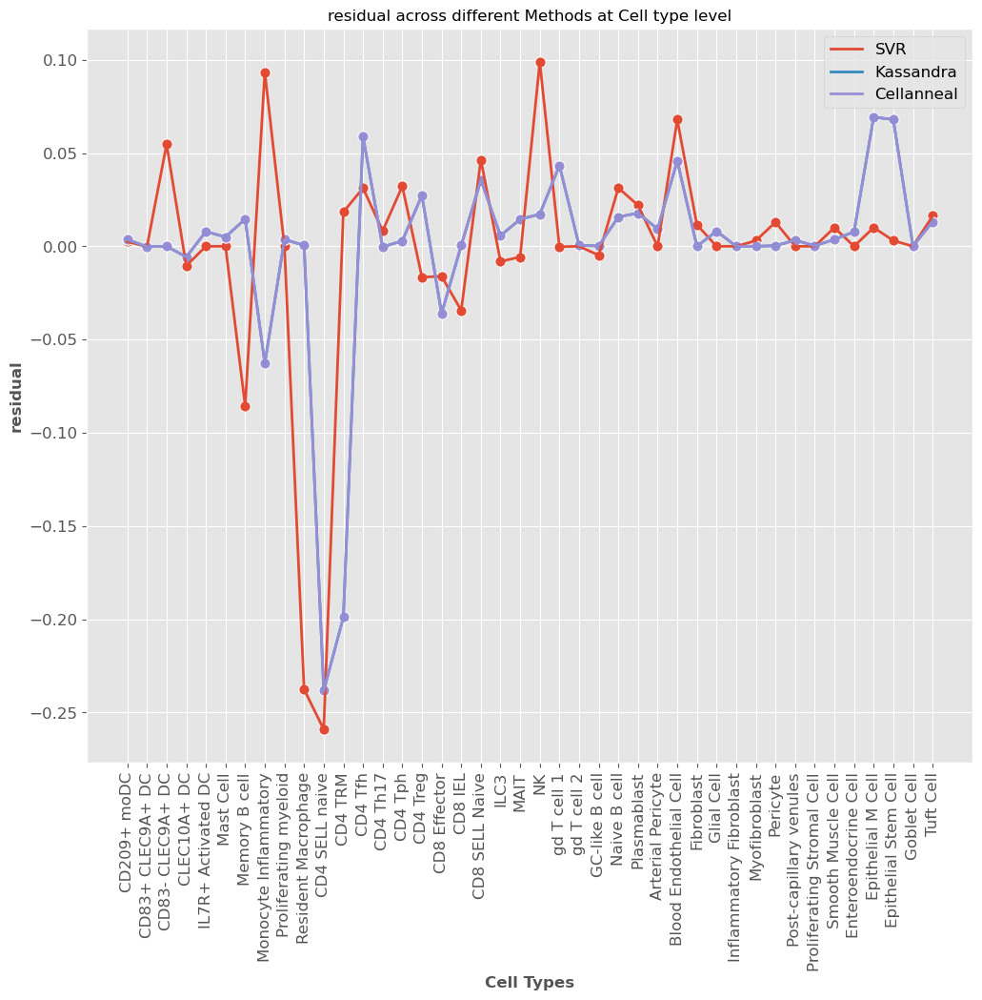

(42, 76)
(42, 76)
(42, 76)
(42, 76)
(42, 76)
(42, 76)
### Here are the results of the methods based on cell specific & benchmarked on rmse ###


cellanneal    28
SVR           14
Name: winners, dtype: int64


,cellanneal,Kassandra,SVR,winners value,winners
CD209+ moDC,0.019704,0.019704,0.032310,0.019704,cellanneal
CD83+ CLEC9A+ DC,0.018251,0.018251,0.025876,0.018251,cellanneal
CD83- CLEC9A+ DC,0.018374,0.018374,0.032584,0.018374,cellanneal
CLEC10A+ DC,0.008365,0.008365,0.008618,0.008365,cellanneal
IL7R+ Activated DC,0.005051,0.005051,0.002464,0.002464,SVR
Mast Cell,0.011379,0.011379,0.014197,0.011379,cellanneal
Memory B cell,0.036751,0.036751,0.011396,0.011396,SVR
Monocyte Inflammatory,0.011559,0.011559,0.058893,0.011559,cellanneal
Proliferating myeloid,0.031185,0.031185,0.006426,0.006426,SVR
Resident Macrophage,0.006129,0.006129,0.061283,0.006129,cellanneal


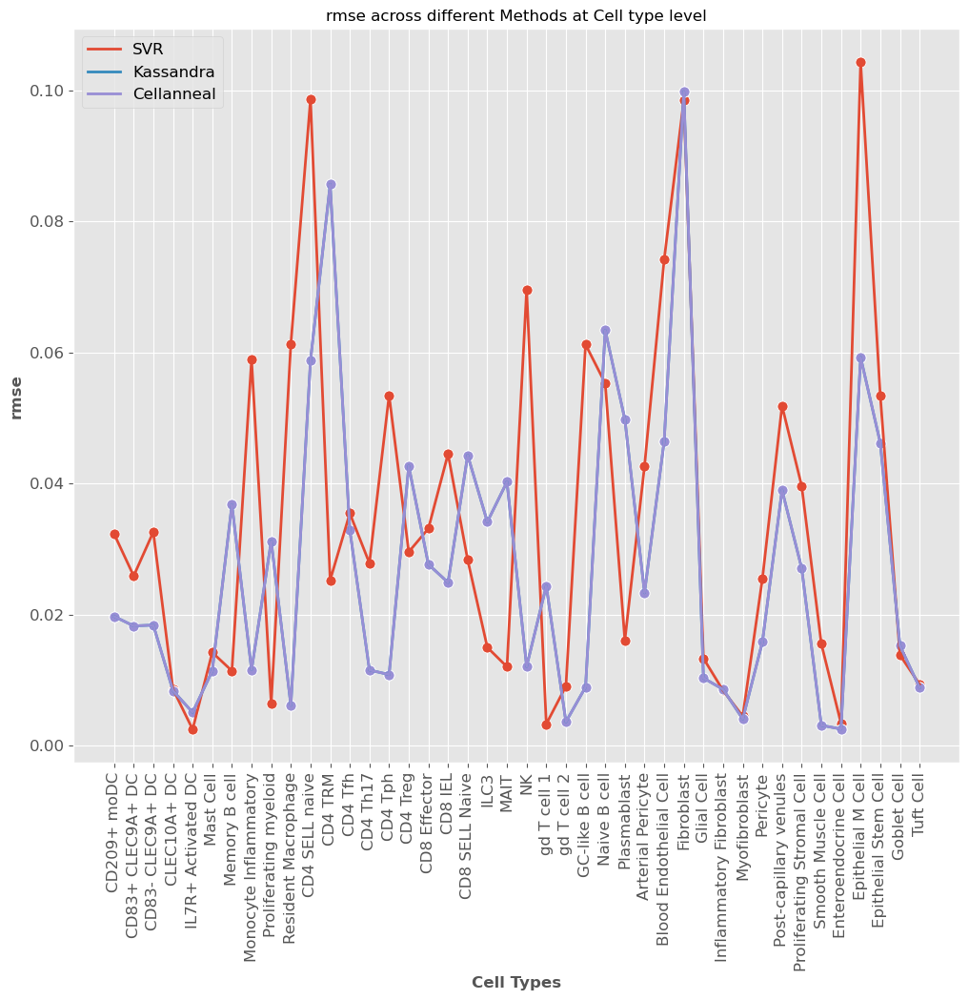

In [ ]:
deconvolution_object.benchmark([cellanneal_atap.T, cellanneal_atap.T, svr_atap.T],atap_true.T, statistic = 'residual')
deconvolution_object.benchmark([cellanneal_atap.T, cellanneal_atap.T, svr_atap.T],atap_true.T, statistic = 'rmse')
deconvolution_object.benchmark([cellanneal_cleveland.T, cellanneal_cleveland.T, svr_cleveland.T],cleveland_true.T, statistic = 'residual')
deconvolution_object.benchmark([cellanneal_cleveland.T, cellanneal_cleveland.T, svr_cleveland.T],cleveland_true.T, statistic = 'rmse')
deconvolution_object.benchmark([cellanneal_lmu.T, cellanneal_lmu.T, svr_lmu.T],lmu_true.T, statistic = 'residual')
deconvolution_object.benchmark([cellanneal_lmu.T, cellanneal_lmu.T, svr_lmu.T],lmu_true.T, statistic = 'rmse')

In [ ]:
ind_names = svr_atap.index.intersection(atap_true.index)
sample_color = plot_object.get_cmap(len(ind_names))

In [11]:
cells_p = {'B Cell': '#558ce0',
            'T Cell': '#28a35c',
            'Myeloid': '#58d3bb',
            'Stroma': '#eaabcc',
            'Epithelium': '#F6783E',
}

In [12]:
from scipy import stats

def plot_cell(predicted_values, true_values, figsize=(24, 24), pallete=None, corr=True):
    '''
    Author: Kassandra
    
    The function draws a grid of scatterplots for each cell type with colors from pallete,
    with correlation in titles and straight lines based on linear regression if needed.

    Parameters:
        predicted_values (pandas.DataFrame): dataframes of predicted cellular proportions
        true_values (pandas.DataFrame): dataframes of "True" Flow Cytometry or Pathology quanitfied matrices
        figsize (set): a set that specifies figure size. Default (24, 24) 
        pallete (list): a color pallete for our plotting. Default is set to None 
    
    Returns:
        axs subplot figure
    '''
    ind_names = predicted_values.index.intersection(true_values.index)
    col_names = predicted_values.columns.intersection(true_values.columns)
    predicted_values = predicted_values.loc[ind_names, col_names]
    true_values = true_values.loc[ind_names, col_names]

    if len(ind_names) < 5:
        num_ncols = len(ind_names)
    else:
        num_ncols = 5

    num_nrows = (len(ind_names) - 1) // 6 + 1
    print(num_nrows)
    print(num_ncols)
    figsize = (figsize[0], figsize[0] * num_nrows / num_ncols)

    fig, axs = plt.subplots(num_nrows, num_ncols, figsize=figsize)
    #fig.set_title("Correlation of predicted and real percentage of cells", fontsize=20)
    fig.tight_layout()
    fig.subplots_adjust(top=0.91, wspace=0.4, hspace=0.4)

    
    ordered_names = ind_names.sort_values()

    for ax, cell in zip(axs.flat, ordered_names):
        
        sub_title = cell
        if cell in pallete:
            colors = pallete[cell]
        else:
            colors = '#999999'
        print_cell(predicted_values.loc[cell], true_values.loc[cell], ax=ax,title=cell, pallete=pallete, color = colors, corr_line=corr)

    return axs

def print_cell(predicted_values, true_values, ax=None, pallete=None, single_color='#999999',
            predicted_name='Predicted percentage of cells, %',
            true_name='Real percentage of cells, %', title=None, corr_title=True, corr_rounding=3,
            figsize=(6, 6), s=60, title_font=20, labels_font=18, ticks_size=17, xlim=None, ylim=None,
            corr_line=True, linewidth=1, line_color='black', pad=15, min_xlim=0.1, min_ylim=0.1, labelpad=None, color = None):
    """
    Author: Kassandra

    The function draws a scatterplot with colors from pallete, with correlation in title and
    straight line based on linear regression on x_values and y_values if needed.

    Parameters:
        predicted_values: pandas Series
        true_values: pandas Series
        ax: matplotlib.axes
        pallete: dict with colors, keys - some or all names from predicted_values and true_values index
        single_color: what color to use if there is no palette or some names are missed
        predicted_name: xlabel for plot
        true_name: ylabel for plot
        title: title for plot, will be combined with ', corr = ' if corr_title=True
        corr_title: whether to calculate Pearson correlation and print it with title
        corr_rounding: precision in decimal digits for correlation if corr_title=True
        figsize: figsize if ax=None
        s: scalar or array_like, shape (n, ), marker size for scatter
        title_font: title size
        labels_font: xlabel and ylabel size
        ticks_size: tick values size
        xlim: x limits, if None xlim will be (0, 1.2 * max(predicted_values))
        ylim: y limits, if None ylim will be (0, 1.2 * max(true_values))
        corr_line: whether to draw a straight line based on linear regression on x_values and y_values
        linewidth: width of the fitted line
        line_color: color of the fitted line
        pad: distance for titles from picture
        min_xlim: minimal range (max picture value) for x
        min_ylim: minimal range (max picture value) for y

    Returns:
        axs subplot figure
    """
    if ax is None:
        fig, ax = plt.subplots(figsize=figsize)
    ind_points = true_values.dropna().index.intersection(predicted_values.dropna().index)
    ax.grid(b=False)
    predicted_values = predicted_values.loc[ind_points].astype(float)
    true_values = true_values.loc[ind_points].astype(float)
    if corr_title:
        corrcoef, pval = stats.spearmanr(predicted_values, true_values)
        corrcoef = str(round(corrcoef, corr_rounding))
        if title is not None:
            ax.set_title(title+' True vs predicted Plots\nSpearman corr = {corr}\nP = {p}'.format(title=title,
                                                                corr=corrcoef,
                                                                p=pval),
                        size=title_font, pad=pad)
        else:
            ax.set_title('Corr = {corr}\np = {p}'.format(corr=corrcoef,
                                                        p=pval),
                        size=title_font, pad=pad)
    elif title is not None:
        ax.set_title(title, size=title_font, pad=pad)
    ax.set_xlabel(true_name, size=labels_font, labelpad = labelpad)
    ax.set_ylabel(predicted_name, size=labels_font, labelpad = labelpad)
    ax.tick_params(labelsize=ticks_size)

    ax.set_xlim(0, 1.0)
    ax.set_ylim(0, 1.0)
    ax.set_xticks([0,0.2,0.4,0.6,0.8,1.0])
    ax.set_yticks([0,0.2,0.4,0.6,0.8,1.0])
    if single_color != '#999999':
        ax.scatter((predicted_values+true_values)/2, true_values, s=s, c=single_color)
    else:
        ax.scatter(true_values, predicted_values, s=s, c=color)

    if corr_line:
        print_fitted_line(predicted_values, true_values, ax=ax, linewidth=linewidth, line_color=line_color)

    return ax

def print_fitted_line(x_values, y_values, ax=None, linewidth=1, line_color='black', figsize=(6, 6)):
    """
    Author: Kassandra

    The function draws a straight line based on linear regression on x_values and y_values.

    Parameters:
        x_values: pandas Series or numpy array
        y_values: pandas Series or numpy array
        ax: matplotlib.axes
        linewidth: width of the line
        line_color: color of the line
        figsize: figsize if ax=None
    
    Returns:
        Ax subplot figure with linear regression line fitted
    """
    if ax is None:
        fig, ax = plt.subplots(figsize=figsize)

    fit_coefs = np.polyfit(y_values, x_values, deg=1)
    fit_values = np.sort(y_values)
    ax.plot(fit_values, fit_coefs[0] * fit_values + fit_coefs[1], linewidth=linewidth, color=line_color)

    return ax

1
5
1
5
1
5


array([<AxesSubplot: title={'center': 'B Cell True vs predicted Plots\nSpearman corr = 0.786\nP = 3.92256793660539e-17'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Epithelium True vs predicted Plots\nSpearman corr = 0.899\nP = 2.9984246829159223e-28'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Myeloid True vs predicted Plots\nSpearman corr = 0.288\nP = 0.011763502264532728'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Stroma True vs predicted Plots\nSpearman corr = 0.879\nP = 1.7949729484894775e-25'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'T Cell True vs predicted Plots\nSpearman corr = 0.792\nP = 1.7311806940228393e-17'}, xlabel='Real percentage of cells, %', ylabel='Predi

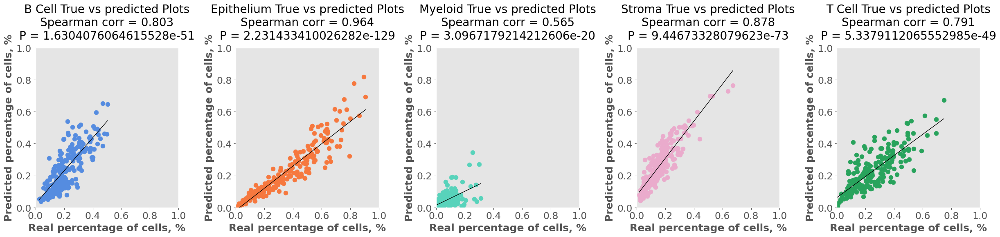

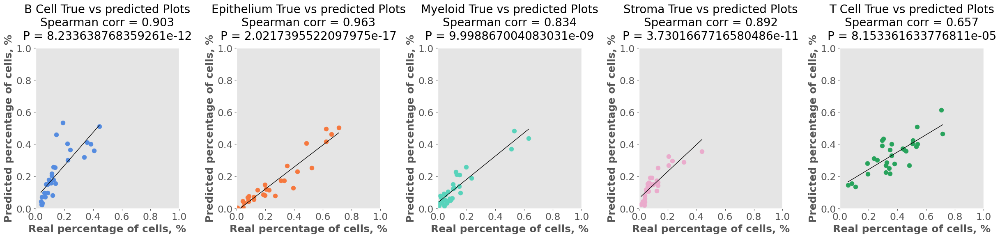

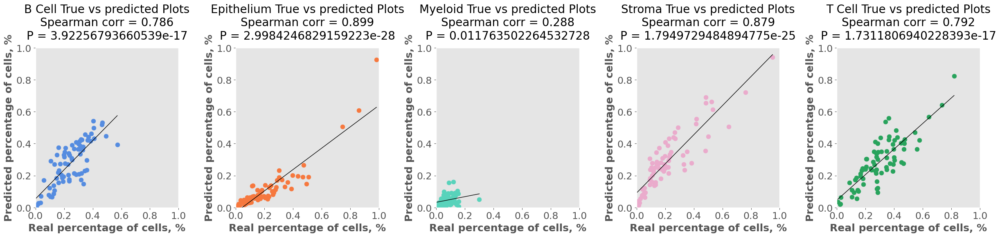

In [83]:
plot_cell(cellanneal_atap_compartment.T, atap_true_general.T, pallete=cells_p)
plot_cell(cellanneal_cleveland_compartment.T, cleveland_true_general.T, pallete=cells_p)
plot_cell(cellanneal_lmu_compartment.T, lmu_true_general.T, pallete=cells_p)


1
5
1
5
1
5


array([<AxesSubplot: title={'center': 'B Cell True vs predicted Plots\nSpearman corr = 0.792\nP = 1.622417187324584e-17'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Epithelium True vs predicted Plots\nSpearman corr = 0.871\nP = 1.5254247814864496e-24'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Myeloid True vs predicted Plots\nSpearman corr = 0.489\nP = 7.31225973697552e-06'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Stroma True vs predicted Plots\nSpearman corr = 0.896\nP = 9.822903873528732e-28'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'T Cell True vs predicted Plots\nSpearman corr = 0.913\nP = 1.768797928765236e-30'}, xlabel='Real percentage of cells, %', ylabel='Predic

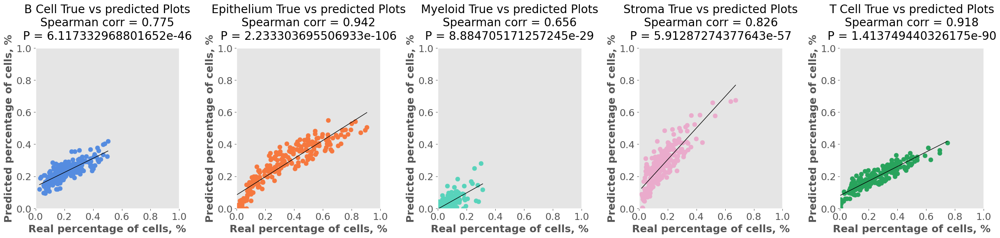

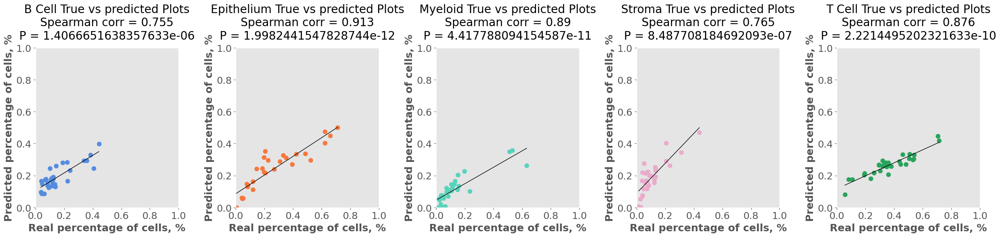

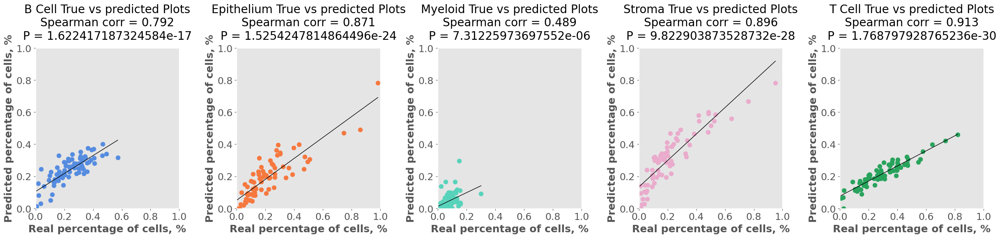

In [84]:
plot_cell(svr_atap_compartment.T, atap_true_general.T, pallete=cells_p)
plot_cell(svr_cleveland_compartment.T, cleveland_true_general.T, pallete=cells_p)
plot_cell(svr_lmu_compartment.T, lmu_true_general.T, pallete=cells_p)

1
5
1
5
1
5
1
5
1
5
1
5
1
5
1
5
1
5


array([<AxesSubplot: title={'center': 'B Cell True vs predicted Plots\nSpearman corr = 0.302\nP = 0.008092886627911746'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Epithelium True vs predicted Plots\nSpearman corr = nan\nP = nan'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Myeloid True vs predicted Plots\nSpearman corr = 0.11\nP = 0.3463860160736275'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'Stroma True vs predicted Plots\nSpearman corr = 0.45\nP = 4.4360627359419475e-05'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>,
       <AxesSubplot: title={'center': 'T Cell True vs predicted Plots\nSpearman corr = 0.03\nP = 0.7937679518992986'}, xlabel='Real percentage of cells, %', ylabel='Predicted percentage of cells, %'>]

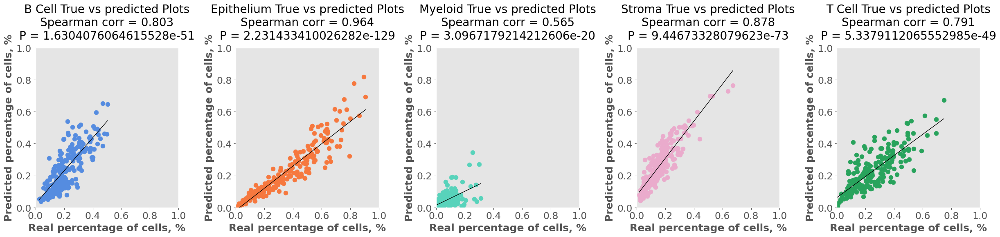

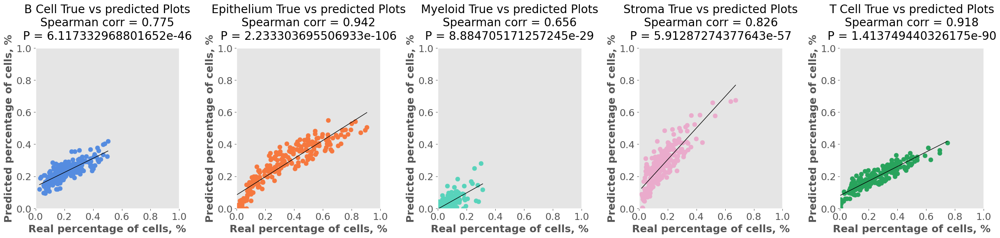

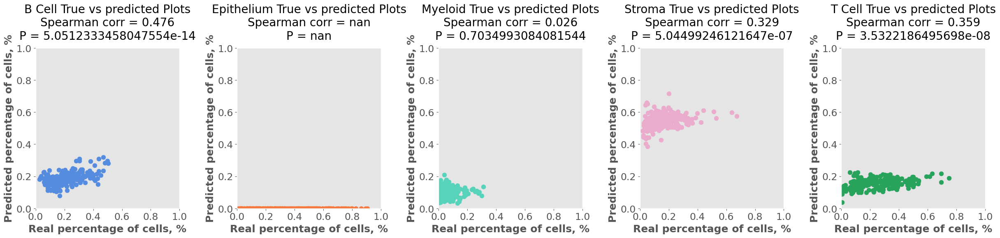

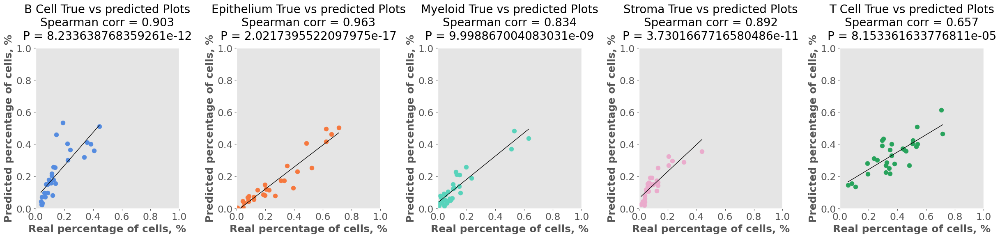

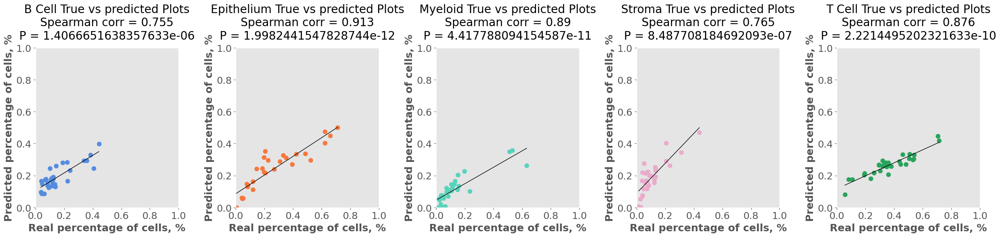

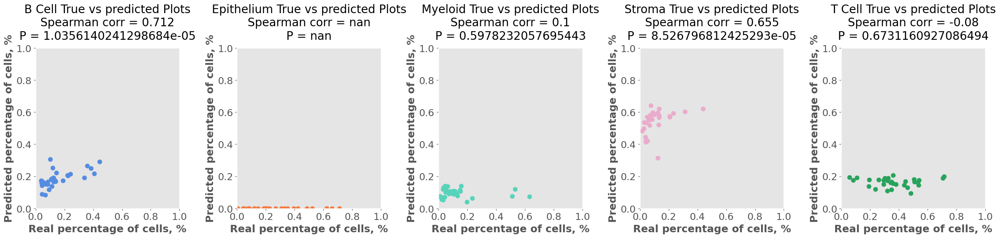

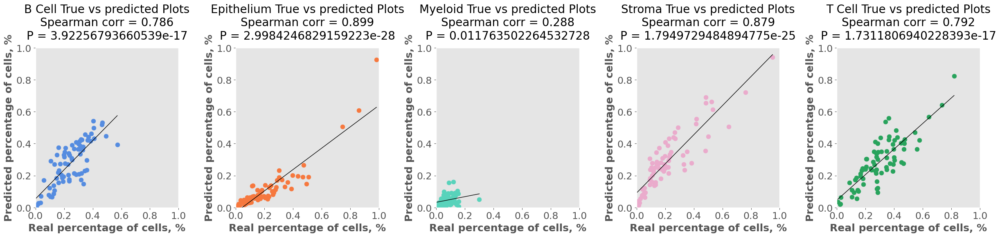

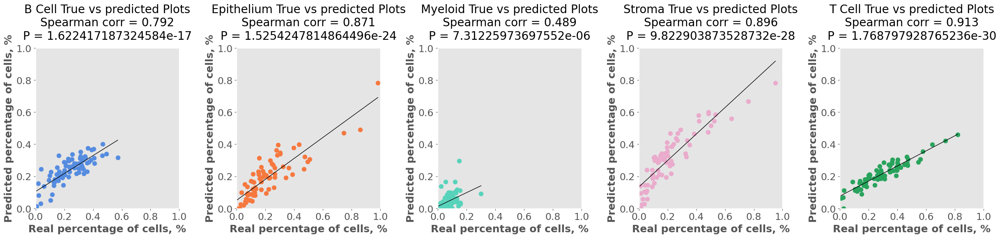

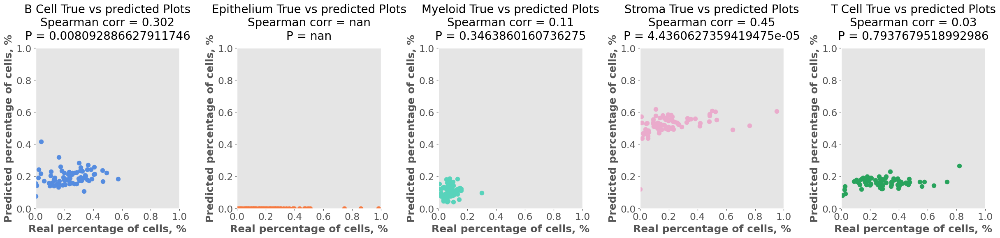

In [20]:
# correlation
plot_cell(cellanneal_atap_compartment.T, atap_true_general.T, pallete=cells_p)
plot_cell(svr_atap_compartment.T, atap_true_general.T, pallete=cells_p)
plot_cell(kass_atap_compartment.T, atap_true_general.T, pallete=cells_p, corr=False)
plot_cell(cellanneal_cleveland_compartment.T, cleveland_true_general.T, pallete=cells_p)
plot_cell(svr_cleveland_compartment.T, cleveland_true_general.T, pallete=cells_p)
plot_cell(kass_cleveland_compartment.T, cleveland_true_general.T, pallete=cells_p, corr=False)
plot_cell(cellanneal_lmu_compartment.T, lmu_true_general.T, pallete=cells_p)
plot_cell(svr_lmu_compartment.T, lmu_true_general.T, pallete=cells_p)
plot_cell(kass_lmu_compartment.T, lmu_true_general.T, pallete=cells_p, corr=False)

# length and rmse plots

In [13]:
sig_length = pd.read_csv("../data/sig_length.csv")
sig_length = sig_length.drop("Unnamed: 0",axis=1)
sig_length

,Cell_type,length
0,CD4 SELL naive,28
1,CD4 TRM,3
2,CD4 Tfh,10
3,CD4 Th17,5
4,CD4 Tph,50
5,CD4 Treg,22
6,CD8 Effector,22
7,CD8 IEL,2
8,ILC3,100
9,MAIT,5


In [392]:
dic = sig_length.set_index('Cell_type').to_dict()['length']

In [66]:
import math
def stat_generator( df_list,true,name_list=["Kassandra", "cellanneal", "SVR"],cell=True,sample=False,statistic="rmse",):

    df_final = pd.DataFrame()
    length = 999

    # Prepares the cell or sample specific dataframes
    preds_list = []
    for pred in df_list:
        if sample:
            pred = pred.T
        preds_list.append(pred)
    
    for i, pred in enumerate(preds_list):
        ind_names = pred.dropna().index.intersection(true.dropna().index)
        col_names = pred.dropna().columns.intersection(true.dropna().columns)
        predicted_values = pred.loc[ind_names, col_names].astype(float)
        true_values = true.loc[ind_names, col_names].astype(float)
        print(predicted_values.shape)
        print(true_values.shape)
        predicted_values = predicted_values.T
        true_values = true_values.T
        cells = true_values.columns
        stat = statsTest()

        temp2 = predicted_values.shape[1]
        if temp2 < length:
            length = temp2

        # benchmarks based on statistic
        benchmark_list = []
        for x, cell in enumerate(cells):
            if statistic == "pearson":
                val = scipy.stats.spearmanr(predicted_values[cell], true_values[cell])
            elif statistic == "r2":
                val = stat.R_squared(predicted_values[cell], true_values[cell])
            elif statistic == "residual":
                r =  abs(true_values[cell] - predicted_values[cell])
                val = (r - true_values[cell].mean()/ true_values[cell].std())
            elif statistic == "rmse":
                r = stat.rmse(predicted_values[cell], true_values[cell])
                val = (r / (true_values[cell].max() - true_values[cell].min()))/100
            else:
                return "invalid prompt"
            if statistic == "residual":
                benchmark_list.append(val[1])
            elif statistic == "pearson":
                benchmark_list.append(val[0])
            else:
                benchmark_list.append(val)

        # create final dataframes
        benchmark_list = benchmark_list[0:length]
        df_final[name_list[i]] = benchmark_list
        if i == 0:
            index_name = predicted_values.columns
            df_final.index = index_name
        
    return df_final

In [67]:
a2 = stat_generator([kass_atap_compartment.T, cellanneal_atap_compartment.T, svr_atap_compartment.T],atap_true_general.T, statistic = 'residual')
b2 = stat_generator([kass_atap_compartment.T, cellanneal_atap_compartment.T, svr_atap_compartment.T],atap_true_general.T, statistic = 'rmse')
c2 = stat_generator([kass_cleveland_compartment.T, cellanneal_cleveland_compartment.T, svr_cleveland_compartment.T],cleveland_true_general.T, statistic = 'residual')
d2 = stat_generator([kass_cleveland_compartment.T, cellanneal_cleveland_compartment.T, svr_cleveland_compartment.T],cleveland_true_general.T, statistic = 'rmse')
e2 = stat_generator([kass_lmu_compartment.T, cellanneal_lmu_compartment.T, svr_lmu_compartment.T],lmu_true_general.T, statistic = 'residual')
f2 = stat_generator([kass_lmu_compartment.T, cellanneal_lmu_compartment.T, svr_lmu_compartment.T],lmu_true_general.T, statistic = 'rmse')

(5, 223)
(5, 223)
(5, 223)
(5, 223)
(5, 223)
(5, 223)
(5, 223)
(5, 223)
(5, 223)
(5, 223)
(5, 223)
(5, 223)
(5, 30)
(5, 30)
(5, 30)
(5, 30)
(5, 30)
(5, 30)
(5, 30)
(5, 30)
(5, 30)
(5, 30)
(5, 30)
(5, 30)
(5, 76)
(5, 76)
(5, 76)
(5, 76)
(5, 76)
(5, 76)
(5, 76)
(5, 76)
(5, 76)
(5, 76)
(5, 76)
(5, 76)


In [71]:
g = stat_generator([cellanneal_atap.T, cellanneal_atap.T, svr_atap.T],atap_true.T, statistic = 'residual')
h = stat_generator([cellanneal_atap.T, cellanneal_atap.T, svr_atap.T],atap_true.T, statistic = 'rmse')
i = stat_generator([cellanneal_cleveland.T, cellanneal_cleveland.T, svr_cleveland.T],cleveland_true.T, statistic = 'residual')
j = stat_generator([cellanneal_cleveland.T, cellanneal_cleveland.T, svr_cleveland.T],cleveland_true.T, statistic = 'rmse')
k = stat_generator([cellanneal_lmu.T, cellanneal_lmu.T, svr_lmu.T],lmu_true.T, statistic = 'residual')
l = stat_generator([cellanneal_lmu.T, cellanneal_lmu.T, svr_lmu.T],lmu_true.T, statistic = 'rmse')

(45, 223)
(45, 223)
(45, 223)
(45, 223)
(45, 223)
(45, 223)
(45, 223)
(45, 223)
(45, 223)
(45, 223)
(45, 223)
(45, 223)
(45, 30)
(45, 30)
(45, 30)
(45, 30)
(45, 30)
(45, 30)
(45, 30)
(45, 30)
(45, 30)
(45, 30)
(45, 30)
(45, 30)
(45, 76)
(45, 76)
(45, 76)
(45, 76)
(45, 76)
(45, 76)
(45, 76)
(45, 76)
(45, 76)
(45, 76)
(45, 76)
(45, 76)


In [72]:
a = pd.concat([a2,g])
b = pd.concat([b2,h])
c = pd.concat([c2,i])
d = pd.concat([d2,j])
e = pd.concat([e2,k])
f = pd.concat([f2,l])

In [73]:
def scatter(list_df, title, metric, polynominal=False):
    dataset = ['ATAP', 'Cleveland', 'LMU']
    colors = ['#e24a33','#348abd','#988ed5','#e24a33','#348abd','#988ed5','#e24a33','#348abd','#988ed5']
    num = 0
    dic = sig_length.set_index('Cell_type').to_dict()['length']
    for a in list_df:
        x = np.tile(a.columns, len(a.index))
        y = np.repeat(a.index, len(a.columns))
        z = a.values.ravel()

        df = pd.DataFrame({'cell_type':y,'algorithm':x, 'value':z})
        df['length']= df['cell_type'].map(dic)
        df = df.sort_values(by='algorithm', ascending=True)
        df = df.reset_index()
        df = df.drop("index",axis=1)

        compart = pd.read_csv("../../../../../cbbi-data00/projects/Methods/bulk-deconvolution/cell_type_hierarchy.csv")
        dic2 = compart.set_index('child').to_dict()['parent']
        df['compartment']= df['cell_type'].map(dic2)
        

        # plotting this data
        display(df)
        text = df['cell_type'].to_list()
        for col, alg in enumerate(df.algorithm.unique()):
            temp = df[df['algorithm']==alg]
            sns.scatterplot(data=temp, x="length", y="value", hue="compartment",s=100)
            if polynominal:
                model = np.poly1d(np.polyfit(temp.length, temp.value, 2))
                polyline = np.linspace(1, 100, 1000)
                sns.lineplot(x=polyline, y=model(polyline),label=alg,c=colors[col])
            # Loop for annotation of all points
            counter = 0
            for i in range(0,len(df)//3):
                if counter % 2 == 1:
                    plt.annotate(text[i], (df['length'][i], df['value'][i] + 0.02), xytext=(5, 5), textcoords="offset pixels", fontsize = 6)
                else: 
                    plt.annotate(text[i], (df['length'][i], df['value'][i] - 0.02), xytext=(5, 5), textcoords="offset pixels", fontsize = 6)
                counter = counter+1
            plt.title(alg+" "+title+" "+ str(dataset[num]) )
            plt.legend()
            plt.xlim(0, 105)
            plt.xlabel("Gene Signature Length")
            plt.ylabel(metric)
            plt.show()
        num  = num+1

,cell_type,algorithm,value,length,compartment
0,B Cell,Kassandra,-1.979778,95,NaN
1,Monocyte Inflammatory,Kassandra,-0.399811,65,Myeloid
2,Myofibroblast,Kassandra,-0.799991,38,Stroma
3,NK,Kassandra,-0.779268,69,T Cell
4,Inflammatory Fibroblast,Kassandra,-0.355346,83,Stroma
...,...,...,...,...,...
145,Tuft Cell,cellanneal,-0.721234,100,Epithelium
146,Monocyte Inflammatory,cellanneal,-0.399811,65,Myeloid
147,Myofibroblast,cellanneal,-0.799991,38,Stroma
148,Pericyte,cellanneal,-0.919875,67,Stroma


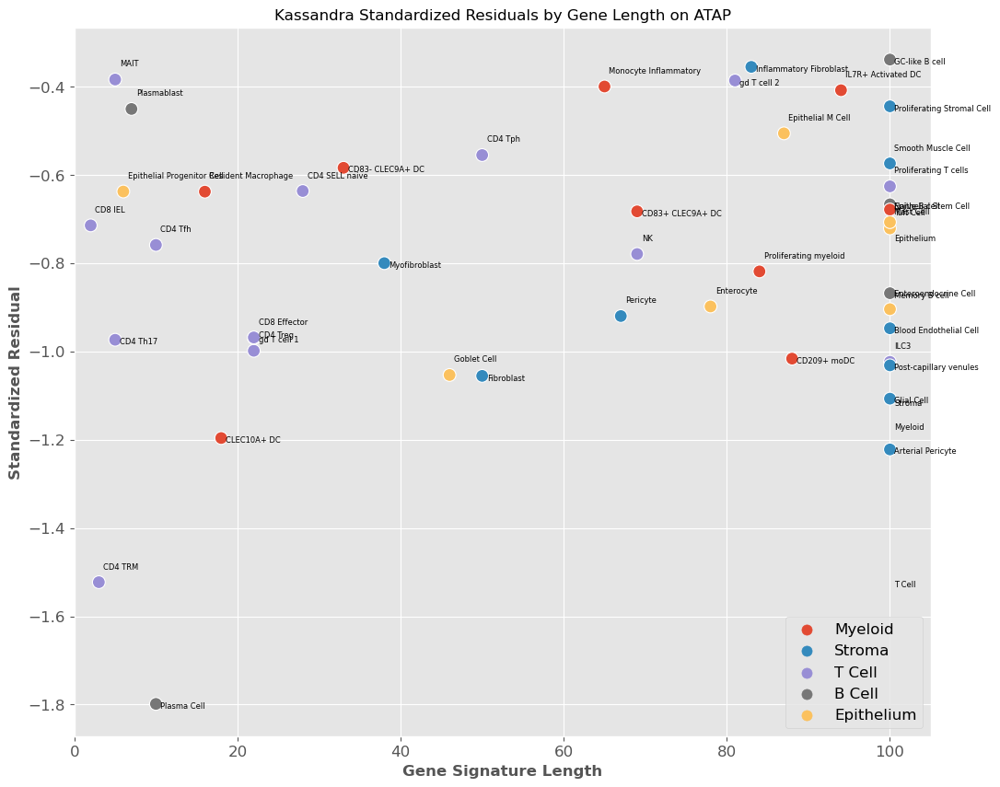

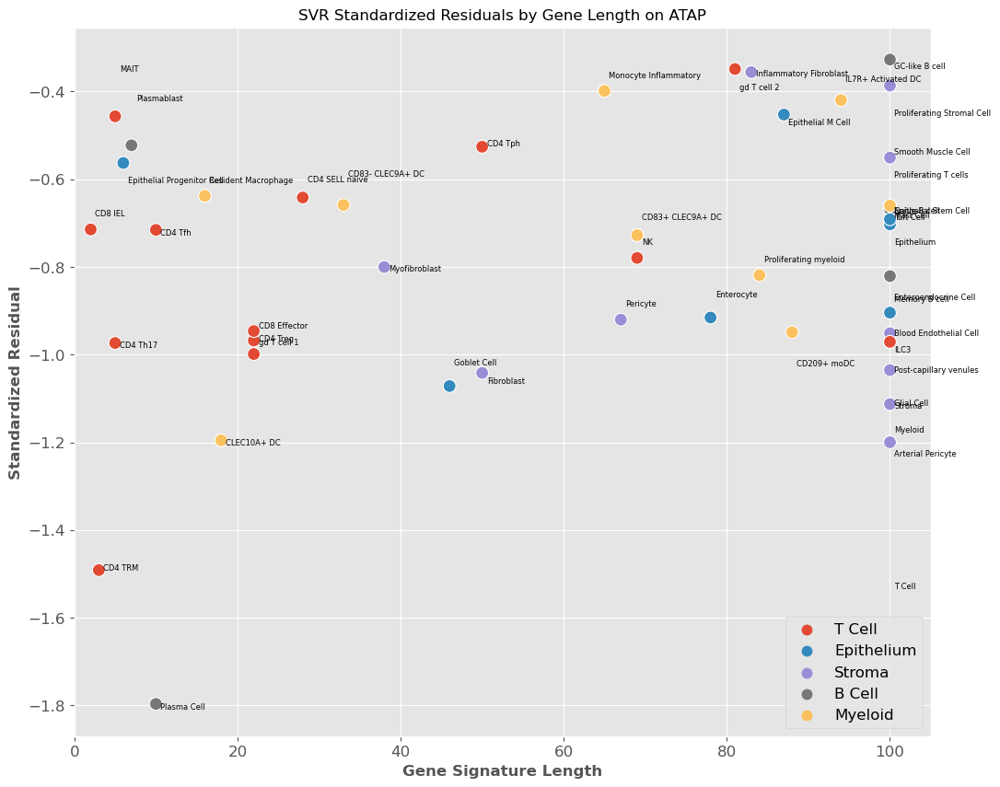

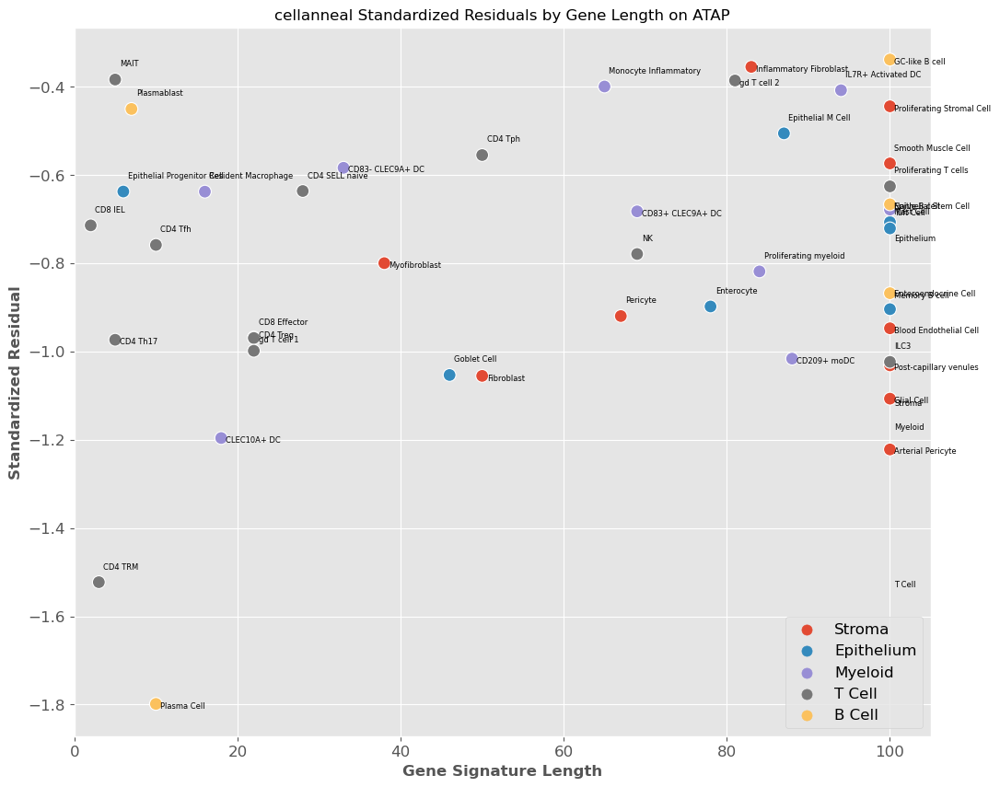

,cell_type,algorithm,value,length,compartment
0,B Cell,Kassandra,-1.209279,95,NaN
1,Monocyte Inflammatory,Kassandra,-0.483400,65,Myeloid
2,Myofibroblast,Kassandra,-0.308579,38,Stroma
3,NK,Kassandra,-1.260208,69,T Cell
4,Inflammatory Fibroblast,Kassandra,-0.505028,83,Stroma
...,...,...,...,...,...
145,Tuft Cell,cellanneal,-0.437407,100,Epithelium
146,Monocyte Inflammatory,cellanneal,-0.483400,65,Myeloid
147,Myofibroblast,cellanneal,-0.308579,38,Stroma
148,Pericyte,cellanneal,-0.859617,67,Stroma


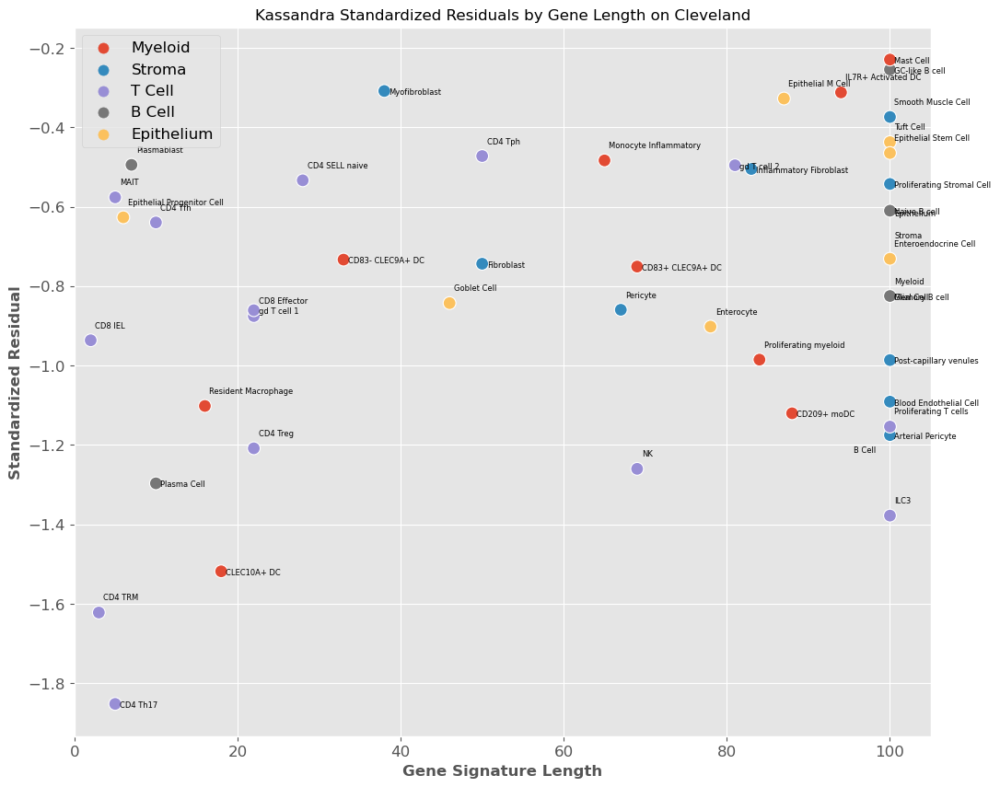

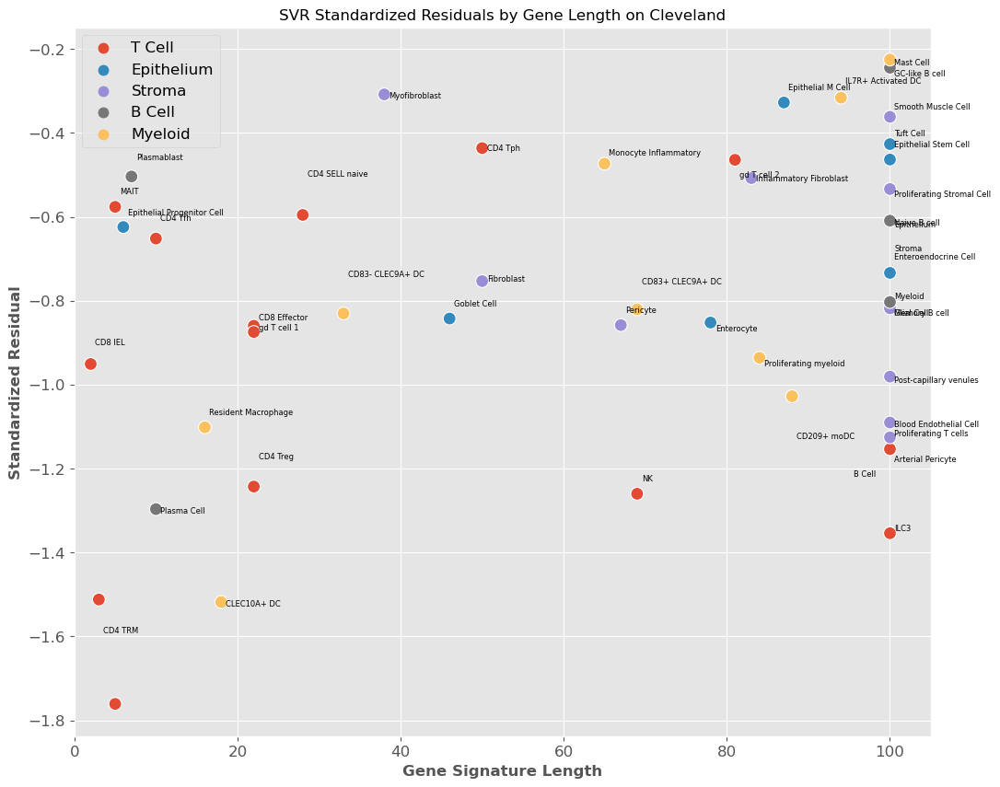

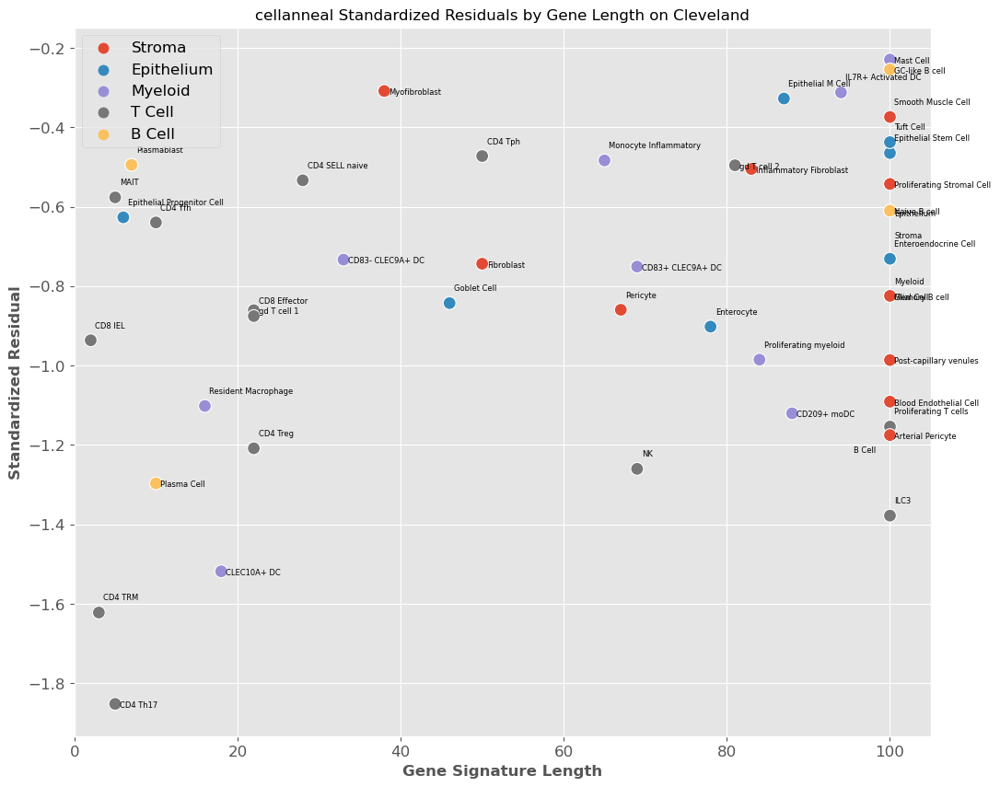

,cell_type,algorithm,value,length,compartment
0,B Cell,Kassandra,-1.541264,95,NaN
1,Monocyte Inflammatory,Kassandra,-0.604466,65,Myeloid
2,Myofibroblast,Kassandra,-0.540468,38,Stroma
3,NK,Kassandra,-0.946331,69,T Cell
4,Inflammatory Fibroblast,Kassandra,-0.284273,83,Stroma
...,...,...,...,...,...
145,Tuft Cell,cellanneal,-0.747812,100,Epithelium
146,Monocyte Inflammatory,cellanneal,-0.604466,65,Myeloid
147,Myofibroblast,cellanneal,-0.540468,38,Stroma
148,Pericyte,cellanneal,-0.817664,67,Stroma


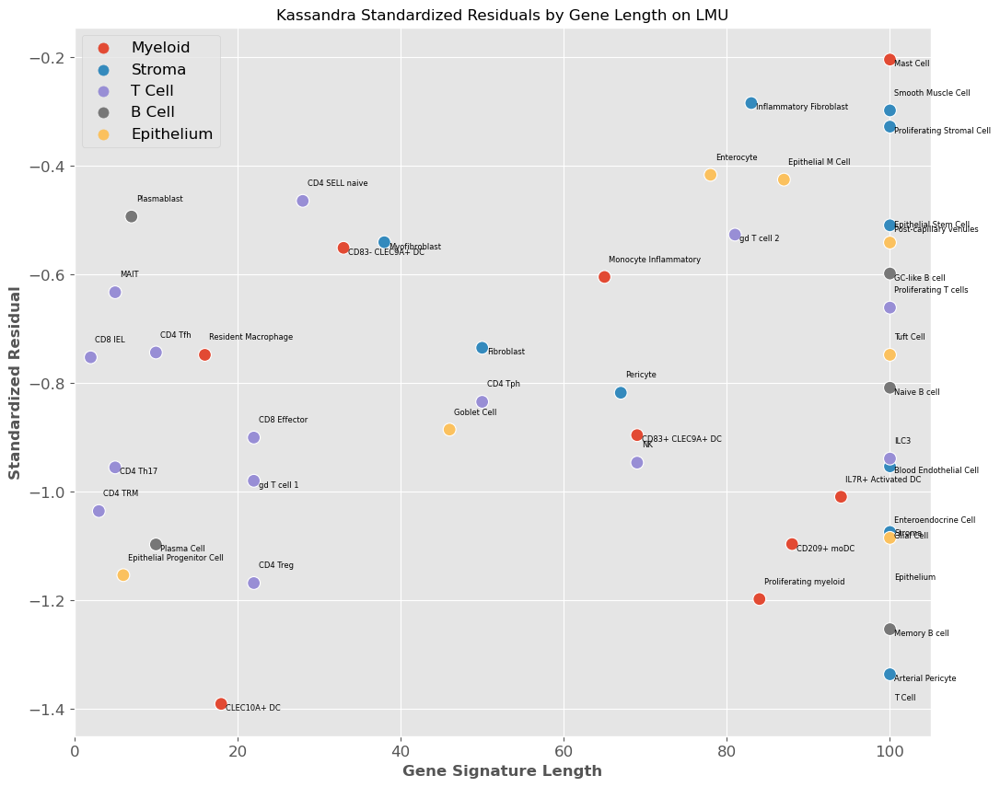

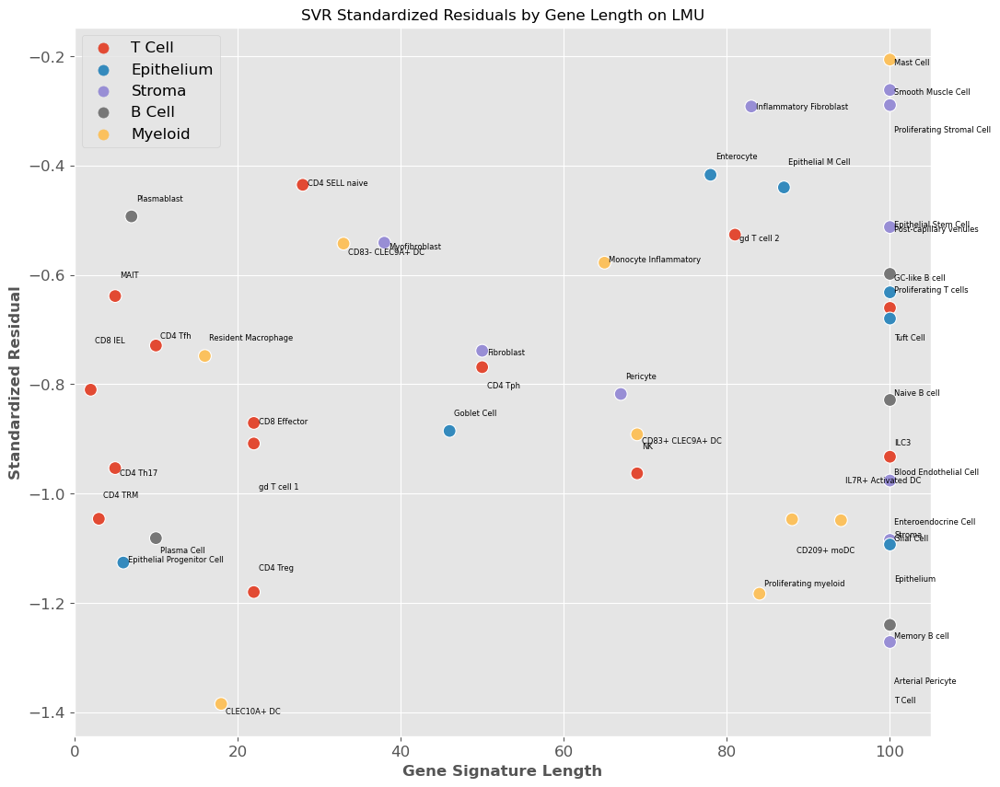

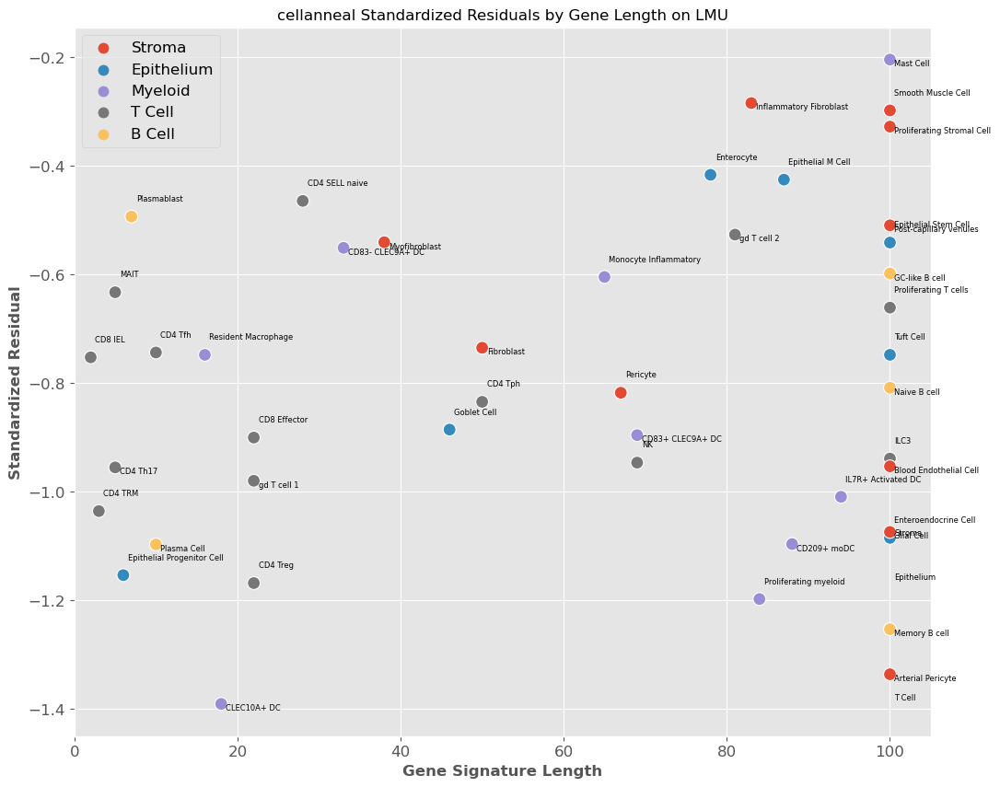

In [74]:
scatter([a,c,e], "Standardized Residuals by Gene Length on", "Standardized Residual")

,cell_type,algorithm,value,length,compartment
0,B Cell,Kassandra,0.001953,95,NaN
1,Monocyte Inflammatory,Kassandra,0.000648,65,Myeloid
2,Myofibroblast,Kassandra,0.001331,38,Stroma
3,NK,Kassandra,0.001065,69,T Cell
4,Inflammatory Fibroblast,Kassandra,0.003569,83,Stroma
...,...,...,...,...,...
145,Tuft Cell,cellanneal,0.001289,100,Epithelium
146,Monocyte Inflammatory,cellanneal,0.000648,65,Myeloid
147,Myofibroblast,cellanneal,0.001331,38,Stroma
148,Pericyte,cellanneal,0.000998,67,Stroma


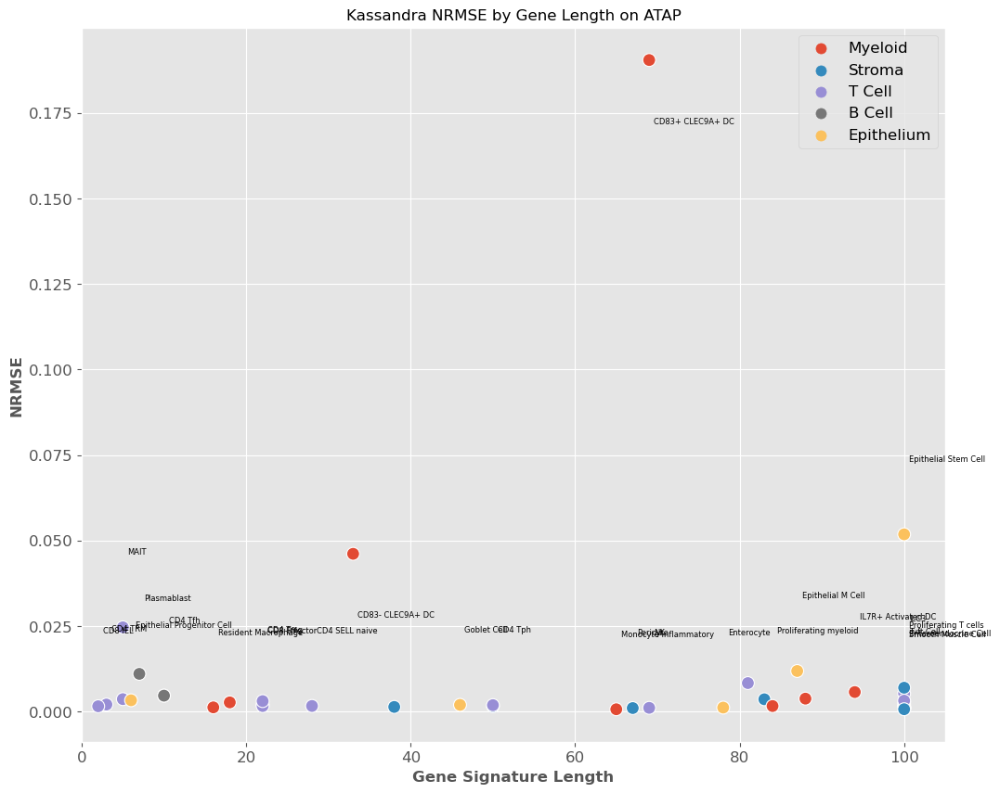

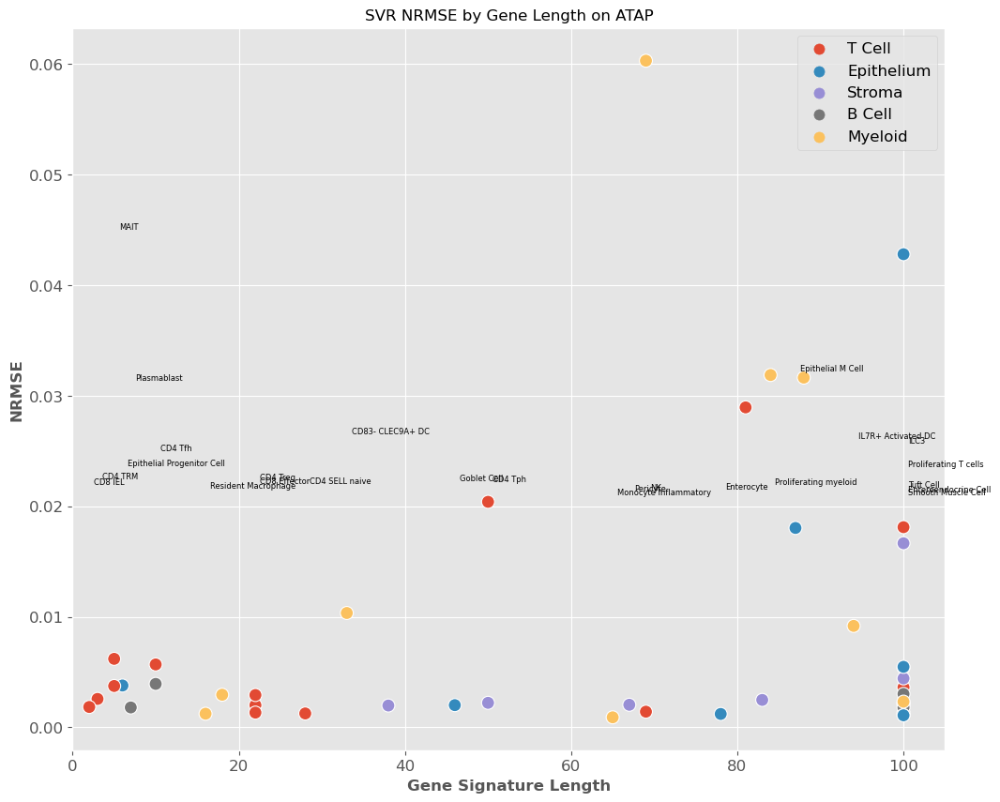

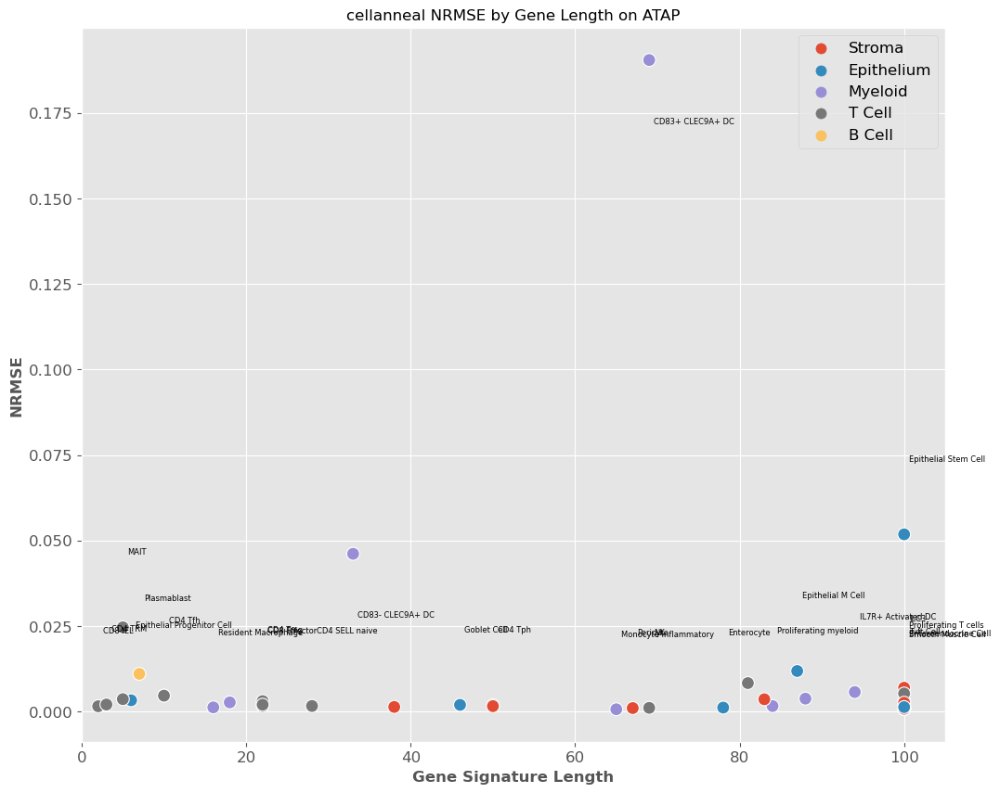

,cell_type,algorithm,value,length,compartment
0,B Cell,Kassandra,0.002378,95,NaN
1,Monocyte Inflammatory,Kassandra,0.002258,65,Myeloid
2,Myofibroblast,Kassandra,0.000343,38,Stroma
3,NK,Kassandra,0.002941,69,T Cell
4,Inflammatory Fibroblast,Kassandra,0.013185,83,Stroma
...,...,...,...,...,...
145,Tuft Cell,cellanneal,0.004342,100,Epithelium
146,Monocyte Inflammatory,cellanneal,0.002258,65,Myeloid
147,Myofibroblast,cellanneal,0.000343,38,Stroma
148,Pericyte,cellanneal,0.001549,67,Stroma


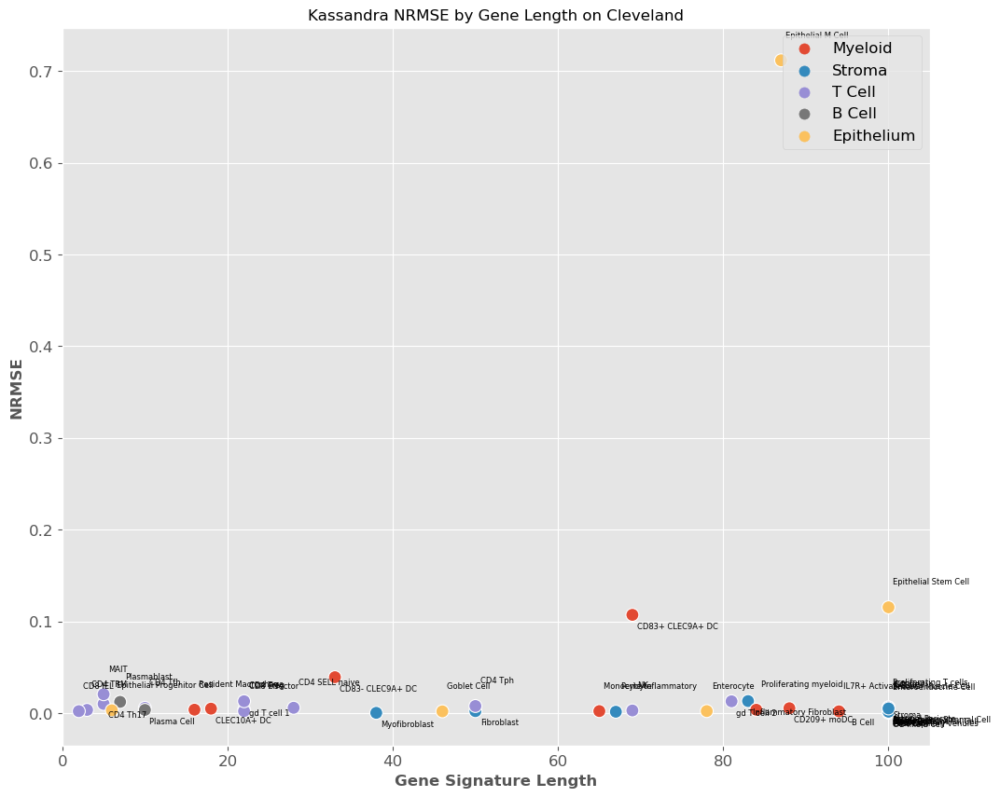

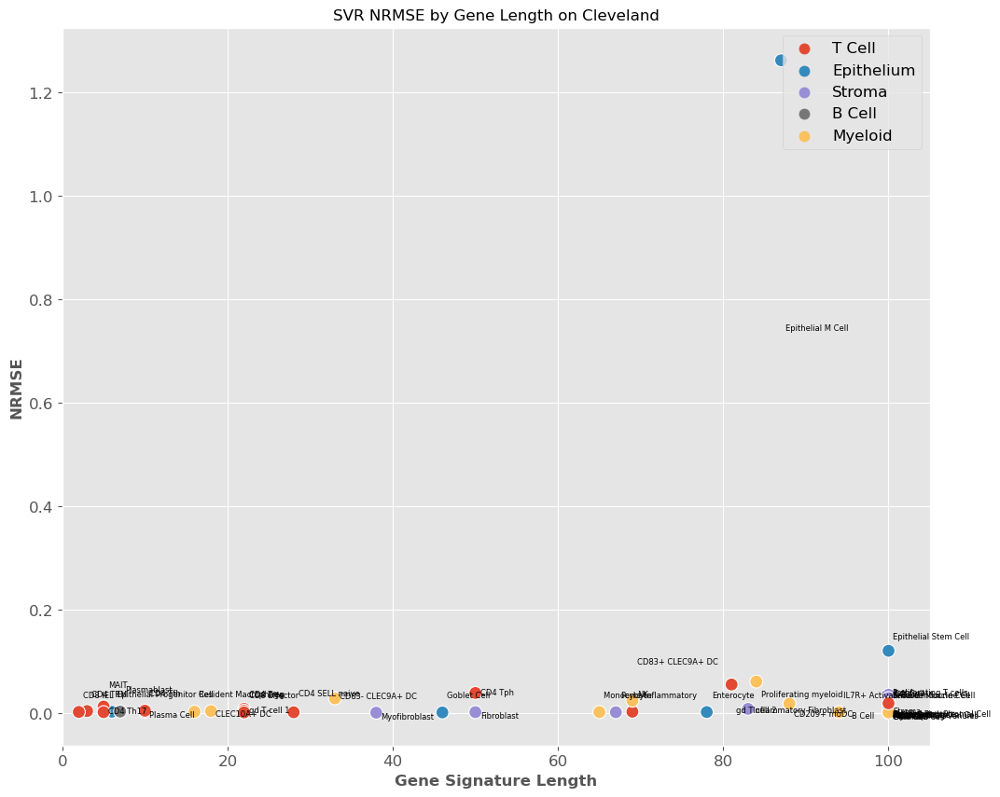

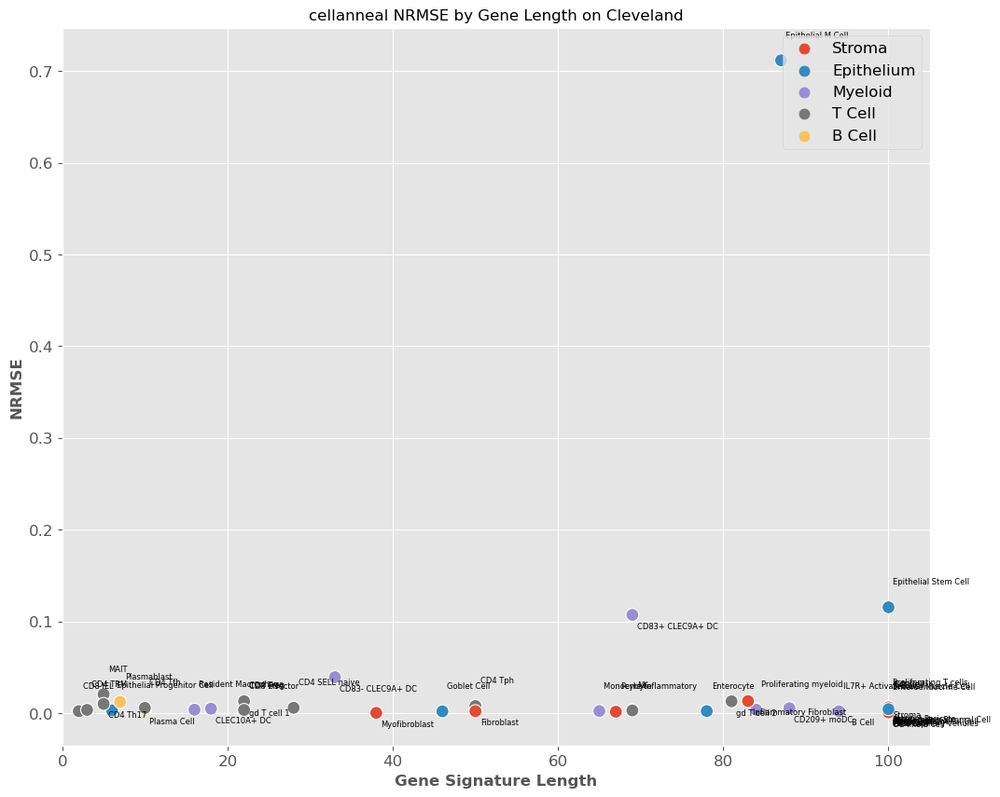

,cell_type,algorithm,value,length,compartment
0,B Cell,Kassandra,0.002327,95,NaN
1,Monocyte Inflammatory,Kassandra,0.000661,65,Myeloid
2,Myofibroblast,Kassandra,0.001011,38,Stroma
3,NK,Kassandra,0.001995,69,T Cell
4,Inflammatory Fibroblast,Kassandra,0.004815,83,Stroma
...,...,...,...,...,...
145,Tuft Cell,cellanneal,0.002398,100,Epithelium
146,Monocyte Inflammatory,cellanneal,0.000661,65,Myeloid
147,Myofibroblast,cellanneal,0.001011,38,Stroma
148,Pericyte,cellanneal,0.001111,67,Stroma


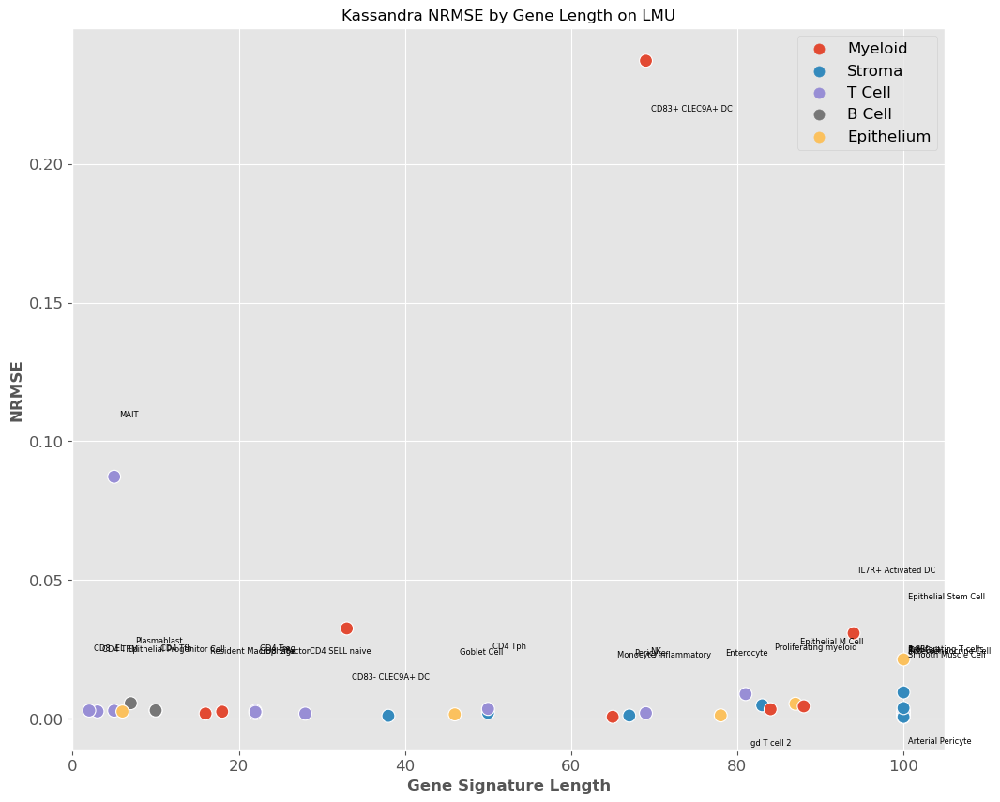

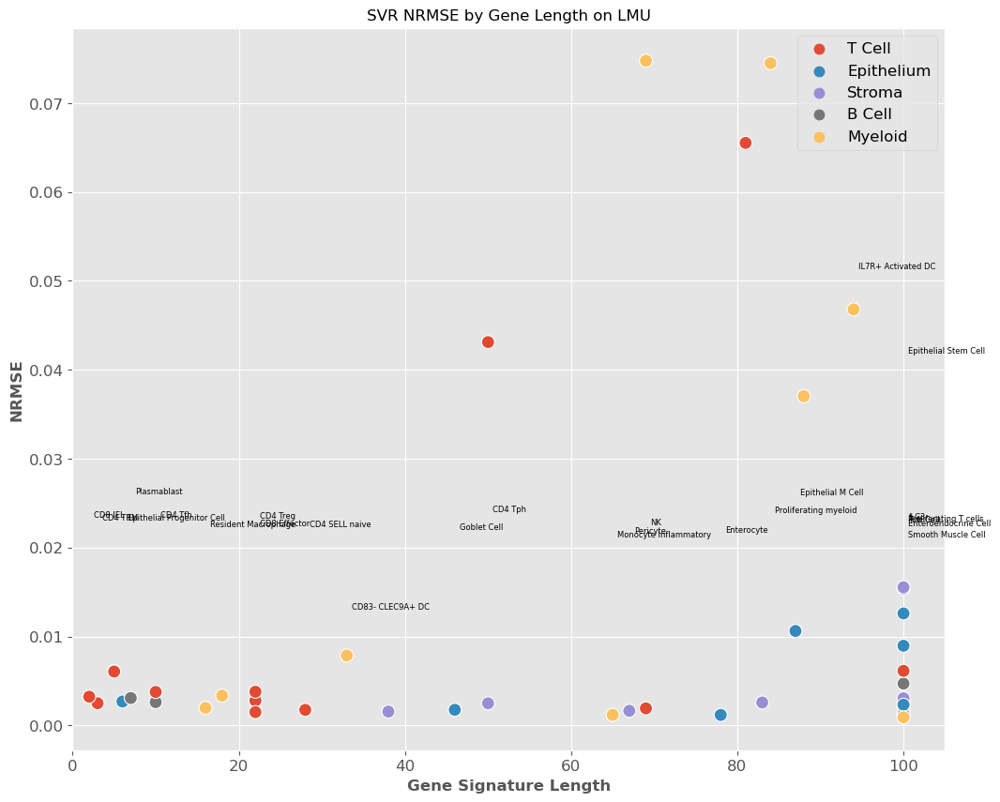

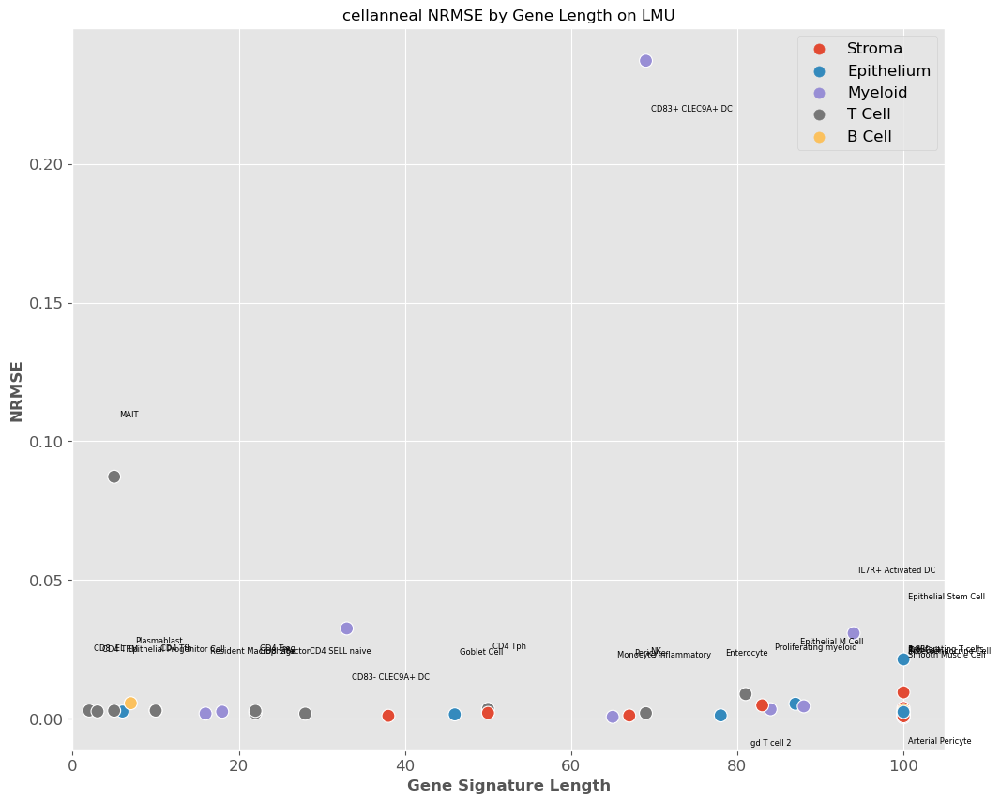

In [50]:
scatter([b,d,f], "NRMSE by Gene Length on", "NRMSE")

# true percentages vs rmse

In [51]:
# Constructing true percentages
atap_true['Myeloid'] = atap_true['CD209+ moDC'] + atap_true['CD83+ CLEC9A+ DC'] + atap_true['CD83- CLEC9A+ DC']+atap_true['CLEC10A+ DC']+atap_true['IL7R+ Activated DC']+atap_true['Mast Cell']+atap_true['Memory B cell']+atap_true['Monocyte Inflammatory']+atap_true['Proliferating myeloid']+atap_true['Resident Macrophage']
atap_true['T Cell'] = atap_true['CD4 SELL naive'] + atap_true['CD4 TRM'] + atap_true['CD4 Tfh']+atap_true['CD4 Th17']+atap_true['CD4 Tph']+atap_true['CD4 Treg']+atap_true['CD8 Effector']+atap_true['CD8 IEL']+atap_true['CD8 SELL Naive']+atap_true['ILC3']+atap_true['MAIT']+atap_true['NK']+atap_true['Proliferating T cells']+atap_true['gd T cell 1']+atap_true['gd T cell 2']
atap_true['B Cell'] = atap_true['GC-like B cell'] + atap_true['Memory B cell'] + atap_true['Naive B cell']+atap_true['Plasma Cell']+atap_true['Plasmablast']
atap_true['Stroma'] = atap_true['Arterial Pericyte'] + atap_true['Blood Endothelial Cell'] + atap_true['Fibroblast']+atap_true['Glial Cell']+atap_true['Inflammatory Fibroblast']+atap_true['Myofibroblast']+atap_true['Pericyte']+atap_true['Post-capillary venules']+atap_true['Proliferating Stromal Cell']+atap_true['Smooth Muscle Cell']
atap_true['Epithelium'] = atap_true['Enterocyte'] + atap_true['Enteroendocrine Cell'] + atap_true['Epithelial M Cell']+atap_true['Epithelial Progenitor Cell']+atap_true['Epithelial Stem Cell']+atap_true['Goblet Cell']+atap_true['Tuft Cell']

In [52]:
cleveland_true['Myeloid'] = cleveland_true['CD209+ moDC'] + cleveland_true['CD83+ CLEC9A+ DC'] + cleveland_true['CD83- CLEC9A+ DC']+cleveland_true['CLEC10A+ DC']+cleveland_true['IL7R+ Activated DC']+cleveland_true['Mast Cell']+cleveland_true['Memory B cell']+cleveland_true['Monocyte Inflammatory']+cleveland_true['Proliferating myeloid']+cleveland_true['Resident Macrophage']
cleveland_true['T Cell'] = cleveland_true['CD4 SELL naive'] + cleveland_true['CD4 TRM'] + cleveland_true['CD4 Tfh']+cleveland_true['CD4 Th17']+cleveland_true['CD4 Tph']+cleveland_true['CD4 Treg']+cleveland_true['CD8 Effector']+cleveland_true['CD8 IEL']+cleveland_true['CD8 SELL Naive']+cleveland_true['ILC3']+cleveland_true['MAIT']+cleveland_true['NK']+cleveland_true['Proliferating T cells']+cleveland_true['gd T cell 1']+cleveland_true['gd T cell 2']
cleveland_true['B Cell'] = cleveland_true['GC-like B cell'] + cleveland_true['Memory B cell'] + cleveland_true['Naive B cell']+cleveland_true['Plasma Cell']+cleveland_true['Plasmablast']
cleveland_true['Stroma'] = cleveland_true['Arterial Pericyte'] + cleveland_true['Blood Endothelial Cell'] + cleveland_true['Fibroblast']+cleveland_true['Glial Cell']+cleveland_true['Inflammatory Fibroblast']+cleveland_true['Myofibroblast']+cleveland_true['Pericyte']+cleveland_true['Post-capillary venules']+cleveland_true['Proliferating Stromal Cell']+cleveland_true['Smooth Muscle Cell']
cleveland_true['Epithelium'] = cleveland_true['Enterocyte'] + cleveland_true['Enteroendocrine Cell'] + cleveland_true['Epithelial M Cell']+cleveland_true['Epithelial Progenitor Cell']+cleveland_true['Epithelial Stem Cell']+cleveland_true['Goblet Cell']+cleveland_true['Tuft Cell']

In [53]:
lmu_true['Myeloid'] = lmu_true['CD209+ moDC'] + lmu_true['CD83+ CLEC9A+ DC'] + lmu_true['CD83- CLEC9A+ DC']+lmu_true['CLEC10A+ DC']+lmu_true['IL7R+ Activated DC']+lmu_true['Mast Cell']+lmu_true['Memory B cell']+lmu_true['Monocyte Inflammatory']+lmu_true['Proliferating myeloid']+lmu_true['Resident Macrophage']
lmu_true['T Cell'] = lmu_true['CD4 SELL naive'] + lmu_true['CD4 TRM'] + lmu_true['CD4 Tfh']+lmu_true['CD4 Th17']+lmu_true['CD4 Tph']+lmu_true['CD4 Treg']+lmu_true['CD8 Effector']+lmu_true['CD8 IEL']+lmu_true['CD8 SELL Naive']+lmu_true['ILC3']+lmu_true['MAIT']+lmu_true['NK']+lmu_true['Proliferating T cells']+lmu_true['gd T cell 1']+lmu_true['gd T cell 2']
lmu_true['B Cell'] = lmu_true['GC-like B cell'] + lmu_true['Memory B cell'] + lmu_true['Naive B cell']+lmu_true['Plasma Cell']+lmu_true['Plasmablast']
lmu_true['Stroma'] = lmu_true['Arterial Pericyte'] + lmu_true['Blood Endothelial Cell'] + lmu_true['Fibroblast']+lmu_true['Glial Cell']+lmu_true['Inflammatory Fibroblast']+lmu_true['Myofibroblast']+lmu_true['Pericyte']+lmu_true['Post-capillary venules']+lmu_true['Proliferating Stromal Cell']+lmu_true['Smooth Muscle Cell']
lmu_true['Epithelium'] = lmu_true['Enterocyte'] + lmu_true['Enteroendocrine Cell'] + lmu_true['Epithelial M Cell']+lmu_true['Epithelial Progenitor Cell']+lmu_true['Epithelial Stem Cell']+lmu_true['Goblet Cell']+lmu_true['Tuft Cell']

In [61]:
def scatter2(list_df, df_list, title, metric, dataset = ['ATAP', 'Cleveland', 'LMU'], polynominal=False):
    for x, a in enumerate(list_df):
        colors = ['#e24a33','#348abd','#988ed5']
        compart = pd.read_csv("../../../../../cbbi-data00/projects/Methods/bulk-deconvolution/cell_type_hierarchy.csv")
        dic2 = compart.set_index('child').to_dict()['parent']
        a['compartment']= a.index.map(dic2)
        a.index.name = 'cell_type'
        df = a.merge(df_list[x], left_index=True, right_index=True)

        for col, alg in enumerate(['Kassandra', 'SVR', 'cellanneal']):
            sns.scatterplot(data=df, x="true_value", y=alg, hue='compartment')

            if polynominal:
                model = np.poly1d(np.polyfit(df.true_value, df[alg], 2))

                polyline = np.linspace(0, 0.35, 100)
                sns.lineplot(x=polyline, y=model(polyline),label=alg,c=colors[col])
            text = df.index.to_list()
            # # Loop for annotation of all points
            counter = 0
            for i in range(0,len(df)):
                if counter % 2 == 1:
                    plt.annotate(text[i], (df['true_value'][i], df[alg][i] + 0.004), xytext=(5, 5), textcoords="offset pixels", fontsize = 6)
                else: 
                    plt.annotate(text[i], (df['true_value'][i], df[alg][i] - 0.004), xytext=(5, 5), textcoords="offset pixels", fontsize = 6)
                counter = counter+1
            plt.title(alg+" "+title+" "+dataset[x])
            plt.legend()
            plt.xlabel("Average Cell Type True Proportion")
            plt.ylabel(metric)
            plt.show()

In [55]:
g = pd.DataFrame(columns=['cell_type', 'true_value'])
h = pd.DataFrame(columns=['cell_type', 'true_value'])
i = pd.DataFrame(columns=['cell_type', 'true_value'])

In [56]:
atap_true = atap_true.reset_index()
atap_true = atap_true.drop("sample", axis=1)
cleveland_true = cleveland_true.reset_index()
cleveland_true = cleveland_true.drop("sample", axis=1)
lmu_true = lmu_true.reset_index()
lmu_true = lmu_true.drop("sample", axis=1)

In [57]:
for x, cell in enumerate(atap_true.columns):
    g.loc[x] = [cell, atap_true.loc[:, cell].mean()]

for x, cell in enumerate(cleveland_true.columns):
    h.loc[x] = [cell, cleveland_true.loc[:, cell].mean()]

for x, cell in enumerate(lmu_true.columns):
    i.loc[x] = [cell, lmu_true.loc[:, cell].mean()]

In [58]:
g = g.drop(0)
h = h.drop(0)
i = i.drop(0)

In [59]:
g = g.set_index('cell_type')
h = h.set_index('cell_type')
i = i.set_index('cell_type')

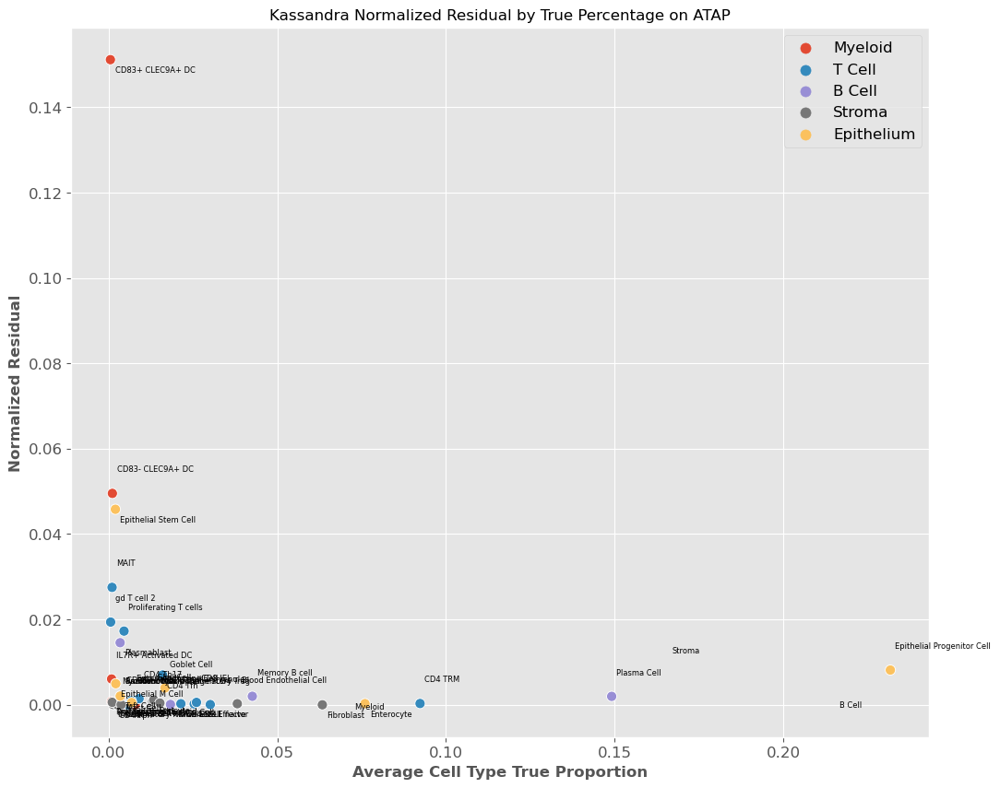

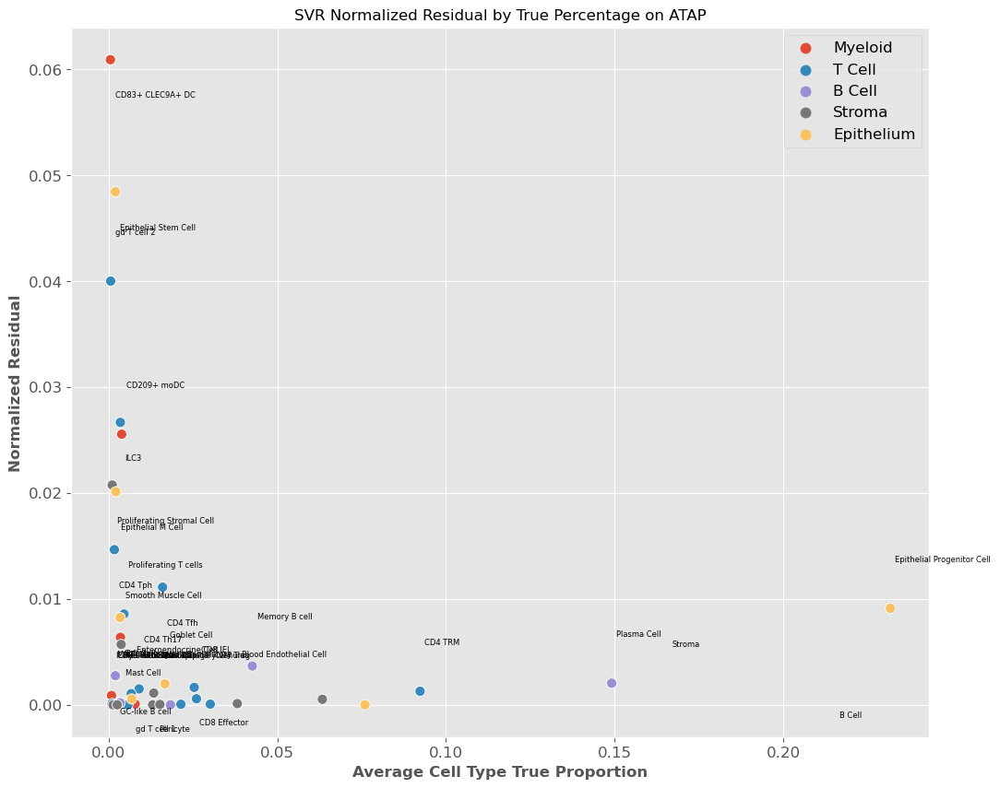

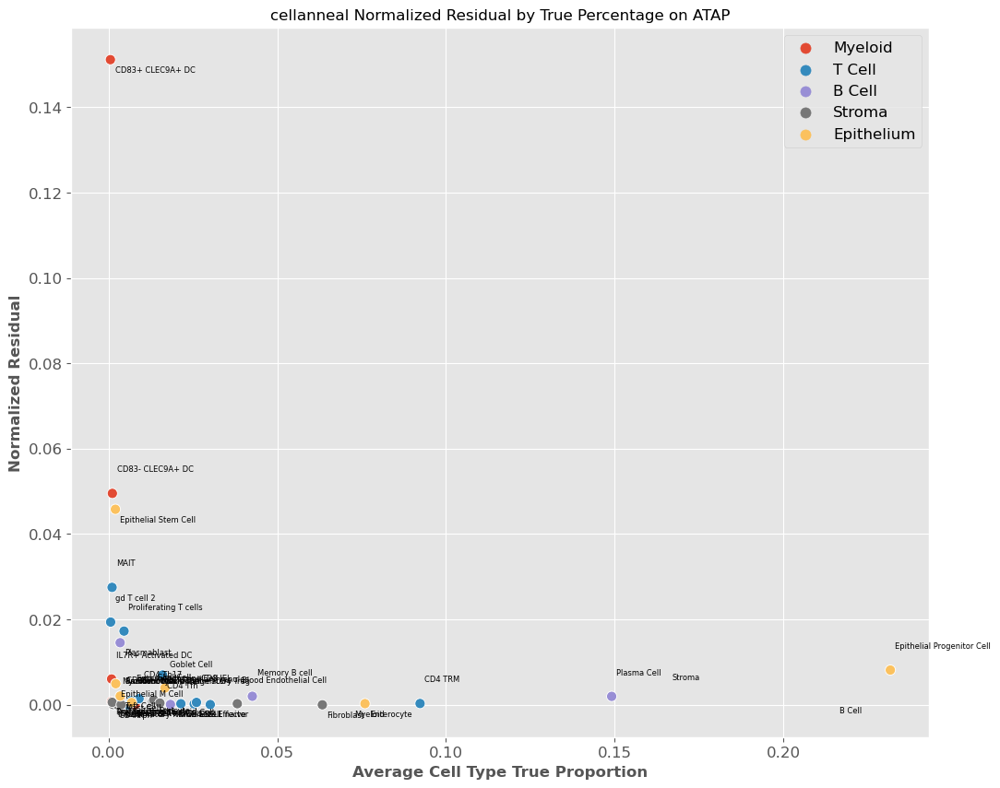

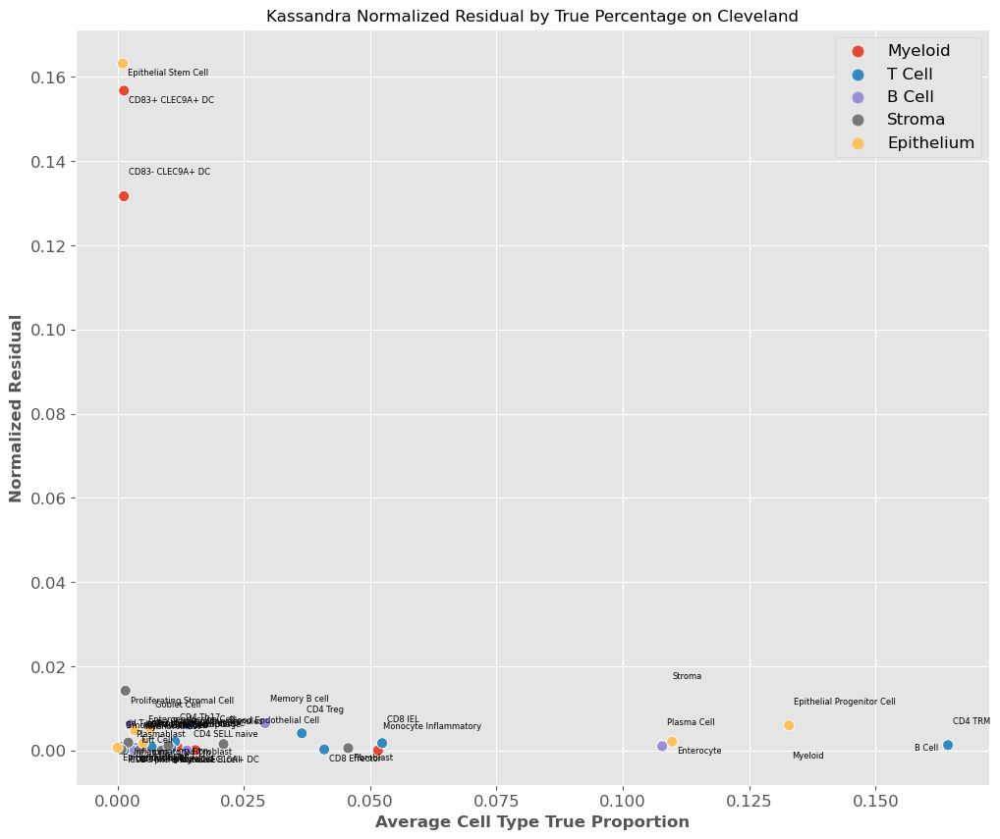

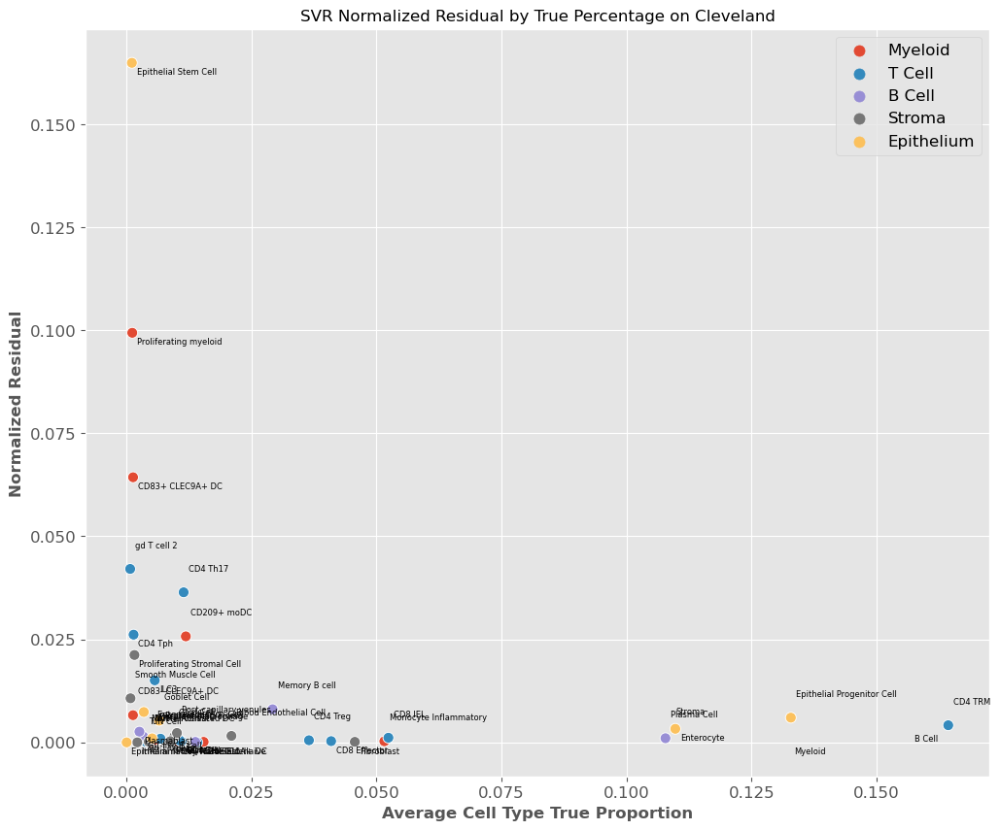

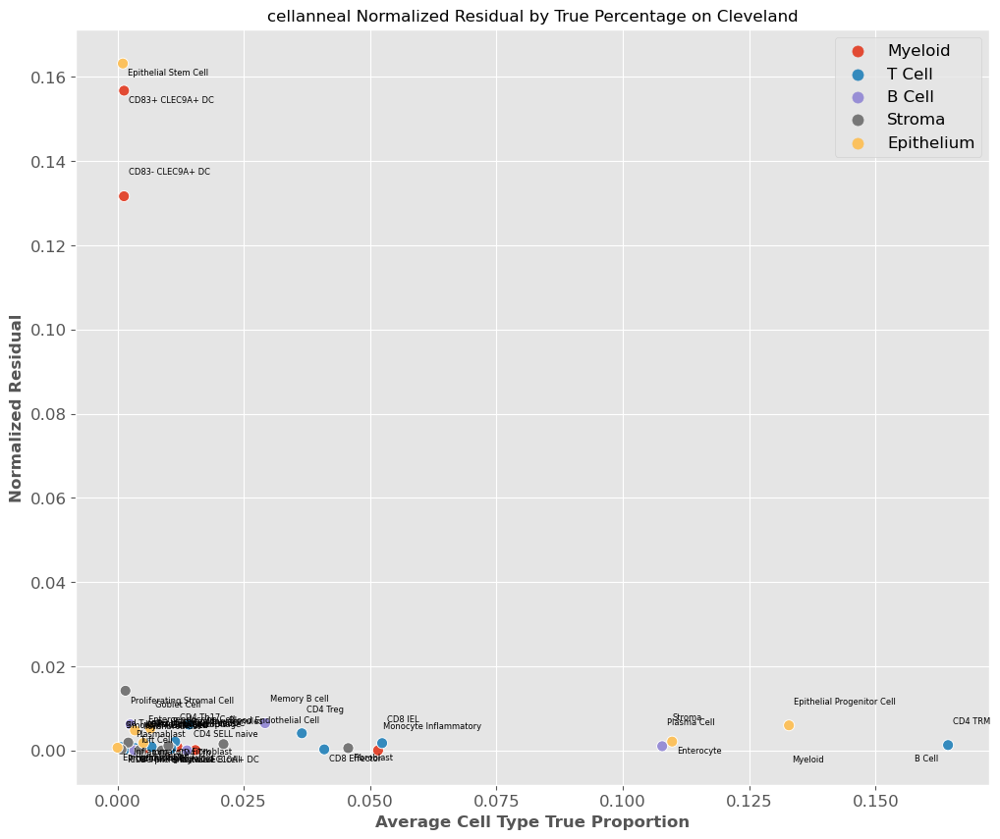

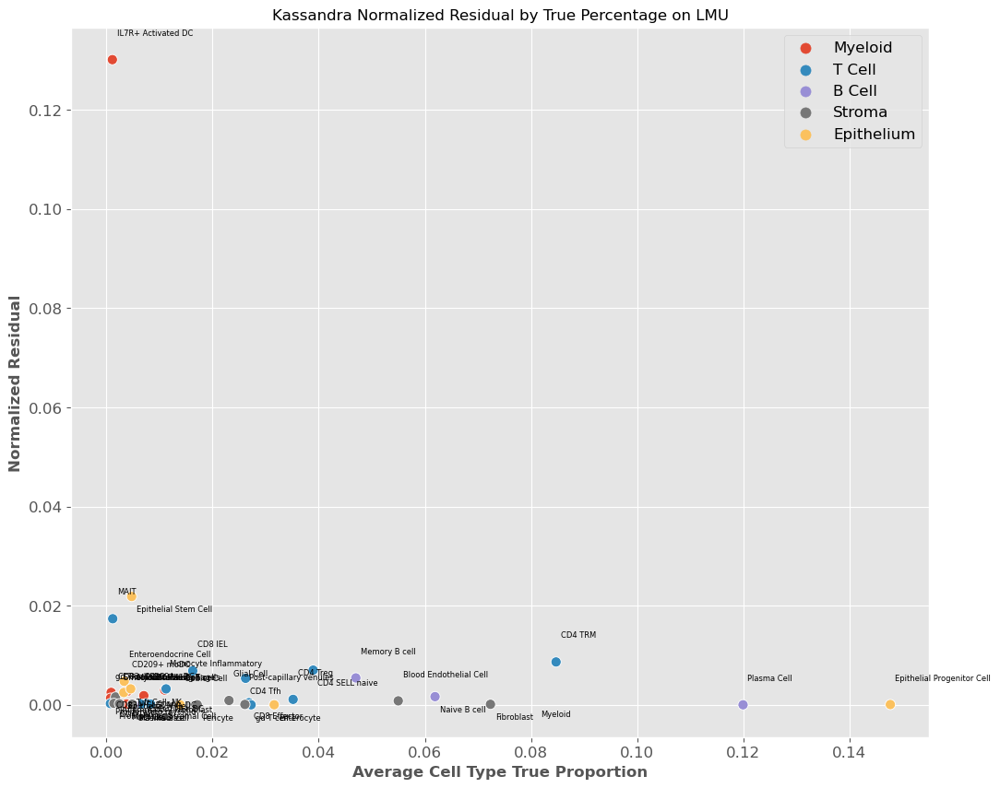

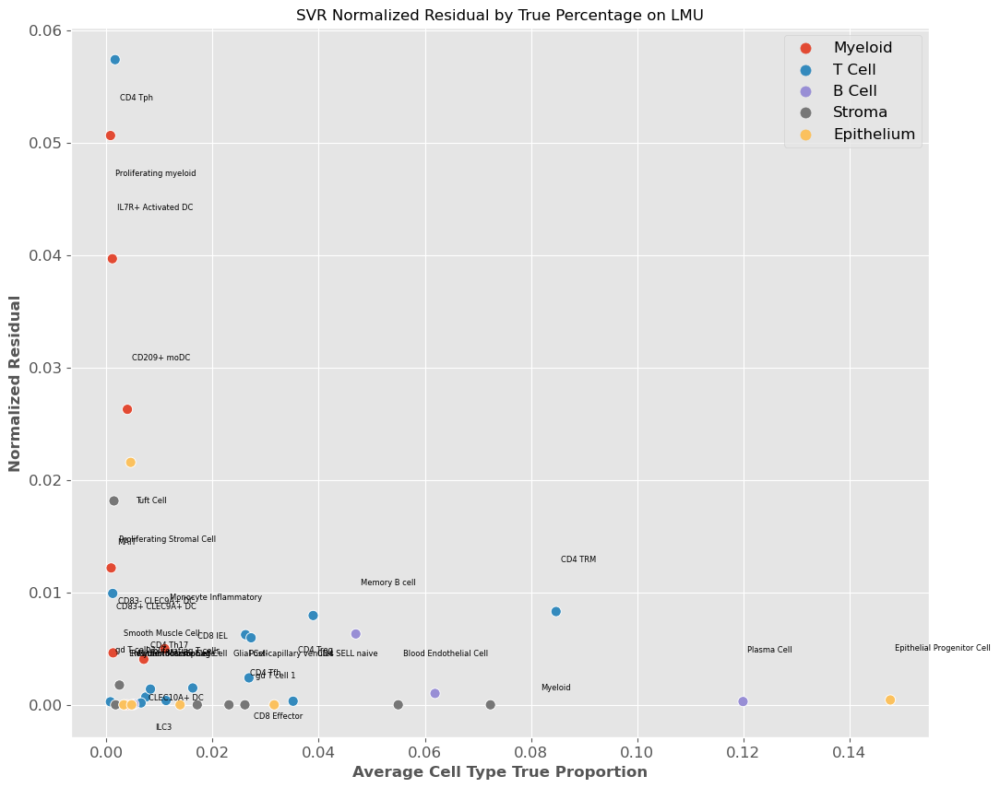

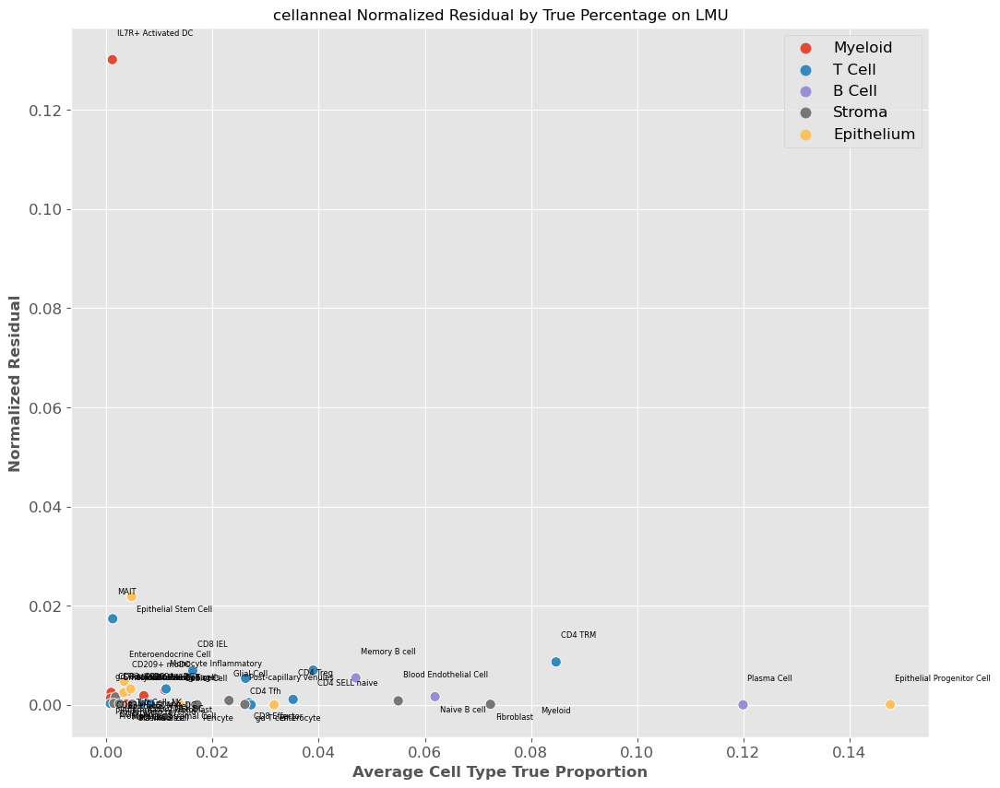

In [62]:
scatter2([a,c,e], [g,h,i], "Normalized Residual by True Percentage on", "Normalized Residual")

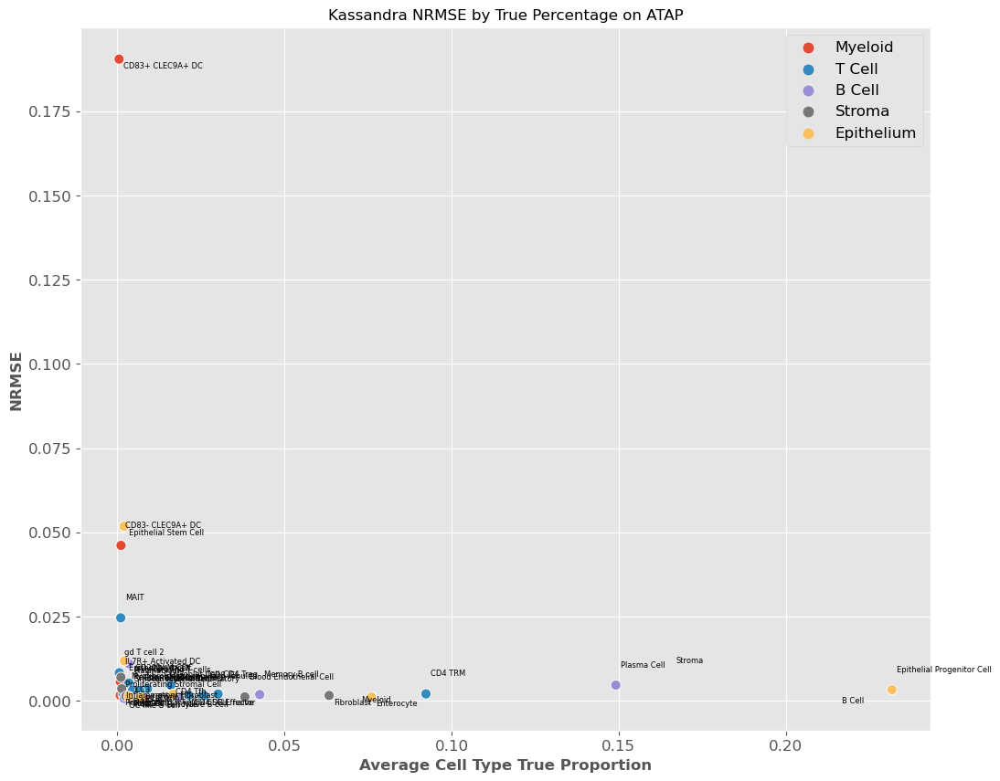

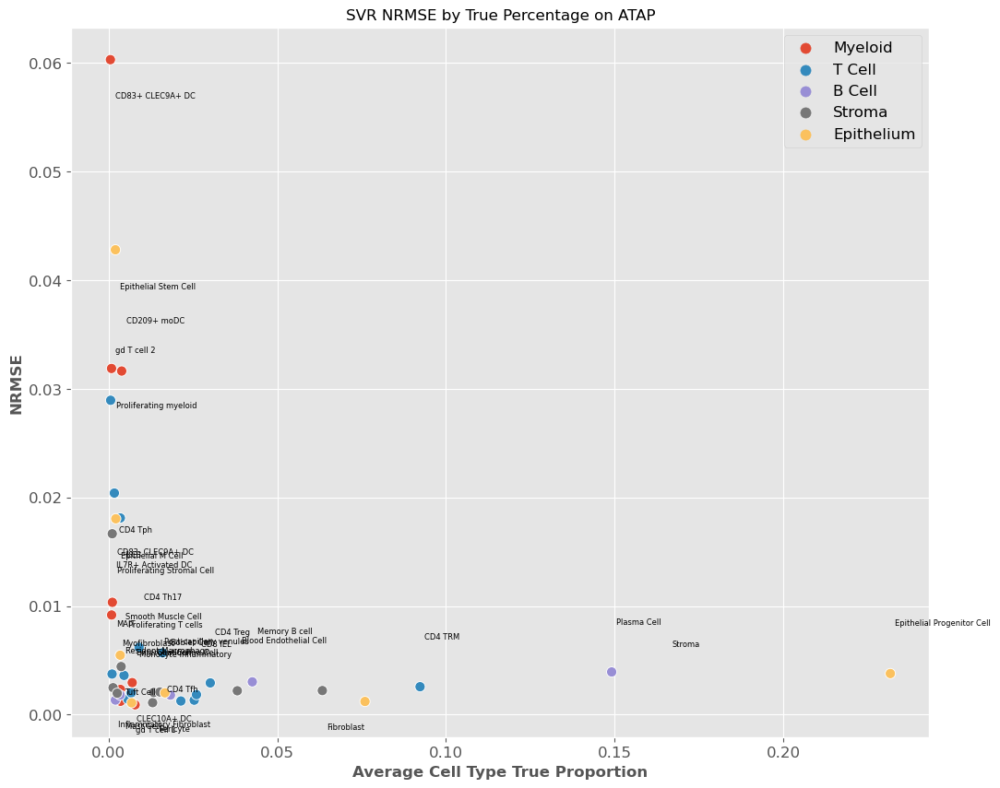

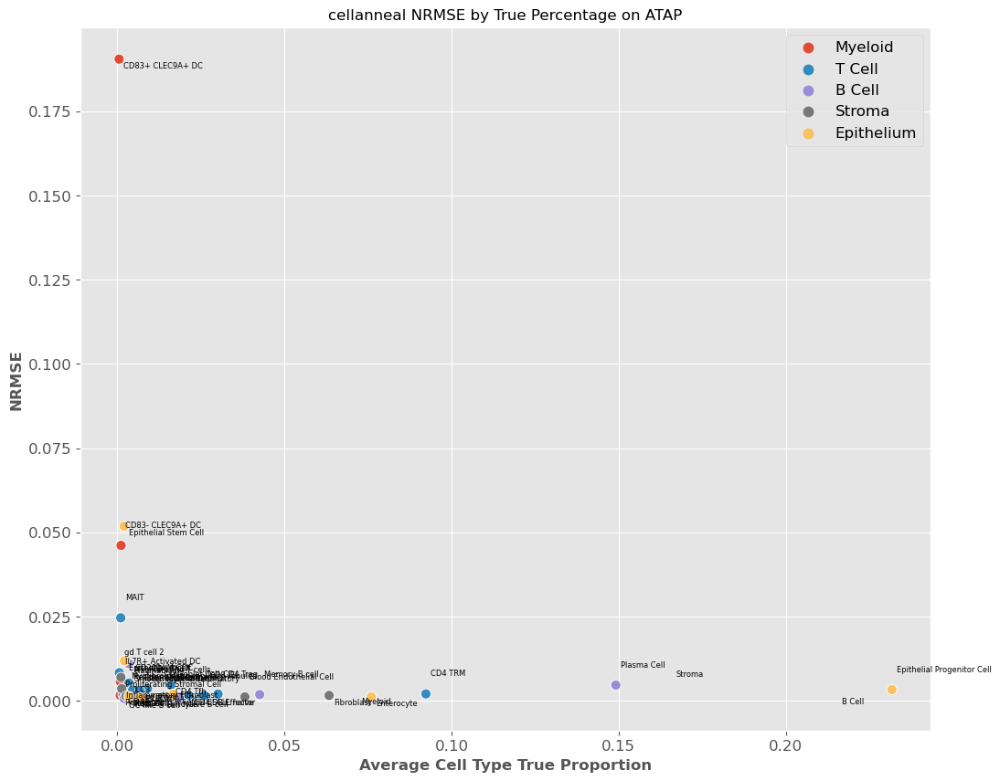

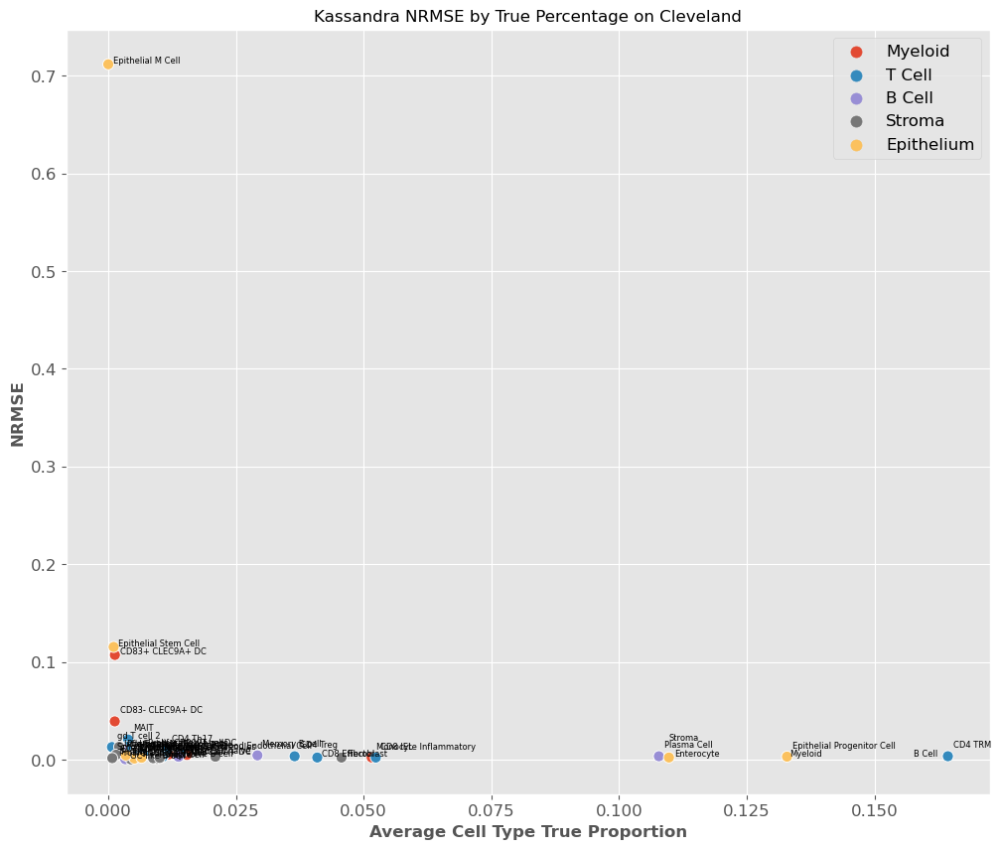

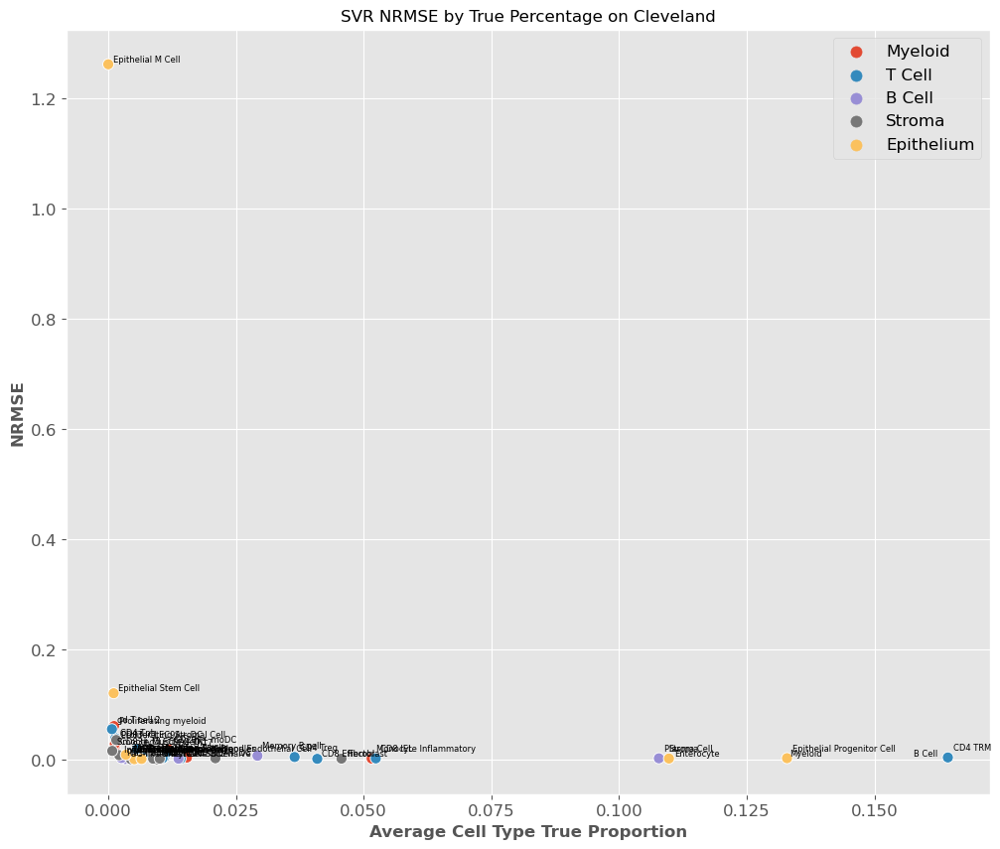

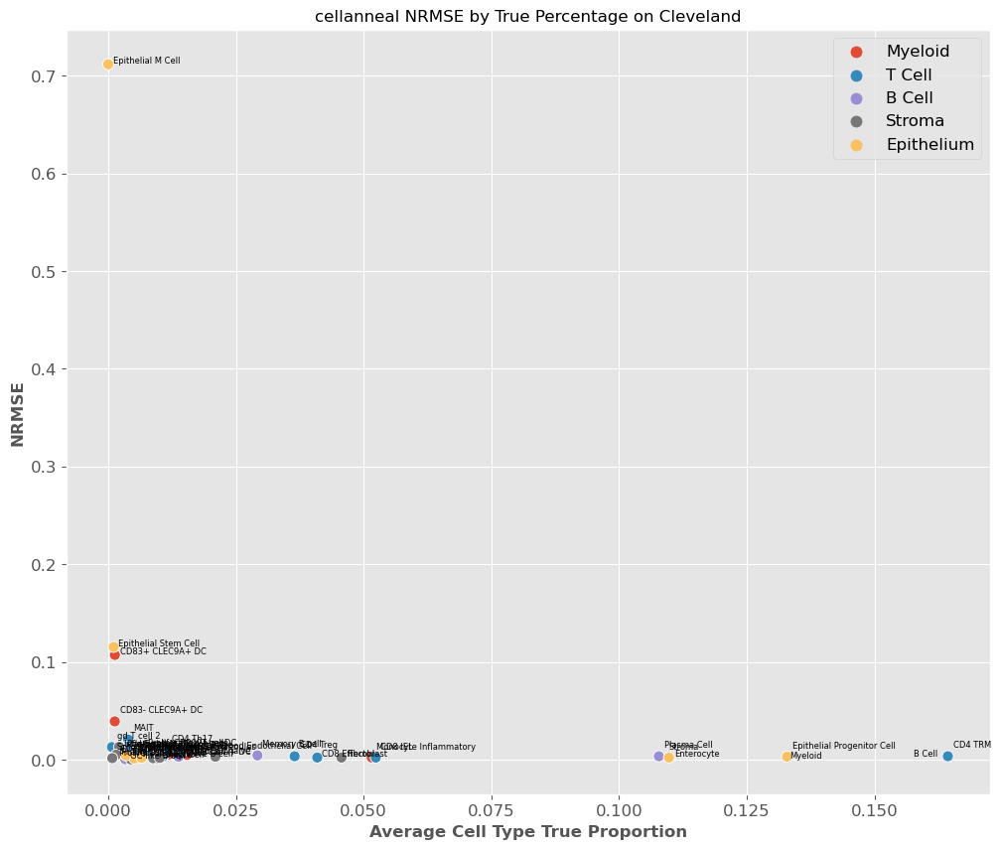

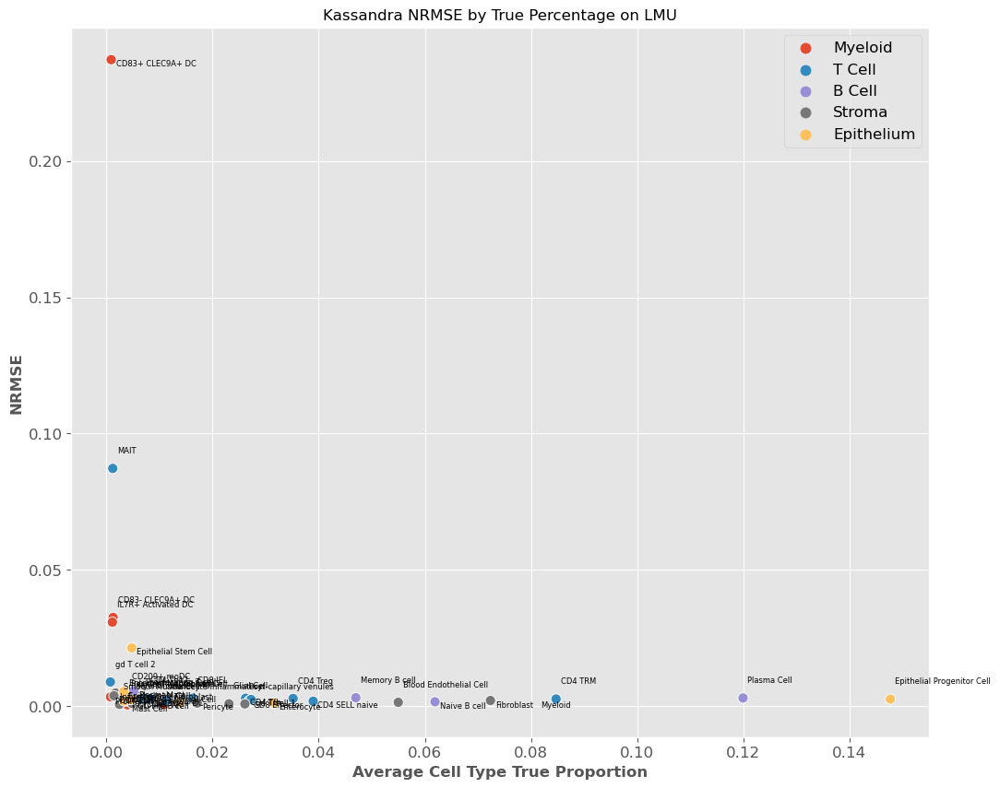

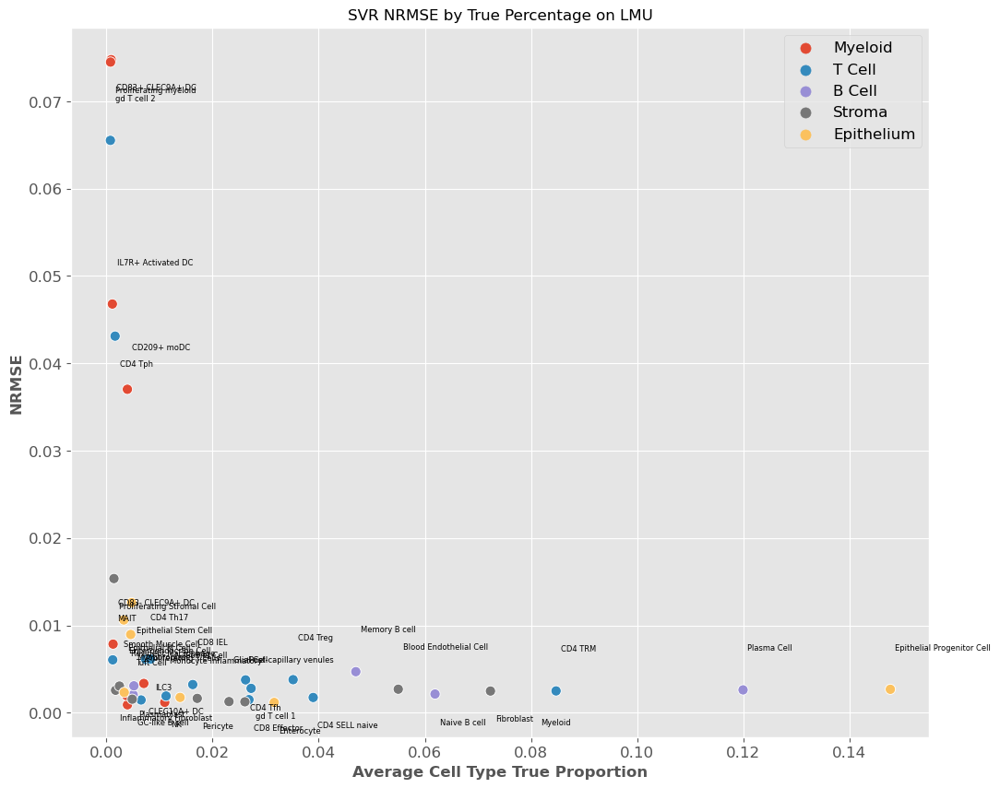

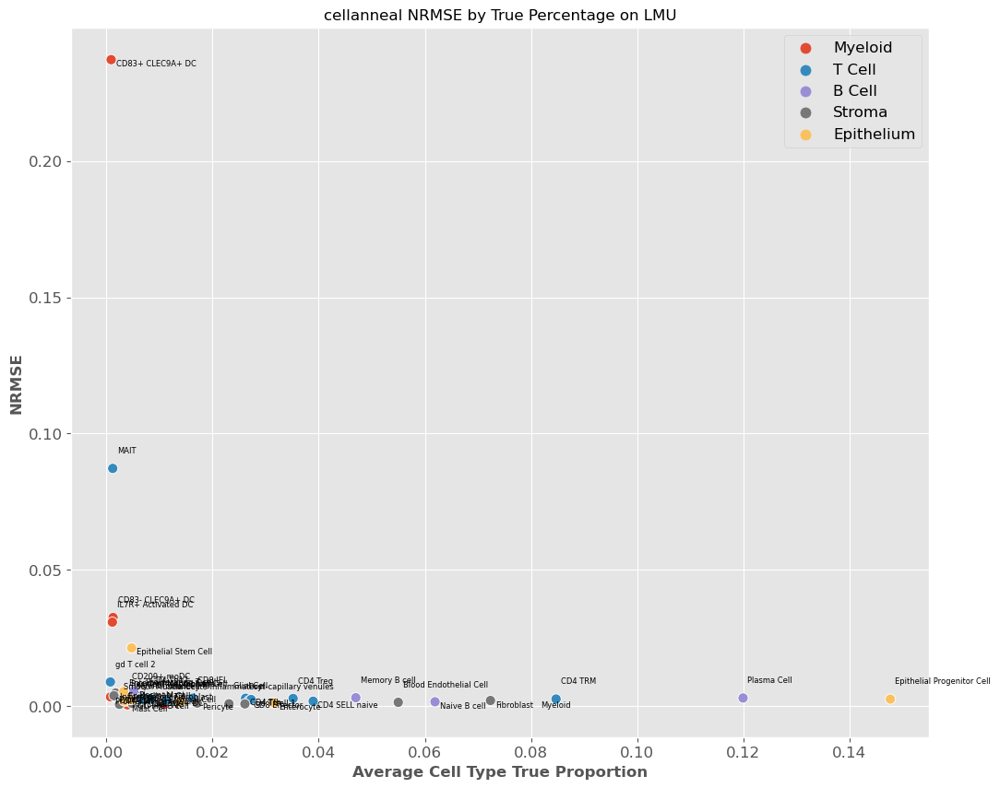

In [63]:
scatter2([b,d,f], [g,h,i], "NRMSE by True Percentage on", "NRMSE")

# Size Experiment

In [21]:
atap_bulk = pd.read_csv('../data/atap.pseudobulk_counts.log_normal.csv',index_col=0).T
atap_true = pd.read_csv('../data/atap.scg_proportions.csv',index_col=0).T
cleveland_bulk = pd.read_csv('../data/cleveland.pseudobulk_counts.log_normal.csv',index_col=0).T
cleveland_true = pd.read_csv('../data/cleveland.scg_proportions.csv',index_col=0).T
lmu_bulk = pd.read_csv('../data/lmu.pseudobulk_counts.log_normal.csv',index_col=0).T
lmu_true = pd.read_csv('../data/lmu.scg_proportions.csv',index_col=0).T

In [22]:
sig20 = pd.read_csv("../data/genesize/compsig_20.csv",index_col=0).T
sig40 = pd.read_csv("../data/genesize/compsig_40.csv",index_col=0).T
sig60 = pd.read_csv("../data/genesize/compsig_60.csv",index_col=0).T
sig80 = pd.read_csv("../data/genesize/compsig_80.csv",index_col=0).T

### cellanneal

27 highly variable genes identified in cell type
        reference.
	27 of these are within thresholds for sample CID003352-2
	24 of these are within thresholds for sample CID003353-1
	26 of these are within thresholds for sample CID003354-1
	25 of these are within thresholds for sample CID003355-1
	27 of these are within thresholds for sample CID003356-1
	25 of these are within thresholds for sample CID003357-1
	25 of these are within thresholds for sample CID003358-1
	26 of these are within thresholds for sample CID003359-1
	27 of these are within thresholds for sample CID003360-1
	27 of these are within thresholds for sample CID003361-1
	27 of these are within thresholds for sample CID003362-1
	27 of these are within thresholds for sample CID003363-1
	27 of these are within thresholds for sample CID003364-1
	27 of these are within thresholds for sample CID003365-1
	25 of these are within thresholds for sample CID003366-1
	27 of these are within thresholds for sample CID003367-2
	27 

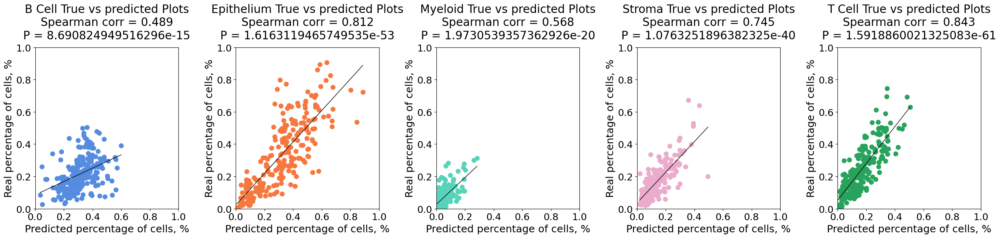

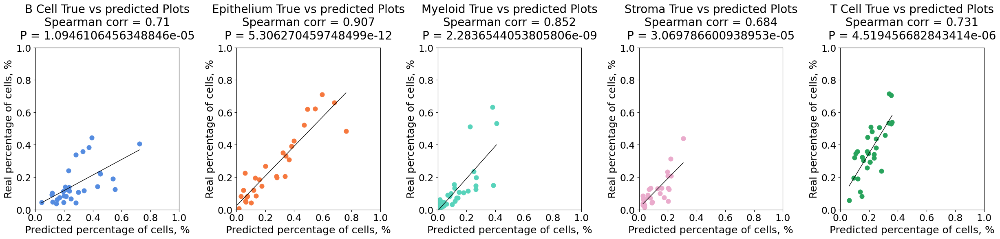

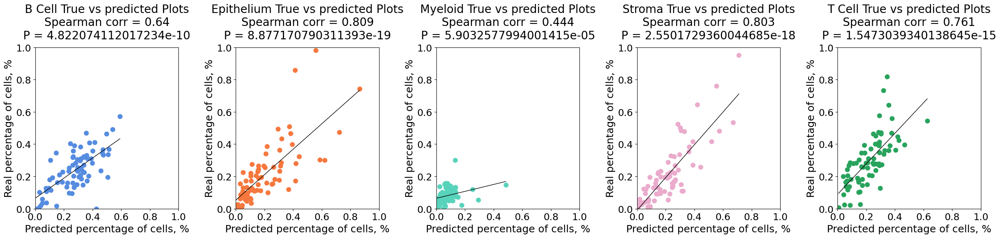

In [14]:
cellanneal_model = cellanneal.make_gene_dictionary(sig20, atap_bulk, disp_min=0.5, bulk_min=1e-5, bulk_max=0.01)
cellanneal_pred = cellanneal.deconvolve(sig20, atap_bulk, maxiter=1000, gene_dict=cellanneal_model)
plot_cell(cellanneal_pred.T, atap_true_general.T, pallete=cells_p)
cellanneal_pred.to_csv("../data/genesize/cellanneal_atap_compartment20.csv")

cellanneal_model = cellanneal.make_gene_dictionary(sig20, cleveland_bulk, disp_min=0.5, bulk_min=1e-5, bulk_max=0.01)
cellanneal_pred = cellanneal.deconvolve(sig20, cleveland_bulk, maxiter=1000, gene_dict=cellanneal_model)
plot_cell(cellanneal_pred.T, cleveland_true_general.T, pallete=cells_p)
cellanneal_pred.to_csv("../data/genesize/cellanneal_cleveland_compartment20.csv")

cellanneal_model = cellanneal.make_gene_dictionary(sig20, lmu_bulk , disp_min=0.5, bulk_min=1e-5, bulk_max=0.01)
cellanneal_pred = cellanneal.deconvolve(sig20, lmu_bulk , maxiter=1000, gene_dict=cellanneal_model)
plot_cell(cellanneal_pred.T, lmu_true_general.T, pallete=cells_p)
cellanneal_pred.to_csv("../data/genesize/cellanneal_lmu_compartment20.csv")

50 highly variable genes identified in cell type
        reference.
	49 of these are within thresholds for sample CID003352-2
	42 of these are within thresholds for sample CID003353-1
	48 of these are within thresholds for sample CID003354-1
	46 of these are within thresholds for sample CID003355-1
	49 of these are within thresholds for sample CID003356-1
	47 of these are within thresholds for sample CID003357-1
	39 of these are within thresholds for sample CID003358-1
	49 of these are within thresholds for sample CID003359-1
	48 of these are within thresholds for sample CID003360-1
	48 of these are within thresholds for sample CID003361-1
	48 of these are within thresholds for sample CID003362-1
	48 of these are within thresholds for sample CID003363-1
	48 of these are within thresholds for sample CID003364-1
	48 of these are within thresholds for sample CID003365-1
	47 of these are within thresholds for sample CID003366-1
	49 of these are within thresholds for sample CID003367-2
	49 

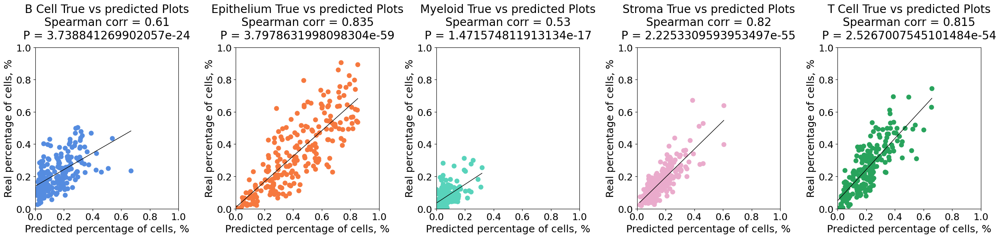

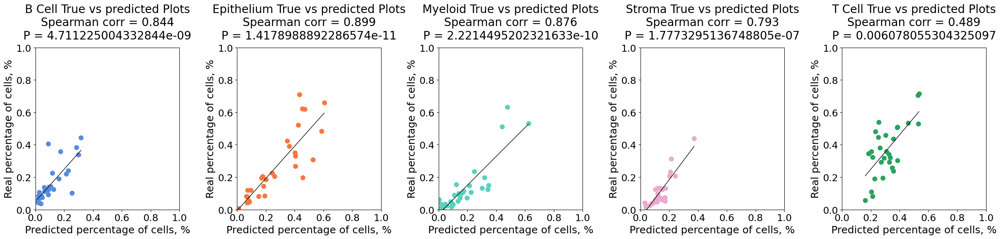

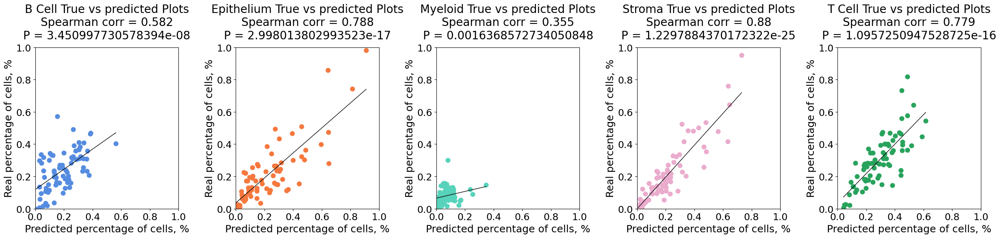

In [15]:
cellanneal_model = cellanneal.make_gene_dictionary(sig40, atap_bulk, disp_min=0.5, bulk_min=1e-5, bulk_max=0.01)
cellanneal_pred = cellanneal.deconvolve(sig40, atap_bulk, maxiter=1000, gene_dict=cellanneal_model)
plot_cell(cellanneal_pred.T, atap_true_general.T, pallete=cells_p)
cellanneal_pred.to_csv("../data/genesize/cellanneal_atap_compartment40.csv")

cellanneal_model = cellanneal.make_gene_dictionary(sig40, cleveland_bulk, disp_min=0.5, bulk_min=1e-5, bulk_max=0.01)
cellanneal_pred = cellanneal.deconvolve(sig40, cleveland_bulk, maxiter=1000, gene_dict=cellanneal_model)
plot_cell(cellanneal_pred.T, cleveland_true_general.T, pallete=cells_p)
cellanneal_pred.to_csv("../data/genesize/cellanneal_cleveland_compartment40.csv")

cellanneal_model = cellanneal.make_gene_dictionary(sig40, lmu_bulk , disp_min=0.5, bulk_min=1e-5, bulk_max=0.01)
cellanneal_pred = cellanneal.deconvolve(sig40, lmu_bulk , maxiter=1000, gene_dict=cellanneal_model)
plot_cell(cellanneal_pred.T, lmu_true_general.T, pallete=cells_p)
cellanneal_pred.to_csv("../data/genesize/cellanneal_lmu_compartment40.csv")

68 highly variable genes identified in cell type
        reference.
	68 of these are within thresholds for sample CID003352-2
	60 of these are within thresholds for sample CID003353-1
	67 of these are within thresholds for sample CID003354-1
	62 of these are within thresholds for sample CID003355-1
	68 of these are within thresholds for sample CID003356-1
	63 of these are within thresholds for sample CID003357-1
	57 of these are within thresholds for sample CID003358-1
	65 of these are within thresholds for sample CID003359-1
	66 of these are within thresholds for sample CID003360-1
	67 of these are within thresholds for sample CID003361-1
	66 of these are within thresholds for sample CID003362-1
	67 of these are within thresholds for sample CID003363-1
	67 of these are within thresholds for sample CID003364-1
	66 of these are within thresholds for sample CID003365-1
	66 of these are within thresholds for sample CID003366-1
	68 of these are within thresholds for sample CID003367-2
	68 

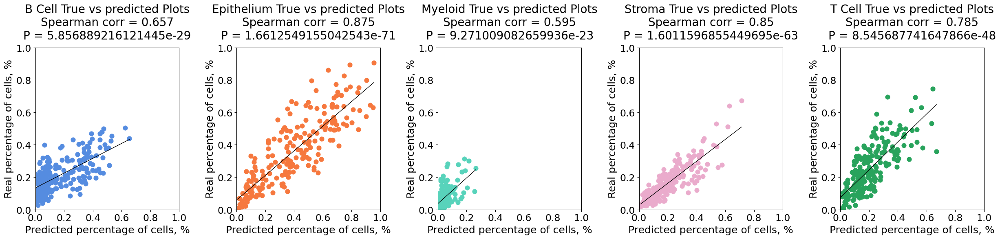

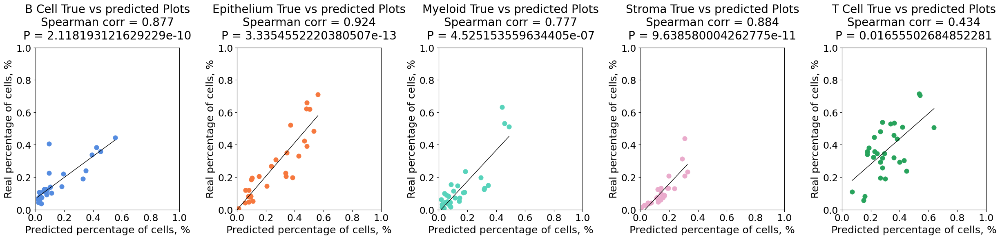

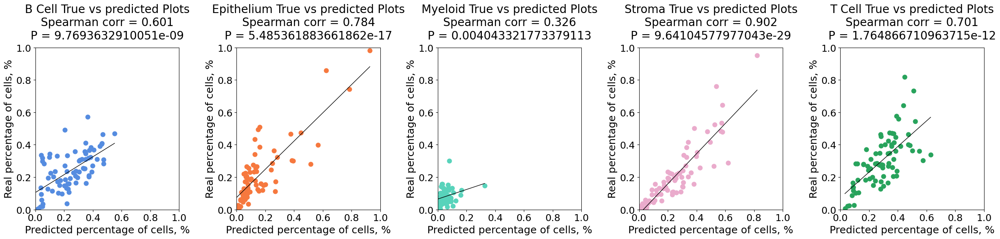

In [16]:
cellanneal_model = cellanneal.make_gene_dictionary(sig60, atap_bulk, disp_min=0.5, bulk_min=1e-5, bulk_max=0.01)
cellanneal_pred = cellanneal.deconvolve(sig60, atap_bulk, maxiter=1000, gene_dict=cellanneal_model)
plot_cell(cellanneal_pred.T, atap_true_general.T, pallete=cells_p)
cellanneal_pred.to_csv("../data/genesize/cellanneal_atap_compartment60.csv")

cellanneal_model = cellanneal.make_gene_dictionary(sig60, cleveland_bulk, disp_min=0.5, bulk_min=1e-5, bulk_max=0.01)
cellanneal_pred = cellanneal.deconvolve(sig60, cleveland_bulk, maxiter=1000, gene_dict=cellanneal_model)
plot_cell(cellanneal_pred.T, cleveland_true_general.T, pallete=cells_p)
cellanneal_pred.to_csv("../data/genesize/cellanneal_cleveland_compartment60.csv")

cellanneal_model = cellanneal.make_gene_dictionary(sig60, lmu_bulk , disp_min=0.5, bulk_min=1e-5, bulk_max=0.01)
cellanneal_pred = cellanneal.deconvolve(sig60, lmu_bulk , maxiter=1000, gene_dict=cellanneal_model)
plot_cell(cellanneal_pred.T, lmu_true_general.T, pallete=cells_p)
cellanneal_pred.to_csv("../data/genesize/cellanneal_lmu_compartment60.csv")

86 highly variable genes identified in cell type
        reference.
	86 of these are within thresholds for sample CID003352-2
	78 of these are within thresholds for sample CID003353-1
	85 of these are within thresholds for sample CID003354-1
	80 of these are within thresholds for sample CID003355-1
	86 of these are within thresholds for sample CID003356-1
	81 of these are within thresholds for sample CID003357-1
	72 of these are within thresholds for sample CID003358-1
	83 of these are within thresholds for sample CID003359-1
	84 of these are within thresholds for sample CID003360-1
	85 of these are within thresholds for sample CID003361-1
	83 of these are within thresholds for sample CID003362-1
	85 of these are within thresholds for sample CID003363-1
	84 of these are within thresholds for sample CID003364-1
	84 of these are within thresholds for sample CID003365-1
	84 of these are within thresholds for sample CID003366-1
	86 of these are within thresholds for sample CID003367-2
	86 

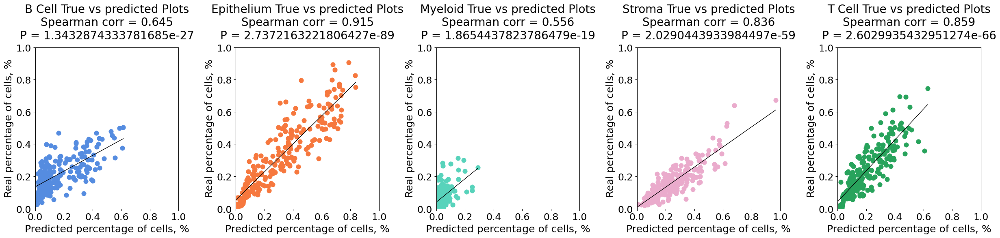

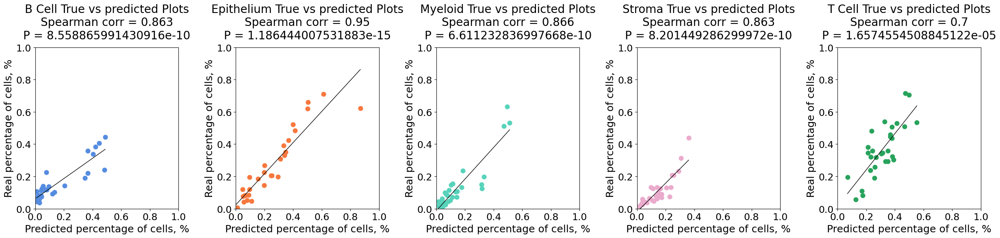

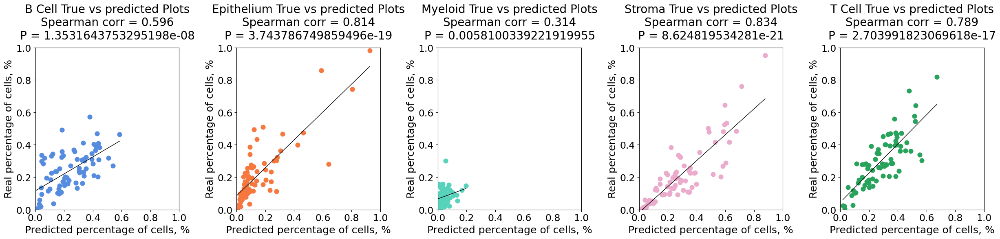

In [24]:
cellanneal_model = cellanneal.make_gene_dictionary(sig80, atap_bulk, disp_min=0.5, bulk_min=1e-5, bulk_max=0.01)
cellanneal_pred = cellanneal.deconvolve(sig80, atap_bulk, maxiter=1000, gene_dict=cellanneal_model)
plot_cell(cellanneal_pred.T, atap_true_general.T, pallete=cells_p)
cellanneal_pred.to_csv("../data/genesize/cellanneal_atap_compartment80.csv")

cellanneal_model = cellanneal.make_gene_dictionary(sig80, cleveland_bulk, disp_min=0.5, bulk_min=1e-5, bulk_max=0.01)
cellanneal_pred = cellanneal.deconvolve(sig80, cleveland_bulk, maxiter=1000, gene_dict=cellanneal_model)
plot_cell(cellanneal_pred.T, cleveland_true_general.T, pallete=cells_p)
cellanneal_pred.to_csv("../data/genesize/cellanneal_cleveland_compartment80.csv")

cellanneal_model = cellanneal.make_gene_dictionary(sig80, lmu_bulk , disp_min=0.5, bulk_min=1e-5, bulk_max=0.01)
cellanneal_pred = cellanneal.deconvolve(sig80, lmu_bulk , maxiter=1000, gene_dict=cellanneal_model)
plot_cell(cellanneal_pred.T, lmu_true_general.T, pallete=cells_p)
cellanneal_pred.to_csv("../data/genesize/cellanneal_lmu_compartment80.csv")

### SVR

In [32]:
# Compartment Level SVR
atap_bulk = pd.read_csv('../data/atap.pseudobulk_counts.log_normal.csv',index_col=0).T
signature = pd.read_csv("../data/genesize/compsig_20.csv",index_col=0).T
training_data = atap_bulk


set1 = set(training_data.index)
set2 = set(signature.index)
intersection = set1.intersection(set2)
inter = list(intersection)

signature = signature.filter(items=inter, axis=0)
training_data = training_data.filter(items=inter, axis=0)

# transform data
ind = training_data.columns

train = signature.to_numpy()
test_data = training_data.to_numpy()
Nus = [0.25, 0.5, 0.75]

SVRcoef1 = np.zeros((signature.shape[1], training_data.shape[1]))
Selcoef1 = np.zeros((training_data.shape[0], training_data.shape[1]))

for i in tqdm(range(training_data.shape[1])):
    sols = [NuSVR(kernel="linear", nu=nu).fit(train, test_data[:, i]) for nu in Nus]
    im_name = signature.columns
    RMSE = [mse(sol.predict(train), test_data[:, i]) for sol in sols]
    Selcoef1[sols[np.argmin(RMSE)].support_, i] = 1
    SVRcoef1[:, i] = np.maximum(sols[np.argmin(RMSE)].coef_, 0)
    SVRcoef1[:, i] = SVRcoef1[:, i] / np.sum(SVRcoef1[:, i])
svr_1 = pd.DataFrame(SVRcoef1, index=im_name, columns=ind)
svr_1 = svr_1.reindex(sorted(svr_1.columns), axis=1)
display(svr_1)
plot_cell(svr_1, atap_true_general.T, pallete=cells_p)
svr_1.to_csv("../data/genesize/svr_atap_compartment20.csv")

###############

# Compartment Level SVR
atap_bulk = pd.read_csv('../data/cleveland.pseudobulk_counts.log_normal.csv',index_col=0).T
signature = pd.read_csv("../data/genesize/compsig_20.csv",index_col=0).T
training_data = atap_bulk


set1 = set(training_data.index)
set2 = set(signature.index)
intersection = set1.intersection(set2)
inter = list(intersection)
print(len(inter))

signature = signature.filter(items=inter, axis=0)
training_data = training_data.filter(items=inter, axis=0)

# transform data
ind = training_data.columns

train = signature.to_numpy()
test_data = training_data.to_numpy()
Nus = [0.25, 0.5, 0.75]

SVRcoef1 = np.zeros((signature.shape[1], training_data.shape[1]))
Selcoef1 = np.zeros((training_data.shape[0], training_data.shape[1]))

for i in tqdm(range(training_data.shape[1])):
    sols = [NuSVR(kernel="linear", nu=nu).fit(train, test_data[:, i]) for nu in Nus]
    im_name = signature.columns
    RMSE = [mse(sol.predict(train), test_data[:, i]) for sol in sols]
    Selcoef1[sols[np.argmin(RMSE)].support_, i] = 1
    SVRcoef1[:, i] = np.maximum(sols[np.argmin(RMSE)].coef_, 0)
    SVRcoef1[:, i] = SVRcoef1[:, i] / np.sum(SVRcoef1[:, i])
svr_1 = pd.DataFrame(SVRcoef1, index=im_name, columns=ind)
svr_1 = svr_1.reindex(sorted(svr_1.columns), axis=1)
plot_cell(svr_1, cleveland_true_general.T, pallete=cells_p)
svr_1.to_csv("../data/genesize/svr_cleveland_compartment20.csv")

###############

# Compartment Level SVR
atap_bulk = pd.read_csv('../data/lmu.pseudobulk_counts.log_normal.csv',index_col=0).T
signature = pd.read_csv("../data/genesize/compsig_20.csv",index_col=0).T
training_data = atap_bulk


set1 = set(training_data.index)
set2 = set(signature.index)
intersection = set1.intersection(set2)
inter = list(intersection)

signature = signature.filter(items=inter, axis=0)
training_data = training_data.filter(items=inter, axis=0)

# transform data
ind = training_data.columns

train = signature.to_numpy()
test_data = training_data.to_numpy()
Nus = [0.25, 0.5, 0.75]

SVRcoef1 = np.zeros((signature.shape[1], training_data.shape[1]))
Selcoef1 = np.zeros((training_data.shape[0], training_data.shape[1]))

for i in tqdm(range(training_data.shape[1])):
    sols = [NuSVR(kernel="linear", nu=nu).fit(train, test_data[:, i]) for nu in Nus]
    im_name = signature.columns
    RMSE = [mse(sol.predict(train), test_data[:, i]) for sol in sols]
    Selcoef1[sols[np.argmin(RMSE)].support_, i] = 1
    SVRcoef1[:, i] = np.maximum(sols[np.argmin(RMSE)].coef_, 0)
    SVRcoef1[:, i] = SVRcoef1[:, i] / np.sum(SVRcoef1[:, i])
svr_1 = pd.DataFrame(SVRcoef1, index=im_name, columns=ind)
svr_1 = svr_1.reindex(sorted(svr_1.columns), axis=1)
plot_cell(svr_1, lmu_true_general.T, pallete=cells_p)
svr_1.to_csv("../data/genesize/svr_lmu_compartment20.csv")

100%|██████████| 223/223 [00:01<00:00, 131.53it/s]


,CID003352-2,CID003353-1,CID003354-1,CID003355-1,CID003356-1,CID003357-1,CID003358-1,CID003359-1,CID003360-1,CID003361-1,...,CID006575-1,CID006576-1,CID006577-1,CID006578-1,CID006579-1,CID006580-1,CID006581-1,CID006582-1,CID006583-1,CID006584-1
B Cell,0.205508,0.218595,0.211159,0.291868,0.225672,0.292560,0.225362,0.203493,0.223686,0.236969,...,0.162560,0.242467,0.289653,0.203460,0.257688,0.168602,0.272616,0.284112,0.213822,0.202985
Epithelium,0.162194,0.495444,0.377547,0.245983,0.224498,0.211965,0.383727,0.295398,0.186654,0.232099,...,0.169381,0.195781,0.072436,0.000000,0.101721,0.051536,0.053158,0.180932,0.146848,0.232473
Myeloid,0.106809,0.000000,0.000000,0.000000,0.000000,0.002595,0.000000,0.000000,0.042203,0.000000,...,0.186734,0.082627,0.000000,0.157387,0.000000,0.318188,0.000000,0.000000,0.000000,0.000000
Stroma,0.288862,0.027400,0.174044,0.065666,0.191451,0.198655,0.122468,0.242484,0.217236,0.262434,...,0.163215,0.145932,0.330179,0.337163,0.336933,0.126550,0.189027,0.228480,0.296025,0.218607
T Cell,0.236628,0.258561,0.237250,0.396483,0.358379,0.294224,0.268444,0.258626,0.330221,0.268498,...,0.318109,0.333194,0.307732,0.301990,0.303658,0.335124,0.485199,0.306476,0.343305,0.345935


NameError: name 'num_rows' is not defined

In [19]:
# Compartment Level SVR
atap_bulk = pd.read_csv('../data/atap.pseudobulk_counts.log_normal.csv',index_col=0).T
signature = pd.read_csv("../data/genesize/compsig_40.csv",index_col=0).T
training_data = atap_bulk


set1 = set(training_data.index)
set2 = set(signature.index)
intersection = set1.intersection(set2)
inter = list(intersection)

signature = signature.filter(items=inter, axis=0)
training_data = training_data.filter(items=inter, axis=0)

# transform data
ind = training_data.columns

train = signature.to_numpy()
test_data = training_data.to_numpy()
Nus = [0.25, 0.5, 0.75]

SVRcoef1 = np.zeros((signature.shape[1], training_data.shape[1]))
Selcoef1 = np.zeros((training_data.shape[0], training_data.shape[1]))

for i in tqdm(range(training_data.shape[1])):
    sols = [NuSVR(kernel="linear", nu=nu).fit(train, test_data[:, i]) for nu in Nus]
    im_name = signature.columns
    RMSE = [mse(sol.predict(train), test_data[:, i]) for sol in sols]
    Selcoef1[sols[np.argmin(RMSE)].support_, i] = 1
    SVRcoef1[:, i] = np.maximum(sols[np.argmin(RMSE)].coef_, 0)
    SVRcoef1[:, i] = SVRcoef1[:, i] / np.sum(SVRcoef1[:, i])
svr_1 = pd.DataFrame(SVRcoef1, index=im_name, columns=ind)
svr_1 = svr_1.reindex(sorted(svr_1.columns), axis=1)
plot_cell(svr_1.T, atap_true_general.T, pallete=cells_p)
svr_1.to_csv("../data/genesize/svr_atap_compartment40.csv")

###############

# Compartment Level SVR
atap_bulk = pd.read_csv('../data/cleveland.pseudobulk_counts.log_normal.csv',index_col=0).T
signature = pd.read_csv("../data/genesize/compsig_40.csv",index_col=0).T
training_data = atap_bulk


set1 = set(training_data.index)
set2 = set(signature.index)
intersection = set1.intersection(set2)
inter = list(intersection)
print(len(inter))

signature = signature.filter(items=inter, axis=0)
training_data = training_data.filter(items=inter, axis=0)

# transform data
ind = training_data.columns

train = signature.to_numpy()
test_data = training_data.to_numpy()
Nus = [0.25, 0.5, 0.75]

SVRcoef1 = np.zeros((signature.shape[1], training_data.shape[1]))
Selcoef1 = np.zeros((training_data.shape[0], training_data.shape[1]))

for i in tqdm(range(training_data.shape[1])):
    sols = [NuSVR(kernel="linear", nu=nu).fit(train, test_data[:, i]) for nu in Nus]
    im_name = signature.columns
    RMSE = [mse(sol.predict(train), test_data[:, i]) for sol in sols]
    Selcoef1[sols[np.argmin(RMSE)].support_, i] = 1
    SVRcoef1[:, i] = np.maximum(sols[np.argmin(RMSE)].coef_, 0)
    SVRcoef1[:, i] = SVRcoef1[:, i] / np.sum(SVRcoef1[:, i])
svr_1 = pd.DataFrame(SVRcoef1, index=im_name, columns=ind)
svr_1 = svr_1.reindex(sorted(svr_1.columns), axis=1)
plot_cell(svr_1.T, cleveland_true_general.T, pallete=cells_p)
svr_1.to_csv("../data/genesize/svr_cleveland_compartment40.csv")

###############

# Compartment Level SVR
atap_bulk = pd.read_csv('../data/lmu.pseudobulk_counts.log_normal.csv',index_col=0).T
signature = pd.read_csv("../data/genesize/compsig_40.csv",index_col=0).T
training_data = atap_bulk


set1 = set(training_data.index)
set2 = set(signature.index)
intersection = set1.intersection(set2)
inter = list(intersection)

signature = signature.filter(items=inter, axis=0)
training_data = training_data.filter(items=inter, axis=0)

# transform data
ind = training_data.columns

train = signature.to_numpy()
test_data = training_data.to_numpy()
Nus = [0.25, 0.5, 0.75]

SVRcoef1 = np.zeros((signature.shape[1], training_data.shape[1]))
Selcoef1 = np.zeros((training_data.shape[0], training_data.shape[1]))

for i in tqdm(range(training_data.shape[1])):
    sols = [NuSVR(kernel="linear", nu=nu).fit(train, test_data[:, i]) for nu in Nus]
    im_name = signature.columns
    RMSE = [mse(sol.predict(train), test_data[:, i]) for sol in sols]
    Selcoef1[sols[np.argmin(RMSE)].support_, i] = 1
    SVRcoef1[:, i] = np.maximum(sols[np.argmin(RMSE)].coef_, 0)
    SVRcoef1[:, i] = SVRcoef1[:, i] / np.sum(SVRcoef1[:, i])
svr_1 = pd.DataFrame(SVRcoef1, index=im_name, columns=ind)
svr_1 = svr_1.reindex(sorted(svr_1.columns), axis=1)
plot_cell(svr_1.T, lmu_true_general.T, pallete=cells_p)
svr_1.to_csv("../data/genesize/svr_lmu_compartment40.csv")

100%|██████████| 223/223 [00:03<00:00, 65.09it/s]


ZeroDivisionError: division by zero

In [ ]:
# Compartment Level SVR
atap_bulk = pd.read_csv('../data/atap.pseudobulk_counts.log_normal.csv',index_col=0).T
signature = pd.read_csv("../data/genesize/compsig_60.csv",index_col=0).T
training_data = atap_bulk


set1 = set(training_data.index)
set2 = set(signature.index)
intersection = set1.intersection(set2)
inter = list(intersection)

signature = signature.filter(items=inter, axis=0)
training_data = training_data.filter(items=inter, axis=0)

# transform data
ind = training_data.columns

train = signature.to_numpy()
test_data = training_data.to_numpy()
Nus = [0.25, 0.5, 0.75]

SVRcoef1 = np.zeros((signature.shape[1], training_data.shape[1]))
Selcoef1 = np.zeros((training_data.shape[0], training_data.shape[1]))

for i in tqdm(range(training_data.shape[1])):
    sols = [NuSVR(kernel="linear", nu=nu).fit(train, test_data[:, i]) for nu in Nus]
    im_name = signature.columns
    RMSE = [mse(sol.predict(train), test_data[:, i]) for sol in sols]
    Selcoef1[sols[np.argmin(RMSE)].support_, i] = 1
    SVRcoef1[:, i] = np.maximum(sols[np.argmin(RMSE)].coef_, 0)
    SVRcoef1[:, i] = SVRcoef1[:, i] / np.sum(SVRcoef1[:, i])
svr_1 = pd.DataFrame(SVRcoef1, index=im_name, columns=ind)
svr_1 = svr_1.reindex(sorted(svr_1.columns), axis=1)
plot_cell(svr_1.T, atap_true_general.T, pallete=cells_p)
svr_1.to_csv("../data/genesize/svr_atap_compartment60.csv")

###############

# Compartment Level SVR
atap_bulk = pd.read_csv('../data/cleveland.pseudobulk_counts.log_normal.csv',index_col=0).T
signature = pd.read_csv("../data/genesize/compsig_60.csv",index_col=0).T
training_data = atap_bulk


set1 = set(training_data.index)
set2 = set(signature.index)
intersection = set1.intersection(set2)
inter = list(intersection)
print(len(inter))

signature = signature.filter(items=inter, axis=0)
training_data = training_data.filter(items=inter, axis=0)

# transform data
ind = training_data.columns

train = signature.to_numpy()
test_data = training_data.to_numpy()
Nus = [0.25, 0.5, 0.75]

SVRcoef1 = np.zeros((signature.shape[1], training_data.shape[1]))
Selcoef1 = np.zeros((training_data.shape[0], training_data.shape[1]))

for i in tqdm(range(training_data.shape[1])):
    sols = [NuSVR(kernel="linear", nu=nu).fit(train, test_data[:, i]) for nu in Nus]
    im_name = signature.columns
    RMSE = [mse(sol.predict(train), test_data[:, i]) for sol in sols]
    Selcoef1[sols[np.argmin(RMSE)].support_, i] = 1
    SVRcoef1[:, i] = np.maximum(sols[np.argmin(RMSE)].coef_, 0)
    SVRcoef1[:, i] = SVRcoef1[:, i] / np.sum(SVRcoef1[:, i])
svr_1 = pd.DataFrame(SVRcoef1, index=im_name, columns=ind)
svr_1 = svr_1.reindex(sorted(svr_1.columns), axis=1)
plot_cell(svr_1.T, cleveland_true_general.T, pallete=cells_p)
svr_1.to_csv("../data/genesize/svr_cleveland_compartment60.csv")

###############

# Compartment Level SVR
atap_bulk = pd.read_csv('../data/lmu.pseudobulk_counts.log_normal.csv',index_col=0).T
signature = pd.read_csv("../data/genesize/compsig_60.csv",index_col=0).T
training_data = atap_bulk


set1 = set(training_data.index)
set2 = set(signature.index)
intersection = set1.intersection(set2)
inter = list(intersection)

signature = signature.filter(items=inter, axis=0)
training_data = training_data.filter(items=inter, axis=0)

# transform data
ind = training_data.columns

train = signature.to_numpy()
test_data = training_data.to_numpy()
Nus = [0.25, 0.5, 0.75]

SVRcoef1 = np.zeros((signature.shape[1], training_data.shape[1]))
Selcoef1 = np.zeros((training_data.shape[0], training_data.shape[1]))

for i in tqdm(range(training_data.shape[1])):
    sols = [NuSVR(kernel="linear", nu=nu).fit(train, test_data[:, i]) for nu in Nus]
    im_name = signature.columns
    RMSE = [mse(sol.predict(train), test_data[:, i]) for sol in sols]
    Selcoef1[sols[np.argmin(RMSE)].support_, i] = 1
    SVRcoef1[:, i] = np.maximum(sols[np.argmin(RMSE)].coef_, 0)
    SVRcoef1[:, i] = SVRcoef1[:, i] / np.sum(SVRcoef1[:, i])
svr_1 = pd.DataFrame(SVRcoef1, index=im_name, columns=ind)
svr_1 = svr_1.reindex(sorted(svr_1.columns), axis=1)
plot_cell(svr_1.T, lmu_true_general.T, pallete=cells_p)
svr_1.to_csv("../data/genesize/svr_lmu_compartment60.csv")

100%|██████████| 223/223 [00:05<00:00, 43.42it/s]


158


100%|██████████| 76/76 [00:01<00:00, 44.09it/s]


In [ ]:
# Compartment Level SVR
atap_bulk = pd.read_csv('../data/atap.pseudobulk_counts.log_normal.csv',index_col=0).T
signature = pd.read_csv("../data/genesize/compsig_80.csv",index_col=0).T
training_data = atap_bulk


set1 = set(training_data.index)
set2 = set(signature.index)
intersection = set1.intersection(set2)
inter = list(intersection)

signature = signature.filter(items=inter, axis=0)
training_data = training_data.filter(items=inter, axis=0)

# transform data
ind = training_data.columns

train = signature.to_numpy()
test_data = training_data.to_numpy()
Nus = [0.25, 0.5, 0.75]

SVRcoef1 = np.zeros((signature.shape[1], training_data.shape[1]))
Selcoef1 = np.zeros((training_data.shape[0], training_data.shape[1]))

for i in tqdm(range(training_data.shape[1])):
    sols = [NuSVR(kernel="linear", nu=nu).fit(train, test_data[:, i]) for nu in Nus]
    im_name = signature.columns
    RMSE = [mse(sol.predict(train), test_data[:, i]) for sol in sols]
    Selcoef1[sols[np.argmin(RMSE)].support_, i] = 1
    SVRcoef1[:, i] = np.maximum(sols[np.argmin(RMSE)].coef_, 0)
    SVRcoef1[:, i] = SVRcoef1[:, i] / np.sum(SVRcoef1[:, i])
svr_1 = pd.DataFrame(SVRcoef1, index=im_name, columns=ind)
svr_1 = svr_1.reindex(sorted(svr_1.columns), axis=1)
plot_cell(svr_1.T, atap_true_general.T, pallete=cells_p)
svr_1.to_csv("../data/genesize/svr_atap_compartment80.csv")

###############

# Compartment Level SVR
atap_bulk = pd.read_csv('../data/cleveland.pseudobulk_counts.log_normal.csv',index_col=0).T
signature = pd.read_csv("../data/genesize/compsig_80.csv",index_col=0).T
training_data = atap_bulk


set1 = set(training_data.index)
set2 = set(signature.index)
intersection = set1.intersection(set2)
inter = list(intersection)
print(len(inter))

signature = signature.filter(items=inter, axis=0)
training_data = training_data.filter(items=inter, axis=0)

# transform data
ind = training_data.columns

train = signature.to_numpy()
test_data = training_data.to_numpy()
Nus = [0.25, 0.5, 0.75]

SVRcoef1 = np.zeros((signature.shape[1], training_data.shape[1]))
Selcoef1 = np.zeros((training_data.shape[0], training_data.shape[1]))

for i in tqdm(range(training_data.shape[1])):
    sols = [NuSVR(kernel="linear", nu=nu).fit(train, test_data[:, i]) for nu in Nus]
    im_name = signature.columns
    RMSE = [mse(sol.predict(train), test_data[:, i]) for sol in sols]
    Selcoef1[sols[np.argmin(RMSE)].support_, i] = 1
    SVRcoef1[:, i] = np.maximum(sols[np.argmin(RMSE)].coef_, 0)
    SVRcoef1[:, i] = SVRcoef1[:, i] / np.sum(SVRcoef1[:, i])
svr_1 = pd.DataFrame(SVRcoef1, index=im_name, columns=ind)
svr_1 = svr_1.reindex(sorted(svr_1.columns), axis=1)
plot_cell(svr_1.T, cleveland_true_general.T, pallete=cells_p)
svr_1.to_csv("../data/genesize/svr_cleveland_compartment80.csv")

###############

# Compartment Level SVR
atap_bulk = pd.read_csv('../data/lmu.pseudobulk_counts.log_normal.csv',index_col=0).T
signature = pd.read_csv("../data/genesize/compsig_80.csv",index_col=0).T
training_data = atap_bulk


set1 = set(training_data.index)
set2 = set(signature.index)
intersection = set1.intersection(set2)
inter = list(intersection)

signature = signature.filter(items=inter, axis=0)
training_data = training_data.filter(items=inter, axis=0)

# transform data
ind = training_data.columns

train = signature.to_numpy()
test_data = training_data.to_numpy()
Nus = [0.25, 0.5, 0.75]

SVRcoef1 = np.zeros((signature.shape[1], training_data.shape[1]))
Selcoef1 = np.zeros((training_data.shape[0], training_data.shape[1]))

for i in tqdm(range(training_data.shape[1])):
    sols = [NuSVR(kernel="linear", nu=nu).fit(train, test_data[:, i]) for nu in Nus]
    im_name = signature.columns
    RMSE = [mse(sol.predict(train), test_data[:, i]) for sol in sols]
    Selcoef1[sols[np.argmin(RMSE)].support_, i] = 1
    SVRcoef1[:, i] = np.maximum(sols[np.argmin(RMSE)].coef_, 0)
    SVRcoef1[:, i] = SVRcoef1[:, i] / np.sum(SVRcoef1[:, i])
svr_1 = pd.DataFrame(SVRcoef1, index=im_name, columns=ind)
svr_1 = svr_1.reindex(sorted(svr_1.columns), axis=1)
plot_cell(svr_1.T, lmu_true_general.T, pallete=cells_p)
svr_1.to_csv("../data/genesize/svr_lmu_compartment80.csv")

100%|██████████| 223/223 [00:08<00:00, 26.81it/s]


200


100%|██████████| 76/76 [00:02<00:00, 27.46it/s]


1
5
1
5
1
5
1
5
1
5
1
5
1
5
1
5
1
5
1
5
1
5
1
5


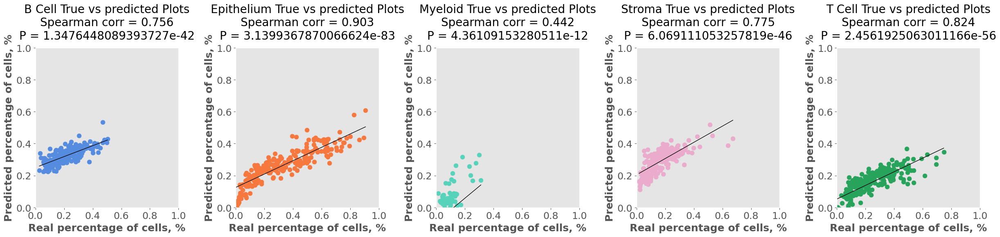

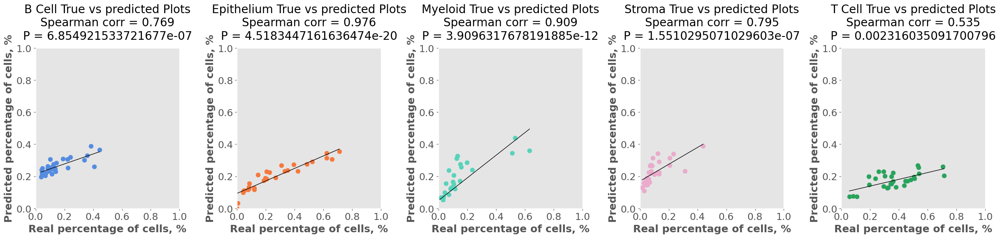

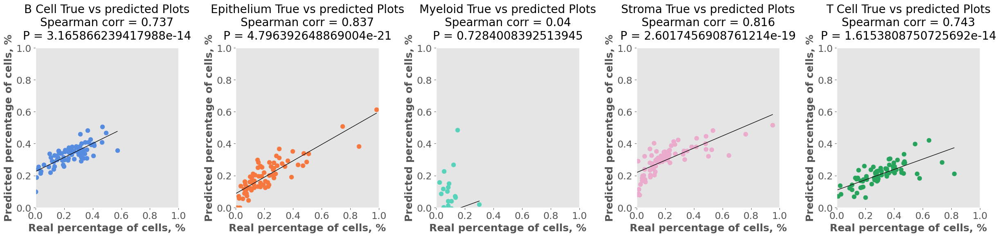

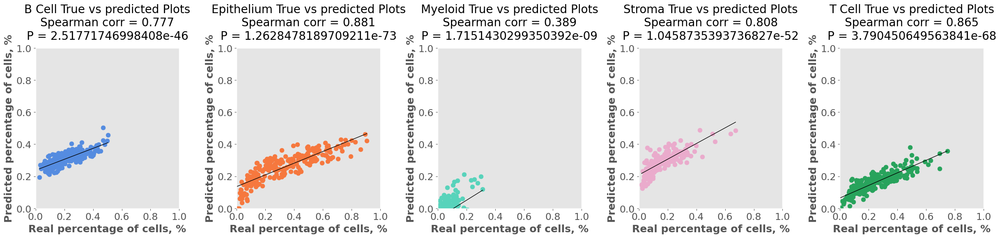

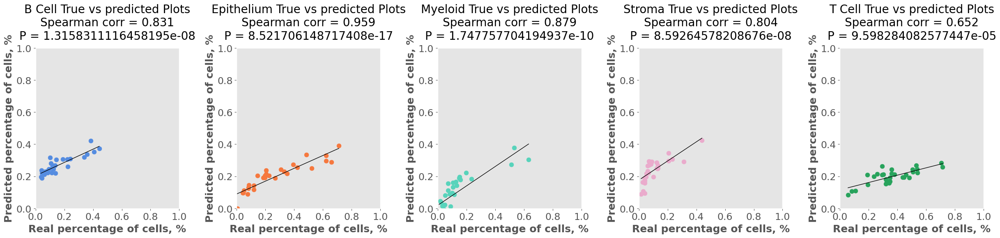

...

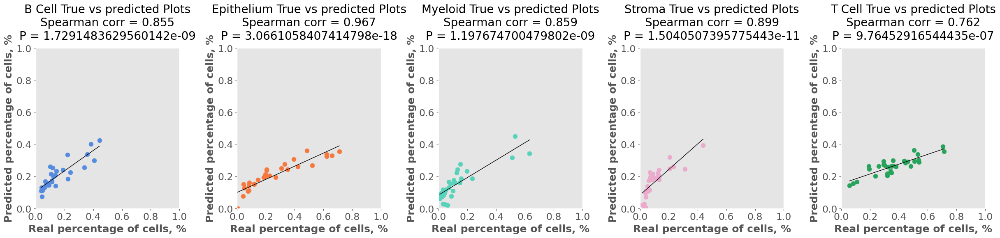

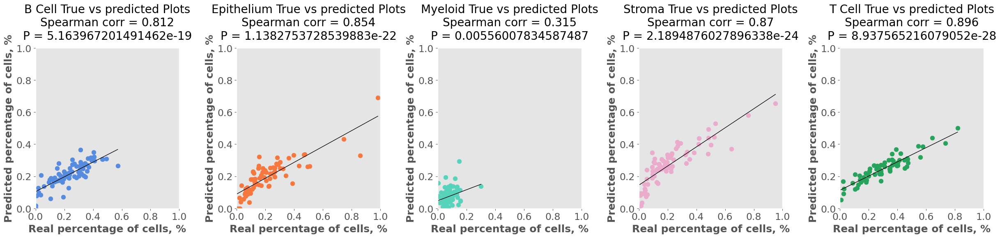

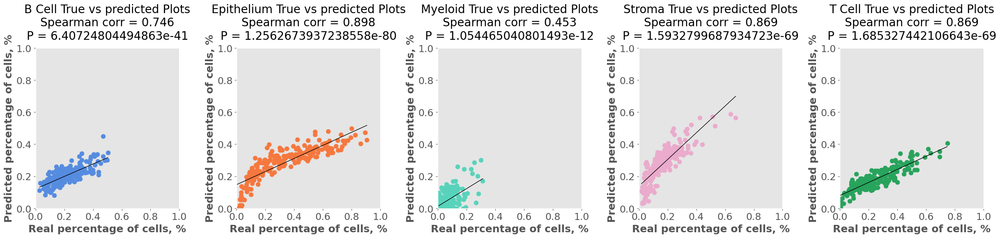

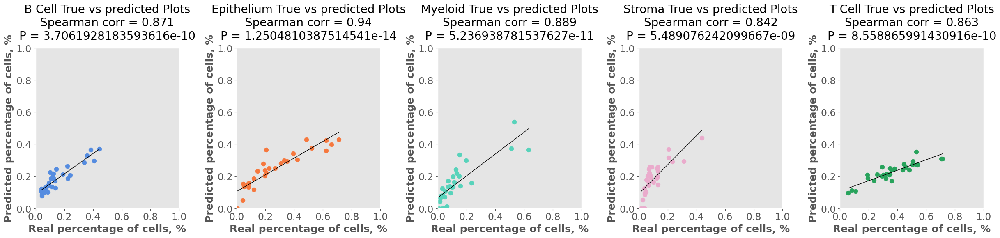

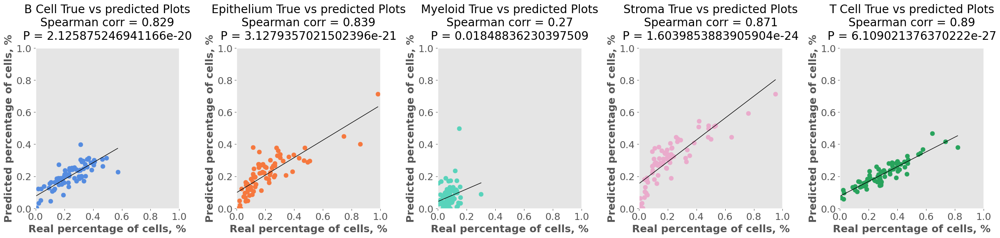

In [75]:
for i in ["20","40","60","80"]:
    svr_1 = pd.read_csv("../data/genesize/svr_atap_compartment"+i+".csv",index_col = 0).T
    svr_2 = pd.read_csv("../data/genesize/svr_cleveland_compartment"+i+".csv",index_col = 0).T
    svr_3 = pd.read_csv("../data/genesize/svr_lmu_compartment"+i+".csv",index_col = 0).T
    plot_cell(svr_1.T, atap_true_general.T, pallete=cells_p)
    plot_cell(svr_2.T, cleveland_true_general.T, pallete=cells_p)
    plot_cell(svr_3.T, lmu_true_general.T, pallete=cells_p)

1
5
1
5
1
5
1
5
1
5
1
5
1
5
1
5
1
5
1
5
1
5
1
5


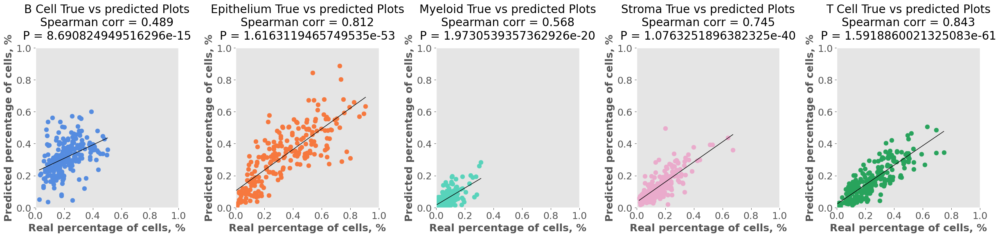

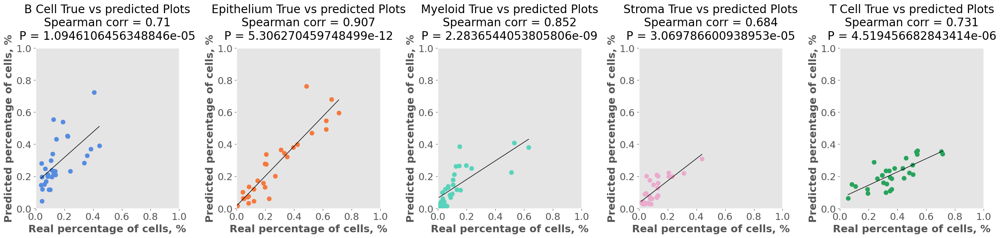

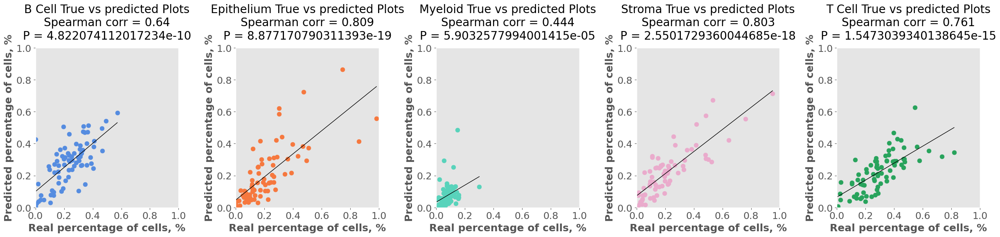

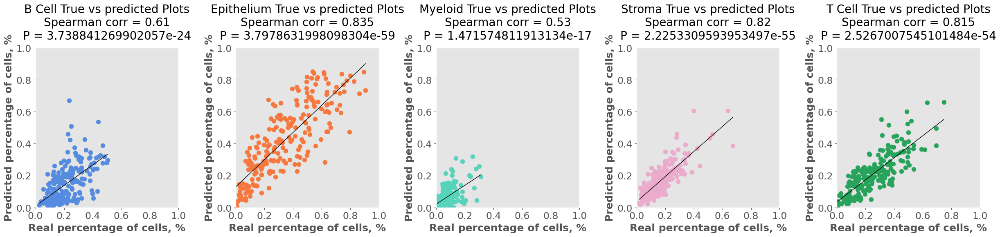

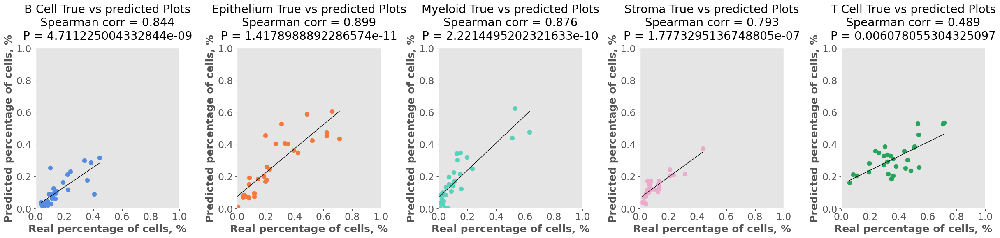

...

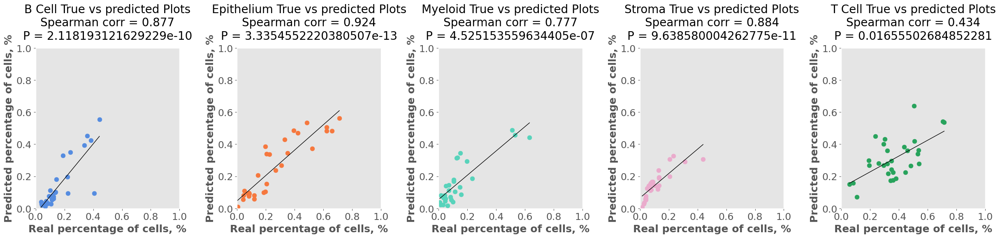

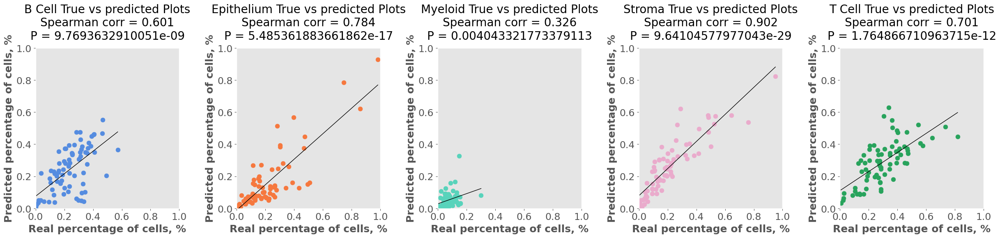

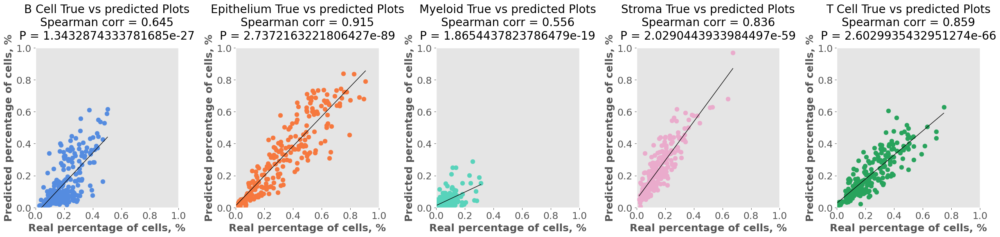

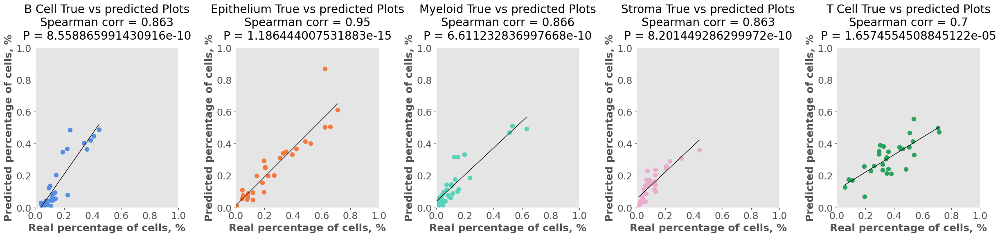

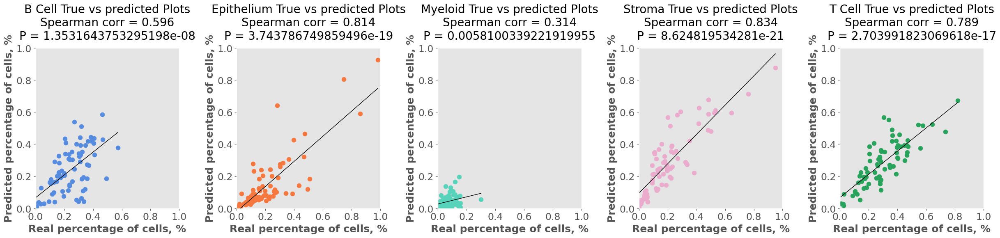

In [78]:
for i in ["20","40","60","80"]:
    svr_1 = pd.read_csv("../data/genesize/cellanneal_atap_compartment"+i+".csv",index_col = 0).T
    svr_2 = pd.read_csv("../data/genesize/cellanneal_cleveland_compartment"+i+".csv",index_col = 0).T
    svr_3 = pd.read_csv("../data/genesize/cellanneal_lmu_compartment"+i+".csv",index_col = 0).T
    plot_cell(svr_1, atap_true_general.T, pallete=cells_p)
    plot_cell(svr_2, cleveland_true_general.T, pallete=cells_p)
    plot_cell(svr_3, lmu_true_general.T, pallete=cells_p)

In [79]:
df_atap = pd.DataFrame()
df_cleveland = pd.DataFrame()
df_lmu = pd.DataFrame()


for i in ["20","40","60","80"]:
    svr_1 = pd.read_csv("../data/genesize/svr_atap_compartment"+i+".csv",index_col = 0).T
    svr_2 = pd.read_csv("../data/genesize/svr_cleveland_compartment"+i+".csv",index_col = 0).T
    svr_3 = pd.read_csv("../data/genesize/svr_lmu_compartment"+i+".csv",index_col = 0).T
    c1 = pd.read_csv("../data/genesize/cellanneal_atap_compartment"+i+".csv",index_col = 0).T
    c2 = pd.read_csv("../data/genesize/cellanneal_cleveland_compartment"+i+".csv",index_col = 0).T
    c3 = pd.read_csv("../data/genesize/cellanneal_lmu_compartment"+i+".csv",index_col = 0).T
    print("Seperator")
    a1 = stat_generator([svr_1.T, c1, svr_1.T],atap_true_general.T, statistic = 'pearson')
    print("Seperator")
    a2 = stat_generator([svr_2.T, c2, svr_2.T],cleveland_true_general.T, statistic = 'pearson')
    print("Seperator")
    a3 = stat_generator([svr_3.T, c3, svr_3.T],lmu_true_general.T, statistic = 'pearson')
    a1["top_n_genes"] = int(i)
    a2["top_n_genes"] = int(i)
    a3["top_n_genes"] = int(i)

    df_atap = pd.concat([df_atap, a1])
    df_cleveland = pd.concat([df_cleveland, a2])
    df_lmu = pd.concat([df_lmu, a3])

display(df_atap)
display(df_cleveland)
display(df_lmu)

Seperator
(5, 223)
(5, 223)
(5, 223)
(5, 223)
(5, 223)
(5, 223)
Seperator
(5, 30)
(5, 30)
(5, 30)
(5, 30)
(5, 30)
(5, 30)
Seperator
(5, 76)
(5, 76)
(5, 76)
(5, 76)
(5, 76)
(5, 76)
Seperator
(5, 223)
(5, 223)
(5, 223)
(5, 223)
(5, 223)
(5, 223)
Seperator
(5, 30)
(5, 30)
(5, 30)
(5, 30)
(5, 30)
(5, 30)
Seperator
(5, 76)
(5, 76)
(5, 76)
(5, 76)
(5, 76)
(5, 76)
Seperator
(5, 223)
(5, 223)
(5, 223)
(5, 223)
(5, 223)
(5, 223)
Seperator
(5, 30)
(5, 30)
(5, 30)
(5, 30)
(5, 30)
(5, 30)
Seperator
(5, 76)
(5, 76)
(5, 76)
(5, 76)
(5, 76)
(5, 76)
Seperator
(5, 223)
(5, 223)
(5, 223)
(5, 223)
(5, 223)
(5, 223)
Seperator
(5, 30)
(5, 30)
(5, 30)
(5, 30)
(5, 30)
(5, 30)
Seperator
(5, 76)
(5, 76)
(5, 76)
(5, 76)
(5, 76)
(5, 76)


,Kassandra,cellanneal,SVR,top_n_genes
B Cell,0.756272,0.488684,0.756272,20
Epithelium,0.903409,0.811699,0.903409,20
Myeloid,0.442099,0.567784,0.442099,20
Stroma,0.775044,0.744781,0.775044,20
T Cell,0.823572,0.843314,0.823572,20
B Cell,0.777078,0.610371,0.777078,40
Epithelium,0.880603,0.834588,0.880603,40
Myeloid,0.389462,0.530106,0.389462,40
Stroma,0.808118,0.819637,0.808118,40
T Cell,0.865075,0.815184,0.865075,40


,Kassandra,cellanneal,SVR,top_n_genes
B Cell,0.769077,0.710345,0.769077,20
Epithelium,0.975973,0.906563,0.975973,20
Myeloid,0.908666,0.852280,0.908666,20
Stroma,0.794883,0.684093,0.794883,20
T Cell,0.535039,0.730812,0.535039,20
B Cell,0.830923,0.843826,0.830923,40
Epithelium,0.958505,0.899444,0.958505,40
Myeloid,0.878532,0.876307,0.878532,40
Stroma,0.804227,0.792659,0.804227,40
T Cell,0.651613,0.489210,0.651613,40


,Kassandra,cellanneal,SVR,top_n_genes
B Cell,0.737080,0.640027,0.737080,20
Epithelium,0.836809,0.809397,0.836809,20
Myeloid,0.040487,0.443910,0.040487,20
Stroma,0.816274,0.803254,0.816274,20
T Cell,0.742584,0.760738,0.742584,20
B Cell,0.808577,0.582228,0.808577,40
Epithelium,0.797244,0.788016,0.797244,40
Myeloid,0.127962,0.355270,0.127962,40
Stroma,0.777936,0.880027,0.777936,40
T Cell,0.889515,0.779467,0.889515,40


# Plot Spearman Rank Correlations

In [80]:
def lineplot(df, dataset):
        colors = ['#e24a33','#348abd','#988ed5']
        df = df.reset_index()

        sns.lineplot(data=df, x="top_n_genes", y="SVR", hue="index",markers=True)
        sns.scatterplot(data=df, x="top_n_genes", y="SVR", hue="index",legend=False)
        plt.ylim(0, 1.0)
        plt.title("SVR: "+dataset+" Spearman Correlation Plot")
        plt.ylabel("Spearman Correlation")
        plt.xlabel("Gene Signature Length")
        plt.show()

        sns.lineplot(data=df, x="top_n_genes", y="cellanneal", hue="index",markers=True)
        sns.scatterplot(data=df, x="top_n_genes", y="cellanneal", hue="index", legend=False)
        plt.title("Cellanneal "+dataset+" Spearman Correlation Plot")
        plt.ylabel("Spearman Correlation")
        plt.xlabel("Gene Signature Length")
        plt.ylim(0, 1.0)
        plt.show()


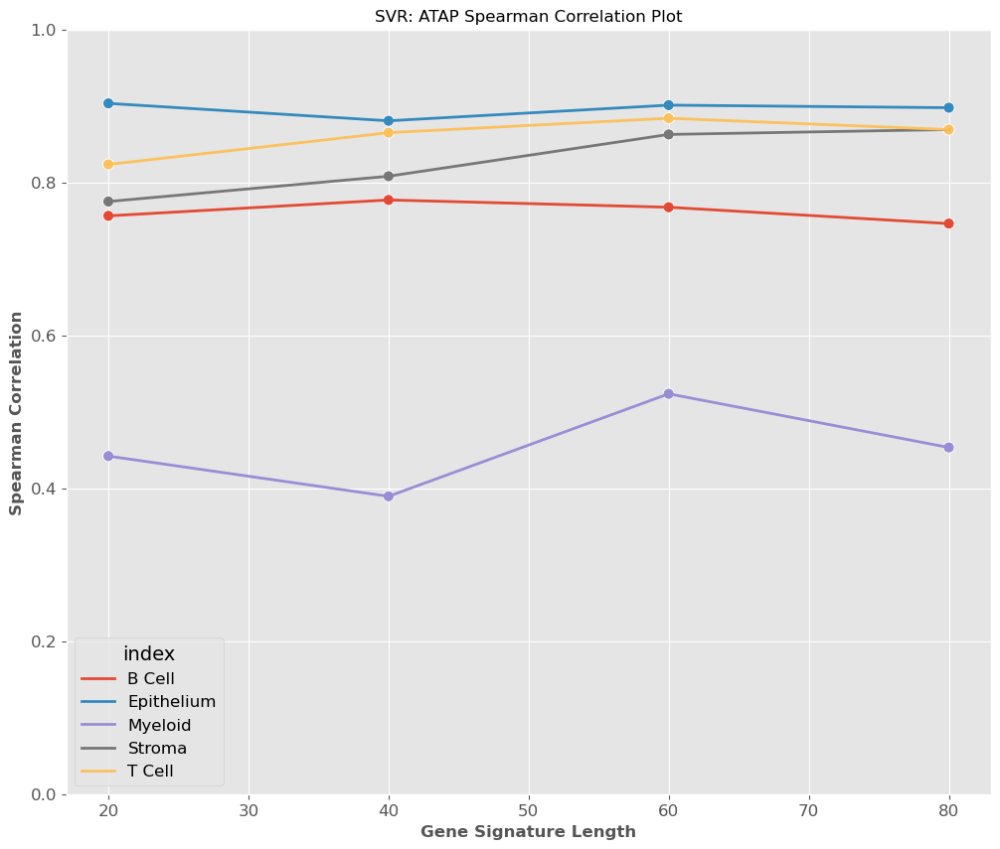

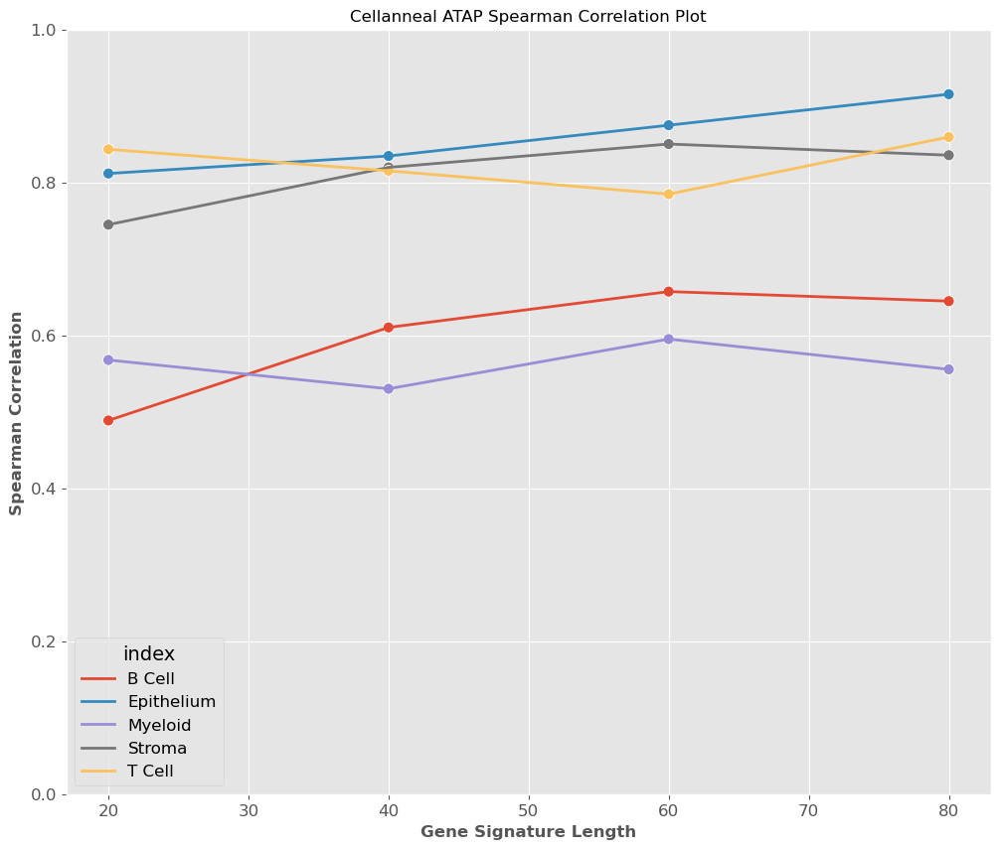

In [81]:
lineplot(df_atap, "ATAP")

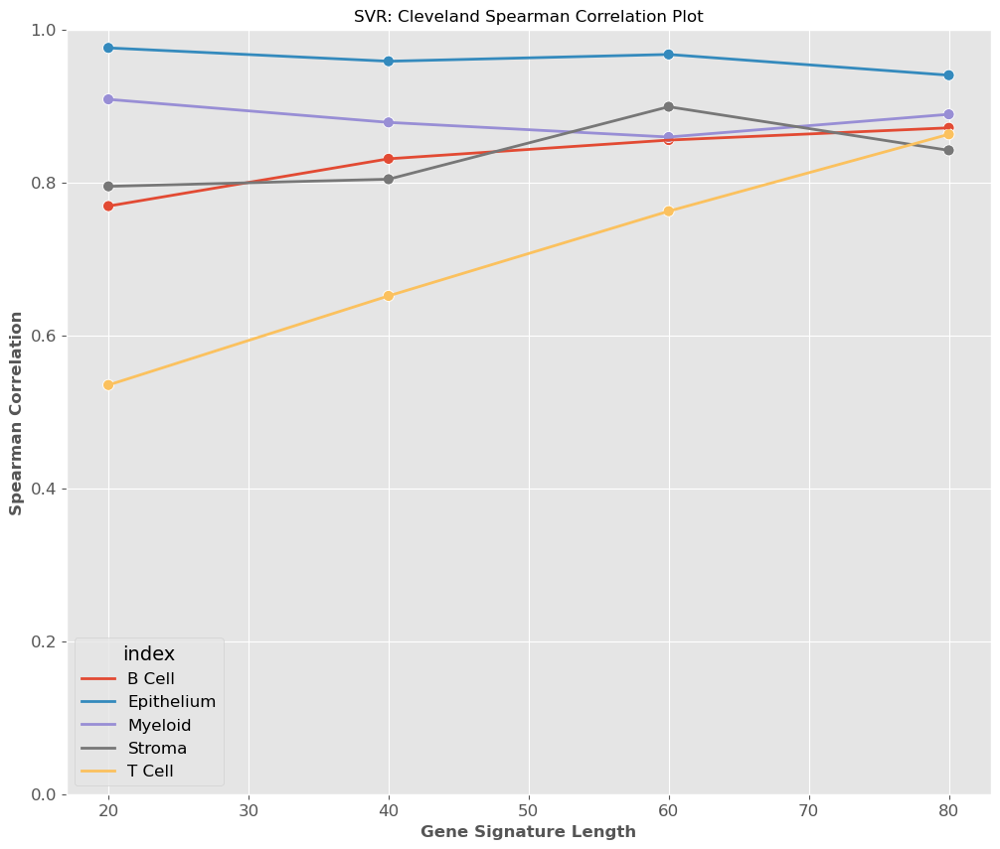

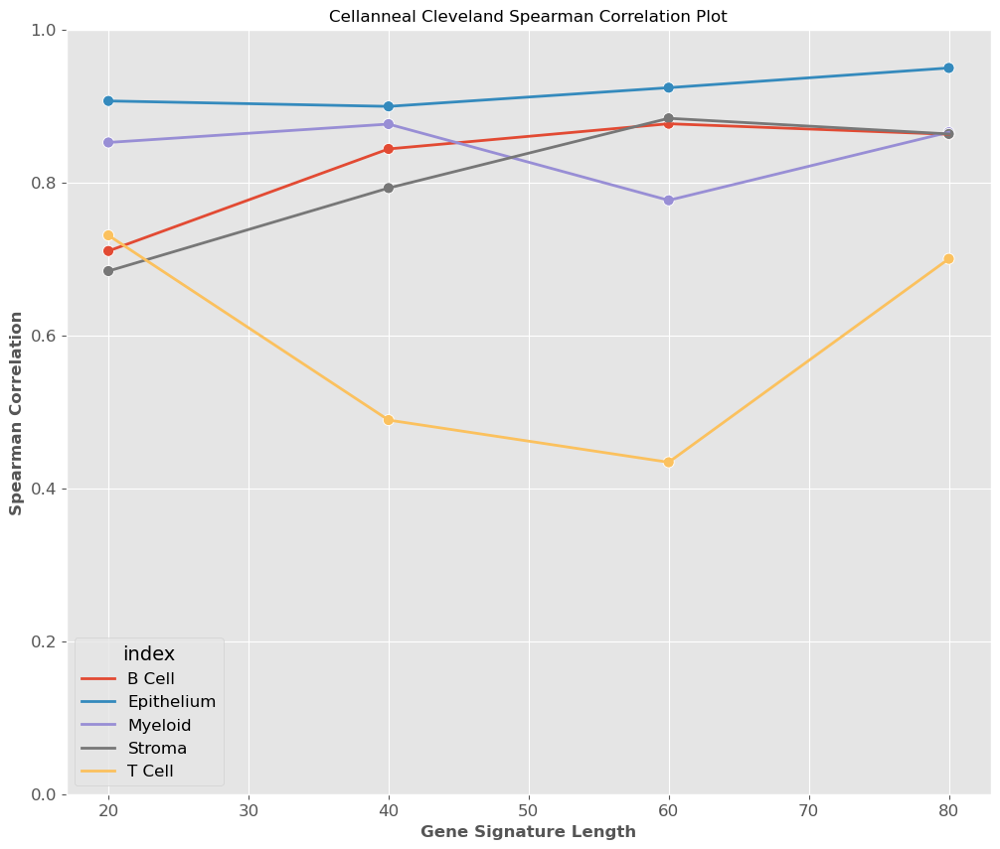

In [82]:
lineplot(df_cleveland, "Cleveland")

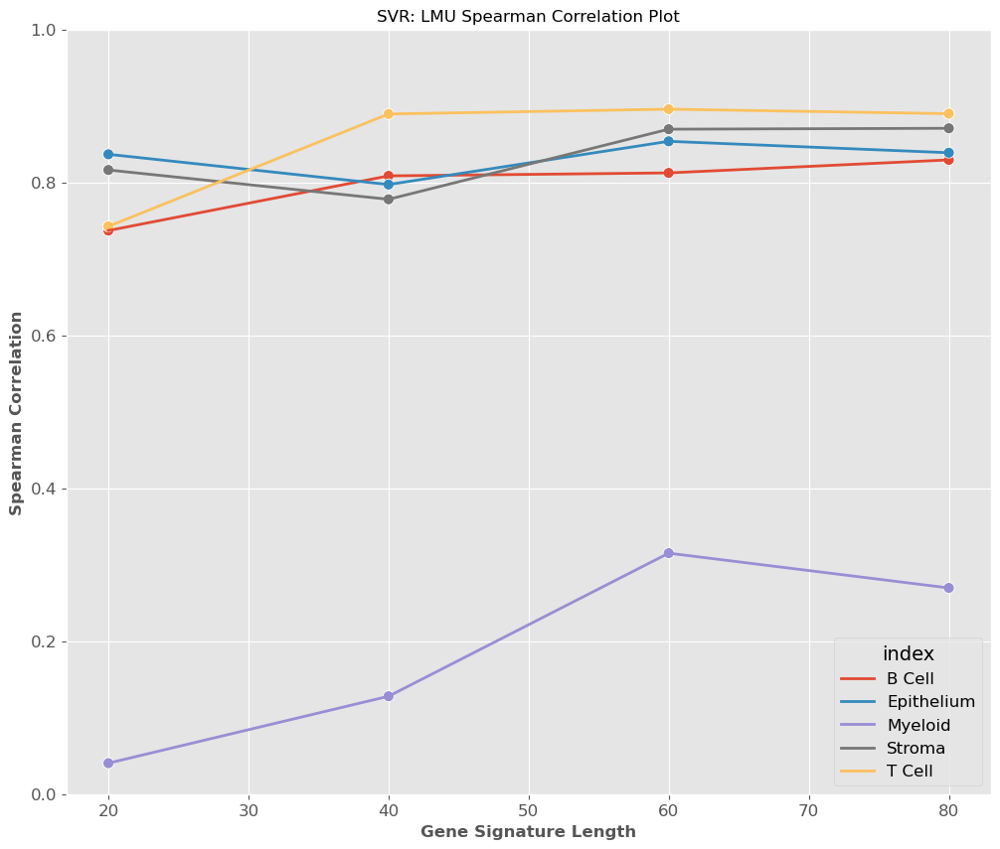

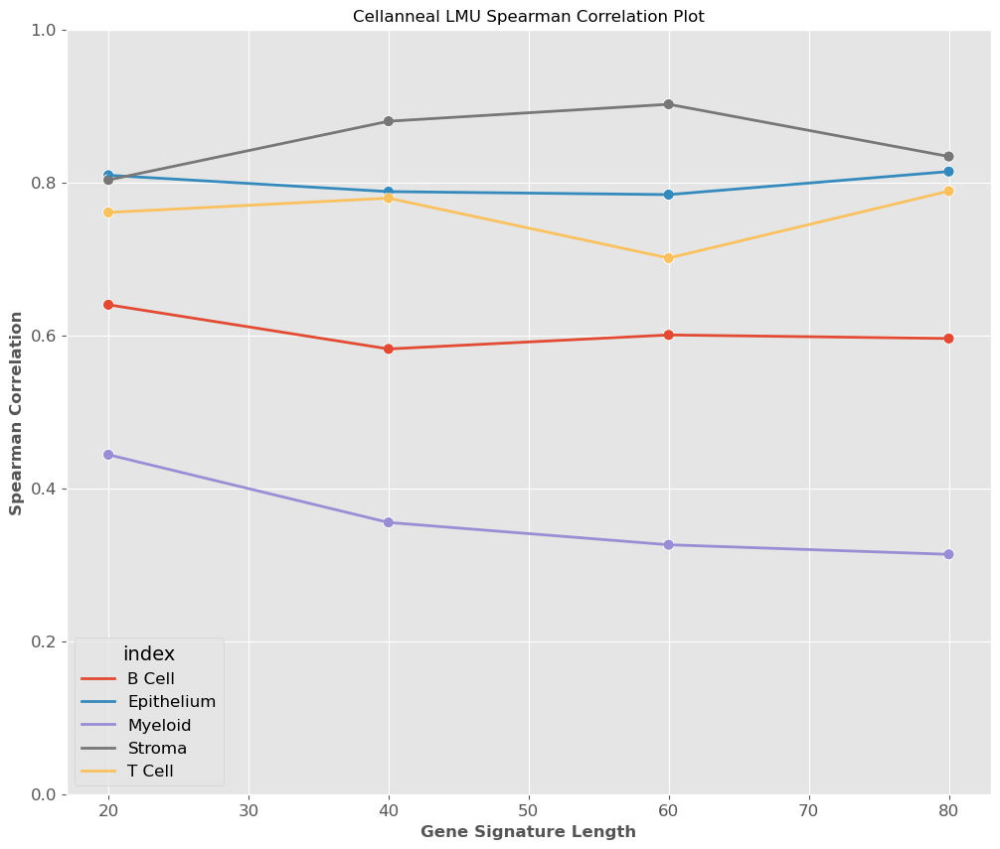

In [14]:
lineplot(df_lmu, "LMU")